In [152]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/h2o-olympics-h2o-world-india/AQI_Hackathon/sample_submission.csv
/kaggle/input/h2o-olympics-h2o-world-india/AQI_Hackathon/train.csv


<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:#FF718F;
           font-size:20px;
           font-family:Nexa;
           letter-spacing:0.5px">
        <p style="padding: 10px;
              color:black;">
             <b> Import necessary libraries</b>
        </p>
</div>


In [153]:
# Install additional libraries
!pip install pmdarima

In [154]:
# Import libraries 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from tqdm import tqdm
from pmdarima.arima import auto_arima
from pmdarima.arima import ADFTest
from sklearn.preprocessing import LabelEncoder

warnings.filterwarnings('ignore')
%matplotlib inline

tqdm.pandas()

<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:#7C5099;
           font-size:20px;
           font-family:Nexa;
           letter-spacing:0.5px">
        <p style="padding: 10px;
              color:white;">
            <b> Import Given Dataset</b>
        </p>
</div>


In [155]:
train_df = pd.read_csv('/kaggle/input/h2o-olympics-h2o-world-india/AQI_Hackathon/train.csv', parse_dates=["Date"])
display(train_df.head().style.set_caption('Train data'))

submission_df = pd.read_csv('/kaggle/input/h2o-olympics-h2o-world-india/AQI_Hackathon/sample_submission.csv')
display(submission_df.head().style.set_caption('Submission data'))

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI
0,AS_4_2021-08-17,AS,4,2021-08-17 00:00:00,51.836400,120.370200,18.023400,0.489600,14.310600,94.000000
1,AS_4_2021-08-18,AS,4,2021-08-18 00:00:00,59.476200,87.097800,34.527000,0.479400,14.759400,124.000000
2,AS_4_2021-08-19,AS,4,2021-08-19 00:00:00,61.077600,79.600800,42.054600,0.520200,16.748400,82.000000
3,AS_4_2021-08-20,AS,4,2021-08-20 00:00:00,56.722200,94.207200,45.787800,0.499800,27.611400,107.000000
4,AS_4_2021-08-21,AS,4,2021-08-21 00:00:00,85.333200,136.782000,44.563800,1.111800,26.418000,107.000000


,ID_Date,AQI
0,AS_4_2022-12-04,10.000000
1,AS_4_2022-12-05,10.000000
2,AS_4_2022-12-06,10.000000
3,AS_4_2022-12-07,10.000000
4,AS_4_2022-12-08,10.000000


<div class="alert alert-block alert-info" style="font-size:15px; font-family:nexa">
Let's separate ID_Date in test data as well for analysis purposes.

In [156]:
def test_date_features(df):
    df[['StateCode','StationId','Date']] = df['ID_Date'].progress_apply(lambda x: pd.Series(str(x).split("_")))
    return df

In [157]:
sample_df = test_date_features(submission_df)
sample_df

100%|██████████| 1120/1120 [00:00<00:00, 4226.20it/s]


,ID_Date,AQI,StateCode,StationId,Date
0,AS_4_2022-12-04,10.0,AS,4,2022-12-04
1,AS_4_2022-12-05,10.0,AS,4,2022-12-05
2,AS_4_2022-12-06,10.0,AS,4,2022-12-06
3,AS_4_2022-12-07,10.0,AS,4,2022-12-07
4,AS_4_2022-12-08,10.0,AS,4,2022-12-08
...,...,...,...,...,...
1115,WB_16_2022-12-27,10.0,WB,16,2022-12-27
1116,WB_16_2022-12-28,10.0,WB,16,2022-12-28
1117,WB_16_2022-12-29,10.0,WB,16,2022-12-29
1118,WB_16_2022-12-30,10.0,WB,16,2022-12-30


<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:#FF718F;
           font-size:20px;
           font-family:Nexa;
           letter-spacing:0.5px">
        <p style="padding: 10px;
              color:black;">
             <b> EDA </b>
        </p>
</div>

In [158]:
train_df['StationId'].unique()

array([ 4,  6,  8, 12, 13, 18, 19, 21, 23, 25, 26, 27, 29, 30, 32, 35, 38,
       39, 40, 41,  7,  9, 10, 11, 14, 15, 16, 17,  5])

In [159]:
train_df['StationId'].nunique()

29

In [160]:
train_df.groupby(['StationId','StateCode'])['StationId','StateCode'].count()

StationId  StateCode
StationId StateCode                      
4         AS               464        464
          DL               560        560
5         TN               344        344
6         DL               837        837
7         KA               691        691
8         DL               686        686
          TN               350        350
9         KA               688        688
10        KA               687        687
          MH               356        356
11        KA               688        688
          MH               338        338
12        DL               837        837
          MH               356        356
          WB               362        362
13        DL               837        837
          MH               358        358
          WB               359        359
14        KA               691        691
          MH               342        342
          WB               565        565
15        MH               359        359
16        MH               359        359
          WB               770        770
17        MH               351        351
18        DL               837        837
19        DL               837        837
21        DL               837        837
23        DL               687        687
25        DL               837        837
26        DL               837        837
27        DL               837        837
29        DL               837        837
30        DL               837        837
32        DL               687        687
35        DL               837        837
38        DL               837        837
39        DL               687        687
40        DL               837        837
41        DL               837        837

<div class="alert alert-block alert-info" style="font-size:14px; font-family:nexa">
There are 40 unique stations and states combinations.

In [161]:
sample_df.groupby(['StationId','StateCode'])['StationId','StateCode'].count()

StationId  StateCode
StationId StateCode                      
10        KA                28         28
          MH                28         28
11        KA                28         28
          MH                28         28
12        DL                28         28
          MH                28         28
          WB                28         28
13        DL                28         28
          MH                28         28
          WB                28         28
14        KA                28         28
          MH                28         28
          WB                28         28
15        MH                28         28
16        MH                28         28
          WB                28         28
17        MH                28         28
18        DL                28         28
19        DL                28         28
21        DL                28         28
23        DL                28         28
25        DL                28         28
26        DL                28         28
27        DL                28         28
29        DL                28         28
30        DL                28         28
32        DL                28         28
35        DL                28         28
38        DL                28         28
39        DL                28         28
4         AS                28         28
          DL                28         28
40        DL                28         28
41        DL                28         28
5         TN                28         28
6         DL                28         28
7         KA                28         28
8         DL                28         28
          TN                28         28
9         KA                28         28

In [162]:
train_df.groupby(['StationId','StateCode'])['StationId','StateCode'].ngroups

40

In [163]:
sample_df.groupby(['StationId','StateCode'])['StationId','StateCode'].ngroups

40

<div class="alert alert-block alert-info" style="font-size:14px; font-family:nexa">
Both train and test contain same ids 

<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:#2AB28C;
           font-size:20px;
           font-family:Nexa;
           letter-spacing:0.5px">
        <p style="padding: 10px;
              color:white;">
            <b>Train Data Observations</b>
        </p>
</div>

In [164]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25340 entries, 0 to 25339
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   ID_Date    25340 non-null  object        
 1   StateCode  25340 non-null  object        
 2   StationId  25340 non-null  int64         
 3   Date       25340 non-null  datetime64[ns]
 4   PM2.5      25339 non-null  float64       
 5   PM10       25338 non-null  float64       
 6   O3         25324 non-null  float64       
 7   CO         25339 non-null  float64       
 8   SO2        25340 non-null  float64       
 9   AQI        25340 non-null  float64       
dtypes: datetime64[ns](1), float64(6), int64(1), object(2)
memory usage: 1.9+ MB


* We observe that columns like PM2.5,PM10,O3,CO have null values which need to be handled. 
* Columns like ID_Date,StateCode,Date are non numerical and need to be handled.

<AxesSubplot:>

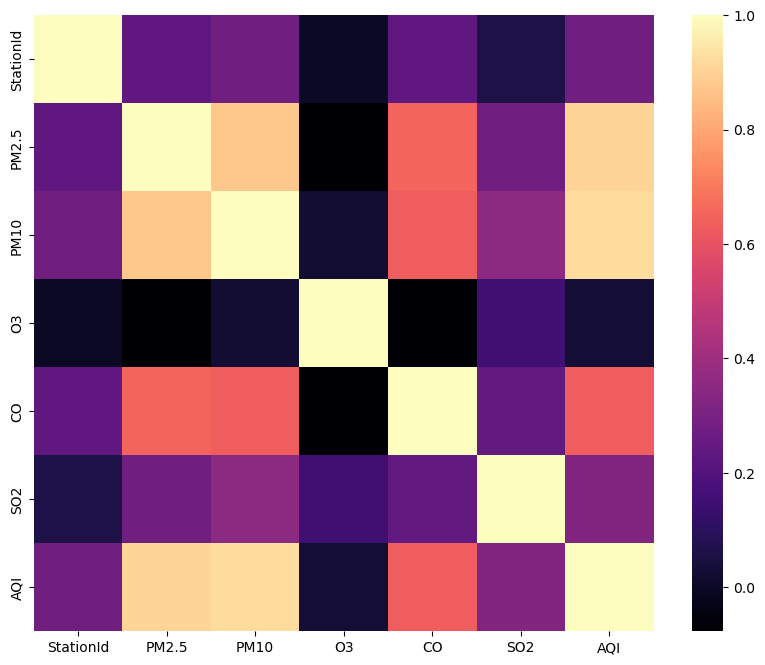

In [165]:
df_corr = train_df.corr()
plt.figure(figsize=(10,8))
sns.heatmap(df_corr,cmap='magma')

In [166]:
df_corr['AQI'].sort_values(ascending=False)

AQI          1.000000
PM10         0.920804
PM2.5        0.905868
CO           0.632309
SO2          0.325900
StationId    0.277209
O3           0.031148
Name: AQI, dtype: float64

In [167]:
df_corr['PM10'].sort_values(ascending=False)

PM10         1.000000
AQI          0.920804
PM2.5        0.876318
CO           0.630923
SO2          0.353308
StationId    0.279367
O3           0.025042
Name: PM10, dtype: float64

In [168]:
df_corr['PM2.5'].sort_values(ascending=False)

PM2.5        1.000000
AQI          0.905868
PM10         0.876318
CO           0.654574
SO2          0.277299
StationId    0.234719
O3          -0.076854
Name: PM2.5, dtype: float64

<div class="alert alert-block alert-info" style="font-size:14px; font-family:nexa">
We can observe that AQI related the least to O3

<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:#2AB28C;
           font-size:20px;
           font-family:Nexa;
           letter-spacing:0.5px">
        <p style="padding: 10px;
              color:white;">
            <b>Test Data Observations</b>
        </p>
</div>

<div class="alert alert-block alert-info" style="font-size:16px; font-family:nexa">

* Test data has only data related to id and Date. 
* Preparation of test set for relevant feature for each location needs to be done before training.

<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:#7C5099;
           font-size:20px;
           font-family:Nexa;
           letter-spacing:0.5px">
        <p style="padding: 10px;
              color:white;">
            <b> Data Preprocessing </b>
        </p>
</div>

<div class="alert alert-block alert-info" style="font-size:17px; font-family:nexa">

Based on above observations, following steps need to be taken for train set preparation - 
    
  - Feature Extraction
  - Null value handling by imputation and interpolation
  - Conversion of categorical columns to numerical columns 
  - Missing Dates Handling
  - Outlier detection and handling for all relevant features as per each location
  - Pollutant subindex and AQI formula feature addition
  

In [169]:
df = train_df.copy()

# Feature Extraction

In [170]:
df['DateTime'] = pd.to_datetime(df['Date'], infer_datetime_format=True)

df['Date']       = df['DateTime'].dt.date.astype('datetime64')
df['DayOfWeek']  = df['DateTime'].dt.day_of_week
df['DayOfMonth'] = df['DateTime'].dt.day
df['WeekOfYear'] = df['DateTime'].dt.week
df['Month']      = df['DateTime'].dt.month
df['DayOfYear']  = df['DateTime'].dt.dayofyear

df.drop(columns='DateTime', inplace=True, axis=1)

df.head()

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear
0,AS_4_2021-08-17,AS,4,2021-08-17,51.8364,120.3702,18.0234,0.4896,14.3106,94.0,1,17,33,8,229
1,AS_4_2021-08-18,AS,4,2021-08-18,59.4762,87.0978,34.5270,0.4794,14.7594,124.0,2,18,33,8,230
2,AS_4_2021-08-19,AS,4,2021-08-19,61.0776,79.6008,42.0546,0.5202,16.7484,82.0,3,19,33,8,231
3,AS_4_2021-08-20,AS,4,2021-08-20,56.7222,94.2072,45.7878,0.4998,27.6114,107.0,4,20,33,8,232
4,AS_4_2021-08-21,AS,4,2021-08-21,85.3332,136.7820,44.5638,1.1118,26.4180,107.0,5,21,33,8,233


<div class="alert alert-block alert-info" style="font-size:15px; font-family:nexa">
    
    New features - DayOfWeek , DayOfMonth, WeekOfYear, Month, DayOfYear added


In [171]:
df["ID"] = df['StateCode'] + "-" + df["StationId"].astype(str)

# Imputation of Null Values

In [172]:
nan_per = df.isna().sum()
nan_per

ID_Date        0
StateCode      0
StationId      0
Date           0
PM2.5          1
PM10           2
O3            16
CO             1
SO2            0
AQI            0
DayOfWeek      0
DayOfMonth     0
WeekOfYear     0
Month          0
DayOfYear      0
ID             0
dtype: int64

**PM2.5**

In [173]:
df[df['PM2.5'].isnull()]

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID
2547,DL_12_2020-08-02,DL,12,2020-08-02,NaN,338.44,4.0,1.58,27.68,311.0,6,2,31,8,215,DL-12


In [174]:
df[(df['StateCode'] == 'DL') & (df['StationId'] == 12)].sort_values(by=['Date']).head()

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID
2547,DL_12_2020-08-02,DL,12,2020-08-02,NaN,338.44,4.00,1.58,27.68,311.0,6,2,31,8,215,DL-12
2548,DL_12_2020-08-03,DL,12,2020-08-03,56.50,284.96,4.00,1.41,29.60,256.0,0,3,32,8,216,DL-12
2549,DL_12_2020-08-04,DL,12,2020-08-04,56.50,294.12,3.63,0.94,28.88,239.0,1,4,32,8,217,DL-12
2550,DL_12_2020-08-05,DL,12,2020-08-05,56.50,333.96,42.05,1.60,34.36,264.0,2,5,32,8,218,DL-12
2551,DL_12_2020-08-06,DL,12,2020-08-06,57.67,334.62,37.68,1.43,38.34,306.0,3,6,32,8,219,DL-12


<AxesSubplot:xlabel='DayOfMonth', ylabel='PM2.5'>

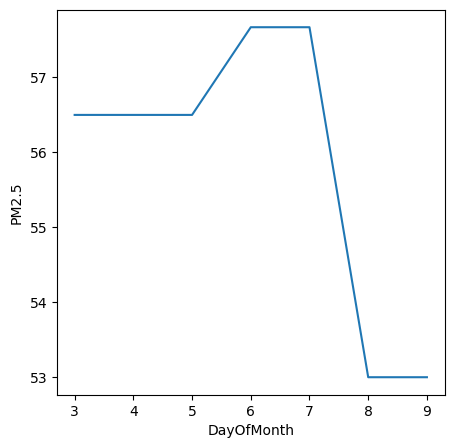

In [175]:
plt.figure(figsize=(5,5))
sns.lineplot(data=df[(df['StateCode'] == 'DL') & (df['StationId'] == 12)].head(8),
             x='DayOfMonth',
             y='PM2.5'
)

In [176]:
df['PM2.5'] = df['PM2.5'].bfill() # Next Observation Carried Backward

In [177]:
df[df['PM2.5'].isnull()]

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID


**PM10**

In [178]:
df[df['PM10'].isnull()]

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID
17705,KA_10_2021-01-04,KA,10,2021-01-04,13.23,NaN,8.97,0.46,6.18,44.0,0,4,1,1,4,KA-10
17706,KA_10_2021-01-05,KA,10,2021-01-05,13.58,NaN,8.43,0.40,5.91,37.0,1,5,1,1,5,KA-10


In [179]:
df[(df['StateCode'] == 'KA') & (df['StationId'] == 10)].sort_values(by=['Date']).head()

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID
17705,KA_10_2021-01-04,KA,10,2021-01-04,13.23,NaN,8.97,0.46,6.18,44.0,0,4,1,1,4,KA-10
17706,KA_10_2021-01-05,KA,10,2021-01-05,13.58,NaN,8.43,0.40,5.91,37.0,1,5,1,1,5,KA-10
17707,KA_10_2021-01-06,KA,10,2021-01-06,12.26,24.84,22.47,0.43,10.64,38.0,2,6,1,1,6,KA-10
17708,KA_10_2021-01-07,KA,10,2021-01-07,8.56,17.08,28.15,0.53,15.57,42.0,3,7,1,1,7,KA-10
17709,KA_10_2021-01-08,KA,10,2021-01-08,10.82,22.69,24.11,0.51,15.08,41.0,4,8,1,1,8,KA-10


<AxesSubplot:xlabel='DayOfMonth', ylabel='PM10'>

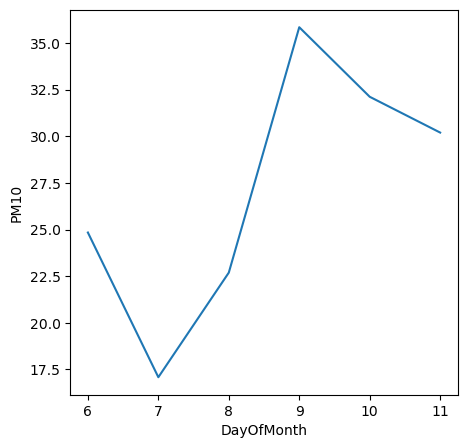

In [180]:
plt.figure(figsize=(5,5))
sns.lineplot(data=df[(df['StateCode'] == 'KA') & (df['StationId'] == 10)].head(8),
             x='DayOfMonth',
             y='PM10'
)

In [181]:
df['PM10'].interpolate(limit=2, limit_direction='backward', method='spline', order=1, inplace=True)

In [182]:
df[df['PM10'].isnull()]

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID


**CO**

In [183]:
df[df['CO'].isnull()]

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID
19080,KA_14_2020-12-30,KA,14,2020-12-30,28.55,106.08,8.48,NaN,8.24,113.0,2,30,53,12,365,KA-14


In [184]:
df[(df['StateCode'] == 'KA') & (df['StationId'] == 14)].sort_values(by=['Date']).head()

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID
19080,KA_14_2020-12-30,KA,14,2020-12-30,28.55,106.08,8.48,NaN,8.24,113.0,2,30,53,12,365,KA-14
19081,KA_14_2021-01-01,KA,14,2021-01-01,30.56,98.76,8.45,0.62,9.19,101.0,4,1,53,1,1,KA-14
19082,KA_14_2021-01-02,KA,14,2021-01-02,25.01,95.14,8.35,1.13,8.26,96.0,5,2,53,1,2,KA-14
19083,KA_14_2021-01-03,KA,14,2021-01-03,38.86,114.12,7.00,1.59,9.52,104.0,6,3,53,1,3,KA-14
19084,KA_14_2021-01-04,KA,14,2021-01-04,30.16,117.95,6.37,1.41,8.17,113.0,0,4,1,1,4,KA-14


<AxesSubplot:xlabel='DayOfWeek', ylabel='CO'>

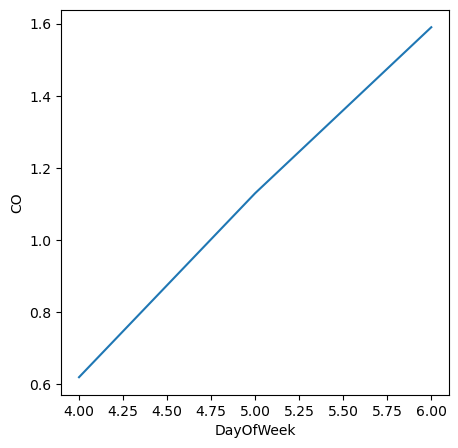

In [185]:
plt.figure(figsize=(5,5))
sns.lineplot(data=df[(df['StateCode'] == 'KA') & (df['StationId'] == 14)].head(4),
             x='DayOfWeek',
             y='CO'
)

In [186]:
df['CO'].interpolate(limit=1, limit_direction='backward', method='spline', order=1, inplace=True)

**O3**

In [187]:
df[df['O3'].isnull()]

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID
1024,DL_6_2020-08-02,DL,6,2020-08-02,187.25,359.17,NaN,0.97,11.00,376.0,6,2,31,8,215,DL-6
1025,DL_6_2020-08-03,DL,6,2020-08-03,146.50,299.54,NaN,0.85,14.29,329.0,0,3,32,8,216,DL-6
4221,DL_18_2020-08-02,DL,18,2020-08-02,200.96,393.25,NaN,1.53,12.11,427.0,6,2,31,8,215,DL-18
4222,DL_18_2020-08-03,DL,18,2020-08-03,186.25,384.29,NaN,1.44,10.34,345.0,0,3,32,8,216,DL-18
5058,DL_19_2020-08-02,DL,19,2020-08-02,185.79,337.06,NaN,1.91,12.98,346.0,6,2,31,8,215,DL-19
5059,DL_19_2020-08-03,DL,19,2020-08-03,130.14,260.18,NaN,1.43,25.56,322.0,0,3,32,8,216,DL-19
7419,DL_25_2020-08-02,DL,25,2020-08-02,126.30,209.51,NaN,0.59,4.24,312.0,6,2,31,8,215,DL-25
7420,DL_25_2020-08-03,DL,25,2020-08-03,131.71,212.50,NaN,0.47,5.84,311.0,0,3,32,8,216,DL-25
8256,DL_26_2020-08-02,DL,26,2020-08-02,149.71,239.92,NaN,0.78,9.67,333.0,6,2,31,8,215,DL-26
8257,DL_26_2020-08-03,DL,26,2020-08-03,134.78,230.92,NaN,0.71,11.66,314.0,0,3,32,8,216,DL-26


In [188]:
df[(df['StateCode'] == 'DL') & (df['StationId'] == 6)].sort_values(by=['Date']).head()

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID
1024,DL_6_2020-08-02,DL,6,2020-08-02,187.25,359.17,NaN,0.97,11.00,376.0,6,2,31,8,215,DL-6
1025,DL_6_2020-08-03,DL,6,2020-08-03,146.50,299.54,NaN,0.85,14.29,329.0,0,3,32,8,216,DL-6
1026,DL_6_2020-08-04,DL,6,2020-08-04,174.88,305.00,3.38,0.88,13.66,340.0,1,4,32,8,217,DL-6
1027,DL_6_2020-08-05,DL,6,2020-08-05,209.42,369.75,27.58,1.03,16.38,357.0,2,5,32,8,218,DL-6
1028,DL_6_2020-08-06,DL,6,2020-08-06,172.46,332.79,25.52,0.94,14.22,355.0,3,6,32,8,219,DL-6


<AxesSubplot:xlabel='Date', ylabel='O3'>

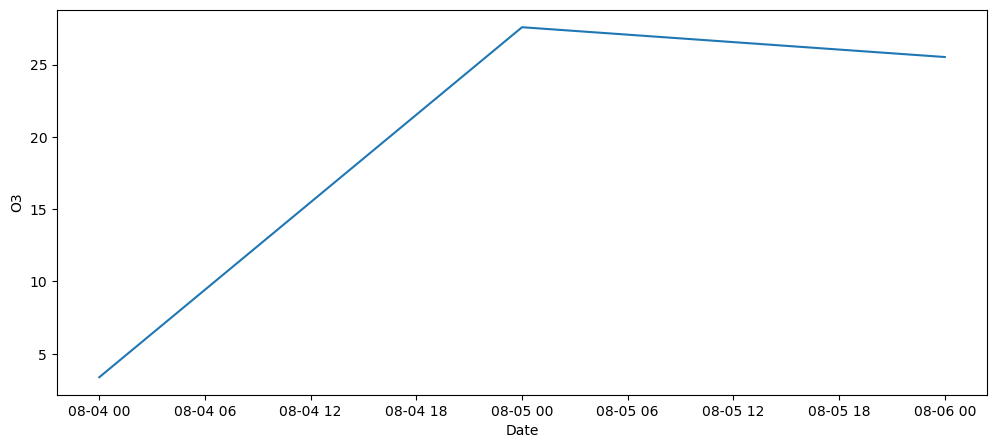

In [189]:
plt.figure(figsize=(12,5))
sns.lineplot(data=df[(df['StateCode'] == 'DL') & (df['StationId'] == 6)].head(5),
             x='Date',
             y='O3'
)

In [190]:
O3_null_ids = df[df['O3'].isnull()]['StationId'].unique()
O3_null_ids

array([ 6, 18, 19, 25, 26, 27, 30, 40])

In [191]:
df['O3'].interpolate(limit=2, limit_direction='backward', method='spline', order=1, inplace=True)

In [192]:
df[df['O3'].isnull()]

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID


In [193]:
nan_per = df.isna().sum()
nan_per

ID_Date       0
StateCode     0
StationId     0
Date          0
PM2.5         0
PM10          0
O3            0
CO            0
SO2           0
AQI           0
DayOfWeek     0
DayOfMonth    0
WeekOfYear    0
Month         0
DayOfYear     0
ID            0
dtype: int64

<div class="alert alert-block alert-info" style="font-size:15px; font-family:nexa"> Thus all null values are handled
    


# Categorical to Numerical

In [194]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25340 entries, 0 to 25339
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   ID_Date     25340 non-null  object        
 1   StateCode   25340 non-null  object        
 2   StationId   25340 non-null  int64         
 3   Date        25340 non-null  datetime64[ns]
 4   PM2.5       25340 non-null  float64       
 5   PM10        25340 non-null  float64       
 6   O3          25340 non-null  float64       
 7   CO          25340 non-null  float64       
 8   SO2         25340 non-null  float64       
 9   AQI         25340 non-null  float64       
 10  DayOfWeek   25340 non-null  int64         
 11  DayOfMonth  25340 non-null  int64         
 12  WeekOfYear  25340 non-null  int64         
 13  Month       25340 non-null  int64         
 14  DayOfYear   25340 non-null  int64         
 15  ID          25340 non-null  object        
dtypes: datetime64[ns](1), 

In [195]:
from sklearn.utils import column_or_1d
from sklearn.preprocessing import LabelEncoder
class MyLabelEncoder(LabelEncoder):
    def fit(self, y):
        y = column_or_1d(y, warn=True)
        self.classes_ = pd.Series(y).unique()
        return self
mle = MyLabelEncoder()
mle.fit(df['ID'])
df['ID'] = mle.transform(df['ID'])
df['ID'] = df['ID'].astype('int64')
df

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID
0,AS_4_2021-08-17,AS,4,2021-08-17,51.8364,120.3702,18.0234,0.48960,14.3106,94.0,1,17,33,8,229,0
1,AS_4_2021-08-18,AS,4,2021-08-18,59.4762,87.0978,34.5270,0.47940,14.7594,124.0,2,18,33,8,230,0
2,AS_4_2021-08-19,AS,4,2021-08-19,61.0776,79.6008,42.0546,0.52020,16.7484,82.0,3,19,33,8,231,0
3,AS_4_2021-08-20,AS,4,2021-08-20,56.7222,94.2072,45.7878,0.49980,27.6114,107.0,4,20,33,8,232,0
4,AS_4_2021-08-21,AS,4,2021-08-21,85.3332,136.7820,44.5638,1.11180,26.4180,107.0,5,21,33,8,233,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25335,WB_16_2022-11-29,WB,16,2022-11-29,16.3275,33.8940,36.5190,0.65100,3.5490,47.0,1,29,48,11,333,39
25336,WB_16_2022-11-30,WB,16,2022-11-30,15.2880,29.9145,37.2225,0.63525,2.9400,52.0,2,30,48,11,334,39
25337,WB_16_2022-12-01,WB,16,2022-12-01,14.1015,31.1325,27.1845,0.67200,5.4285,41.0,3,1,48,12,335,39
25338,WB_16_2022-12-02,WB,16,2022-12-02,17.8605,30.5340,30.0510,0.59850,7.4235,40.0,4,2,48,12,336,39


In [196]:
df.ID.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39])

In [197]:
mle.classes_

array(['AS-4', 'DL-4', 'DL-6', 'DL-8', 'DL-12', 'DL-13', 'DL-18', 'DL-19',
       'DL-21', 'DL-23', 'DL-25', 'DL-26', 'DL-27', 'DL-29', 'DL-30',
       'DL-32', 'DL-35', 'DL-38', 'DL-39', 'DL-40', 'DL-41', 'KA-7',
       'KA-9', 'KA-10', 'KA-11', 'KA-14', 'MH-10', 'MH-11', 'MH-12',
       'MH-13', 'MH-14', 'MH-15', 'MH-16', 'MH-17', 'TN-5', 'TN-8',
       'WB-12', 'WB-13', 'WB-14', 'WB-16'], dtype=object)

In [198]:
mle.transform(['DL-12'])[0]

4

# Missing Dates handling

In [199]:
date_handled_df = pd.DataFrame(columns=df.columns)
for station in sorted(df['ID'].unique().tolist()):
    print('NEW LOCATION -',station)
    location_train_df = df[df["ID"] == station]
    
    print(len(location_train_df['Date']))

    
    
    start = min(location_train_df['Date'])
    end = max(location_train_df['Date'])
    
    print(start,end)
    
    diff = pd.date_range(start = start, end = end).difference(location_train_df.Date)
    
    print(len(diff))
    
    print(diff)
    
    print('NEW LOCATION -',station)
    print(location_train_df.head(30))
        
    # create example dataframe
    for date in diff.to_list():
        # create dictionary for new row
        new_row = {k:np.nan for k in location_train_df.columns.to_list()}
        
        new_row['Date'] = date
        new_row['StateCode'] = location_train_df['StateCode'].unique().tolist()[0]
        new_row['StationId'] = location_train_df['StationId'].unique().tolist()[0]
        new_row['ID'] = mle.transform([new_row['StateCode'] + "-" + str(new_row["StationId"])])[0]
        new_row['ID_Date'] = str(new_row['ID']) + "_" + new_row['Date'].strftime('%Y-%m-%d')
        

        # append the new row to the dataframe
        location_train_df = location_train_df.append(new_row, ignore_index=True)
        
    location_train_df = location_train_df.sort_values(['Date']).reset_index(drop=True)
        
    location_train_df['DateTime'] = pd.to_datetime(location_train_df['Date'], infer_datetime_format=True)

    location_train_df['DayOfWeek']  = location_train_df['DateTime'].dt.day_of_week
    location_train_df['DayOfMonth'] = location_train_df['DateTime'].dt.day
    location_train_df['WeekOfYear'] = location_train_df['DateTime'].dt.week
    location_train_df['Month']      = location_train_df['DateTime'].dt.month
    location_train_df['DayOfYear']  = location_train_df['DateTime'].dt.dayofyear

    location_train_df.drop(columns='DateTime', inplace=True, axis=1)
    
    for col in ['PM2.5', 'PM10', 'O3', 'CO', 'SO2', 'AQI']:
        location_train_df[col].interpolate(limit=5, limit_direction='backward', method='spline', order=1, inplace=True)
    
    print('NEW LOCATION -',station)
    print(location_train_df.head(30))
    
    print('NEW LOCATION -',station)
    print(location_train_df.isna().sum())
    
    date_handled_df = date_handled_df.append(location_train_df, ignore_index=True)

NEW LOCATION - 0
464
2021-08-17 00:00:00 2022-12-03 00:00:00
10
DatetimeIndex(['2021-08-29', '2021-08-30', '2021-08-31', '2021-10-31',
               '2021-12-31', '2022-03-31', '2022-05-31', '2022-08-30',
               '2022-08-31', '2022-10-31'],
              dtype='datetime64[ns]', freq=None)
NEW LOCATION - 0
            ID_Date StateCode  StationId       Date     PM2.5      PM10  \
0   AS_4_2021-08-17        AS          4 2021-08-17   51.8364  120.3702   
1   AS_4_2021-08-18        AS          4 2021-08-18   59.4762   87.0978   
2   AS_4_2021-08-19        AS          4 2021-08-19   61.0776   79.6008   
3   AS_4_2021-08-20        AS          4 2021-08-20   56.7222   94.2072   
4   AS_4_2021-08-21        AS          4 2021-08-21   85.3332  136.7820   
5   AS_4_2021-08-22        AS          4 2021-08-22  144.6360  248.7882   
6   AS_4_2021-08-23        AS          4 2021-08-23  135.9252  224.3490   
7   AS_4_2021-08-24        AS          4 2021-08-24   71.2980  117.1878   
8   AS_4_

In [202]:
date_handled_df.ID.unique()

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39], dtype=object)

In [203]:
date_handled_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25823 entries, 0 to 25822
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   ID_Date     25823 non-null  object        
 1   StateCode   25823 non-null  object        
 2   StationId   25823 non-null  object        
 3   Date        25823 non-null  datetime64[ns]
 4   PM2.5       25823 non-null  float64       
 5   PM10        25823 non-null  float64       
 6   O3          25823 non-null  float64       
 7   CO          25823 non-null  float64       
 8   SO2         25823 non-null  float64       
 9   AQI         25823 non-null  float64       
 10  DayOfWeek   25823 non-null  object        
 11  DayOfMonth  25823 non-null  object        
 12  WeekOfYear  25823 non-null  object        
 13  Month       25823 non-null  object        
 14  DayOfYear   25823 non-null  object        
 15  ID          25823 non-null  object        
dtypes: datetime64[ns](1), 

In [204]:
for i in ['DayOfWeek', 'DayOfMonth', 'WeekOfYear', 'Month', 'DayOfYear', 'ID']:
    date_handled_df[i] = date_handled_df[i].astype('int64')

**Since ID feature has been created StationId can be dropped **

In [205]:
date_handled_df = date_handled_df.drop(['StationId'],axis =1)

In [206]:
date_handled_df.head()

,ID_Date,StateCode,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID
0,AS_4_2021-08-17,AS,2021-08-17,51.8364,120.3702,18.0234,0.4896,14.3106,94.0,1,17,33,8,229,0
1,AS_4_2021-08-18,AS,2021-08-18,59.4762,87.0978,34.5270,0.4794,14.7594,124.0,2,18,33,8,230,0
2,AS_4_2021-08-19,AS,2021-08-19,61.0776,79.6008,42.0546,0.5202,16.7484,82.0,3,19,33,8,231,0
3,AS_4_2021-08-20,AS,2021-08-20,56.7222,94.2072,45.7878,0.4998,27.6114,107.0,4,20,33,8,232,0
4,AS_4_2021-08-21,AS,2021-08-21,85.3332,136.7820,44.5638,1.1118,26.4180,107.0,5,21,33,8,233,0


In [209]:
date_handled_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25823 entries, 0 to 25822
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   ID_Date     25823 non-null  object        
 1   StateCode   25823 non-null  object        
 2   Date        25823 non-null  datetime64[ns]
 3   PM2.5       25823 non-null  float64       
 4   PM10        25823 non-null  float64       
 5   O3          25823 non-null  float64       
 6   CO          25823 non-null  float64       
 7   SO2         25823 non-null  float64       
 8   AQI         25823 non-null  float64       
 9   DayOfWeek   25823 non-null  int64         
 10  DayOfMonth  25823 non-null  int64         
 11  WeekOfYear  25823 non-null  int64         
 12  Month       25823 non-null  int64         
 13  DayOfYear   25823 non-null  int64         
 14  ID          25823 non-null  int64         
dtypes: datetime64[ns](1), float64(6), int64(6), object(2)
memory usage: 3.

# Outlier Handling

<div class="alert alert-block alert-info" style="font-size:15px; font-family:nexa">  
  <p> For handling Outliers effectively, we apply a simple logic here </p>
    <p>   -  If distribution is <b><font color = red > normal</b> , then method would be trimming & std deviation </p>
<p>    - If distribution is <b><font color = red > skewed</b> , then method would be capping & IQR </p>
    

In [210]:
df2 = date_handled_df.copy()

In [211]:
def outlier_detection(df,feature,status):
    plt.figure(figsize=(4,3))
    plt.suptitle(f"Distribution {status} handling for {feature}", fontsize=15)
    plt.subplot(1,2,1)
    sns.kdeplot(data = df[feature])
    print(df[feature])
    plt.subplot(1,2,2)
    sns.boxplot(data = df[feature], palette="magma")
    plt.tight_layout()
    plt.show()

In [212]:
def skewed_outlier_handling(df,feature):
    
    #finding the Q1(25 percentile) and Q3(75 percentile)
    q1 = df[feature].quantile(0.25)
    q2 = df[feature].quantile(0.75)
    
    #finding out the value of Inter Quartile Range
    IQR = q2 - q1
    
    #defining max and min limits
    max_limit = q2 + (1.5 * IQR)
    min_limit = q1 - (1.5 * IQR) 
    
    print(df.shape)
    print(len(df[feature]))
    
    #capping
    df_skew_new = pd.DataFrame(np.where(df[feature] > max_limit, max_limit, 
         (np.where(df[feature] < min_limit, min_limit, df[feature]))), columns=[feature])
    
    print(len(df_skew_new[feature]))
    
    df[feature] =  df_skew_new[feature]
    print(df.shape)
          
    return df

Example outlier handling for one location ID

<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:#2AB28C;
           font-size:20px;
           font-family:Nexa;
           letter-spacing:0.5px">
        <p style="padding: 10px;
              color:white;">
            <b>Feature 1 - PM2.5</b>
        </p>
</div>

In [213]:
# outlier_detection(df2,'PM2.5')

<div class="alert alert-block alert-info" style="font-size:15px; font-family:nexa"> 
    This is a skewed distribution. Hence we will apply IQR method for handling outliers.

In [214]:
# df2 = skewed_outlier_handling(df2,'PM2.5')

In [215]:
# outlier_detection(df2,'PM2.5')

<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:#2AB28C;
           font-size:20px;
           font-family:Nexa;
           letter-spacing:0.5px">
        <p style="padding: 10px;
              color:white;">
            <b>Feature 2 - PM10</b>
        </p>
</div>

In [216]:
# outlier_detection(df2,'PM10')

<div class="alert alert-block alert-info" style="font-size:15px; font-family:nexa"> 
    This is a skewed distribution. Hence we will apply IQR method for handling outliers.

In [217]:
# df2 = skewed_outlier_handling(df2,'PM10')

In [218]:
# outlier_detection(df2,'PM10')

<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:#2AB28C;
           font-size:20px;
           font-family:Nexa;
           letter-spacing:0.5px">
        <p style="padding: 10px;
              color:white;">
            <b>Feature 3 - CO</b>
        </p>
</div>

In [219]:
# outlier_detection(df2,'CO')

<div class="alert alert-block alert-info" style="font-size:15px; font-family:nexa"> 
    This is a skewed distribution. Hence we will apply IQR method for handling outliers.

In [220]:
# df2 = skewed_outlier_handling(df2,'CO')

In [221]:
# outlier_detection(df2,'CO')

<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:#2AB28C;
           font-size:20px;
           font-family:Nexa;
           letter-spacing:0.5px">
        <p style="padding: 10px;
              color:white;">
            <b>Feature 4 - SO2</b>
        </p>
</div>

In [222]:
# outlier_detection(df2,'SO2')

<div class="alert alert-block alert-info" style="font-size:15px; font-family:nexa"> 
    This is a skewed distribution. Hence we will apply IQR method for handling outliers.

In [223]:
# df2 = skewed_outlier_handling(df2,'SO2')

In [224]:
# outlier_detection(df2,'SO2')

<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:#2AB28C;
           font-size:20px;
           font-family:Nexa;
           letter-spacing:0.5px">
        <p style="padding: 10px;
              color:white;">
            <b>Feature 5 - O3</b>
        </p>
</div>

In [225]:
# outlier_detection(df2,'O3')

<div class="alert alert-block alert-info" style="font-size:15px; font-family:nexa"> 
    This is a skewed distribution. Hence we will apply IQR method for handling outliers.

In [226]:
# df2 = skewed_outlier_handling(df2,'O3')

In [227]:
# outlier_detection(df2,'AQI')

In [228]:
# outlier_detection(df2,'O3')

NEW LOCATION - 0
0      51.83640
1      59.47620
2      61.07760
3      56.72220
4      85.33320
         ...   
469    16.74750
470    26.16075
471    25.71450
472    24.21300
473    18.32250
Name: PM2.5, Length: 474, dtype: float64


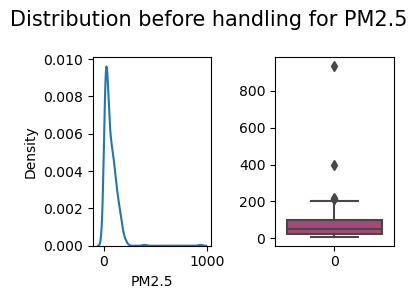

(474, 16)
474
474
(474, 16)
0      51.83640
1      59.47620
2      61.07760
3      56.72220
4      85.33320
         ...   
469    16.74750
470    26.16075
471    25.71450
472    24.21300
473    18.32250
Name: PM2.5, Length: 474, dtype: float64


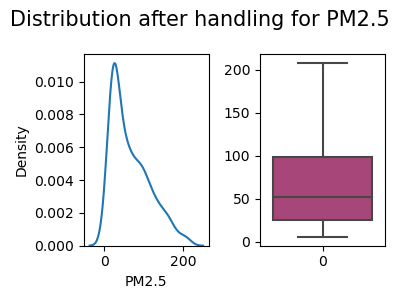

0      120.3702
1       87.0978
2       79.6008
3       94.2072
4      136.7820
         ...   
469     29.3265
470     44.9820
471     41.2335
472     42.3465
473     32.0460
Name: PM10, Length: 474, dtype: float64


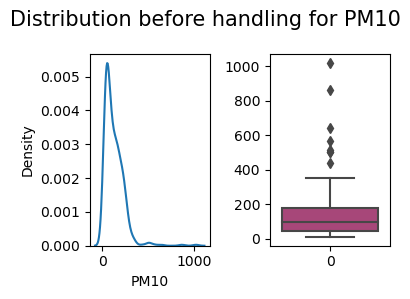

(474, 16)
474
474
(474, 16)
0      120.3702
1       87.0978
2       79.6008
3       94.2072
4      136.7820
         ...   
469     29.3265
470     44.9820
471     41.2335
472     42.3465
473     32.0460
Name: PM10, Length: 474, dtype: float64


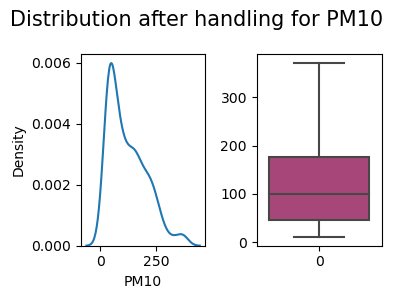

0      0.4896
1      0.4794
2      0.5202
3      0.4998
4      1.1118
        ...  
469    0.4200
470    0.5145
471    0.5985
472    0.5250
473    0.4305
Name: CO, Length: 474, dtype: float64


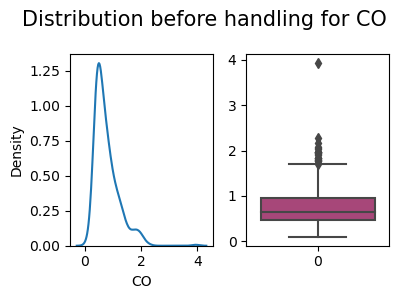

(474, 16)
474
474
(474, 16)
0      0.4896
1      0.4794
2      0.5202
3      0.4998
4      1.1118
        ...  
469    0.4200
470    0.5145
471    0.5985
472    0.5250
473    0.4305
Name: CO, Length: 474, dtype: float64


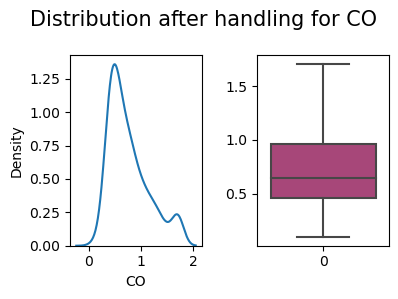

0      14.31060
1      14.75940
2      16.74840
3      27.61140
4      26.41800
         ...   
469    15.84450
470    15.98625
471    16.02300
472    15.97050
473    16.32750
Name: SO2, Length: 474, dtype: float64


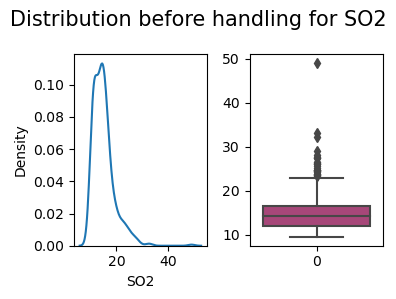

(474, 16)
474
474
(474, 16)
0      14.310600
1      14.759400
2      16.748400
3      23.342738
4      23.342738
         ...    
469    15.844500
470    15.986250
471    16.023000
472    15.970500
473    16.327500
Name: SO2, Length: 474, dtype: float64


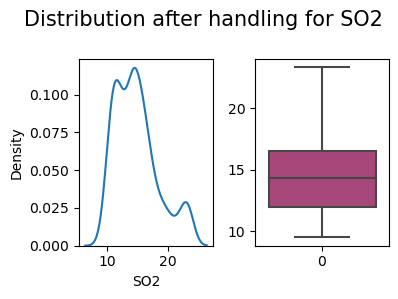

0      18.02340
1      34.52700
2      42.05460
3      45.78780
4      44.56380
         ...   
469    41.85300
470    34.47675
471    27.68850
472    28.18200
473    47.08200
Name: O3, Length: 474, dtype: float64


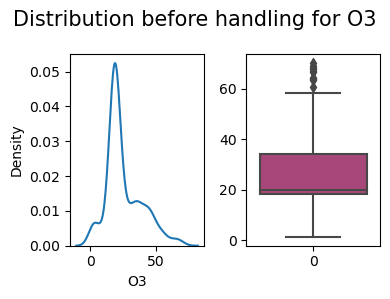

(474, 16)
474
474
(474, 16)
0      18.02340
1      34.52700
2      42.05460
3      45.78780
4      44.56380
         ...   
469    41.85300
470    34.47675
471    27.68850
472    28.18200
473    47.08200
Name: O3, Length: 474, dtype: float64


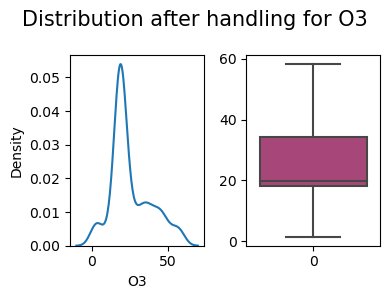

0       94.0
1      124.0
2       82.0
3      107.0
4      107.0
       ...  
469     58.0
470     51.5
471     60.0
472     52.0
473     59.0
Name: AQI, Length: 474, dtype: float64


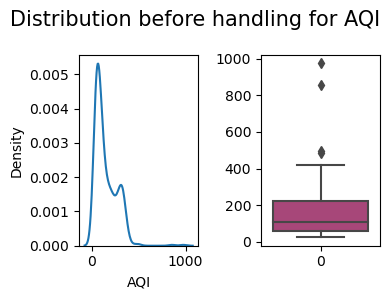

(474, 16)
474
474
(474, 16)
0       94.0
1      124.0
2       82.0
3      107.0
4      107.0
       ...  
469     58.0
470     51.5
471     60.0
472     52.0
473     59.0
Name: AQI, Length: 474, dtype: float64


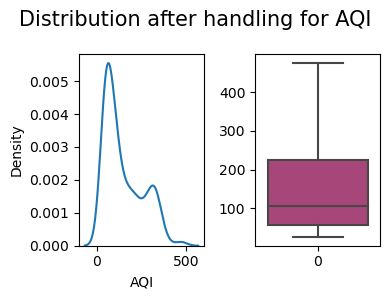

NEW LOCATION - 1
0      238.4300
1      284.8300
2      150.4100
3      106.1100
4      146.2300
         ...   
566     27.8985
567     28.9590
568     37.0650
569     45.7905
570     51.1455
Name: PM2.5, Length: 571, dtype: float64


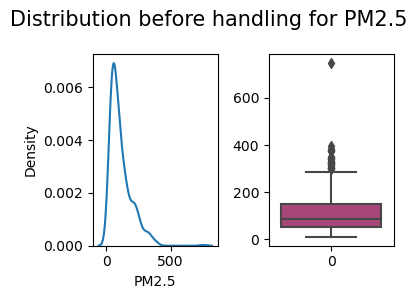

(571, 16)
571
571
(571, 16)
0      238.4300
1      284.8300
2      150.4100
3      106.1100
4      146.2300
         ...   
566     27.8985
567     28.9590
568     37.0650
569     45.7905
570     51.1455
Name: PM2.5, Length: 571, dtype: float64


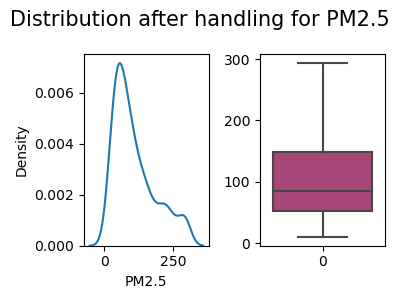

0      348.9100
1      427.4000
2      214.1600
3      154.3600
4      211.3400
         ...   
566     69.6150
567     50.6625
568     54.6420
569     88.0845
570    113.9460
Name: PM10, Length: 571, dtype: float64


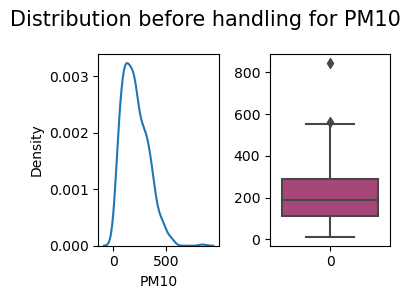

(571, 16)
571
571
(571, 16)
0      348.9100
1      427.4000
2      214.1600
3      154.3600
4      211.3400
         ...   
566     69.6150
567     50.6625
568     54.6420
569     88.0845
570    113.9460
Name: PM10, Length: 571, dtype: float64


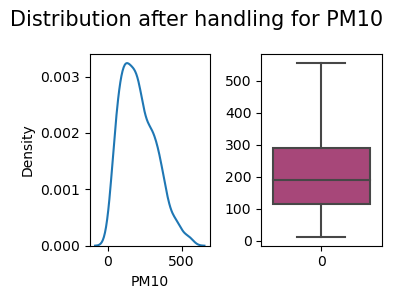

0      1.53000
1      1.43000
2      0.99000
3      0.70000
4      0.71000
        ...   
566    0.70350
567    0.68775
568    0.75600
569    0.67200
570    0.75600
Name: CO, Length: 571, dtype: float64


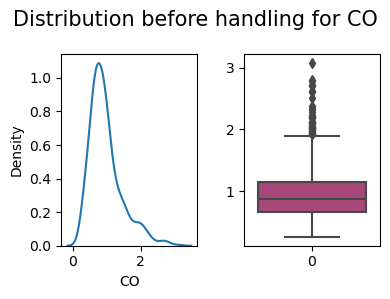

(571, 16)
571
571
(571, 16)
0      1.53000
1      1.43000
2      0.99000
3      0.70000
4      0.71000
        ...   
566    0.70350
567    0.68775
568    0.75600
569    0.67200
570    0.75600
Name: CO, Length: 571, dtype: float64


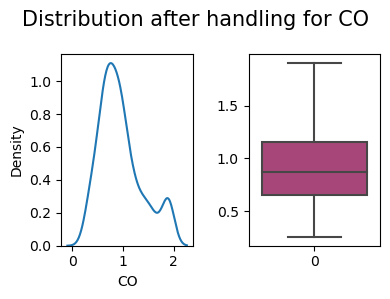

0      14.3800
1      21.3300
2      12.7400
3      12.4600
4      11.6400
        ...   
566     8.7255
567     6.6675
568     8.5575
569     9.0825
570    12.2535
Name: SO2, Length: 571, dtype: float64


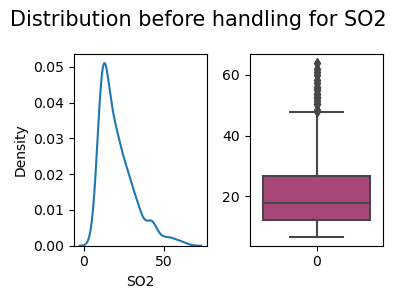

(571, 16)
571
571
(571, 16)
0      14.3800
1      21.3300
2      12.7400
3      12.4600
4      11.6400
        ...   
566     8.7255
567     6.6675
568     8.5575
569     9.0825
570    12.2535
Name: SO2, Length: 571, dtype: float64


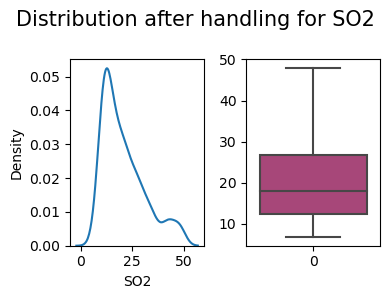

0      45.3100
1      30.4000
2      41.8700
3      27.9300
4      46.1200
        ...   
566    31.5105
567    32.4030
568    35.7525
569    53.5920
570    51.1560
Name: O3, Length: 571, dtype: float64


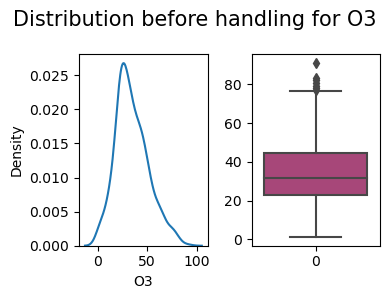

(571, 16)
571
571
(571, 16)
0      45.3100
1      30.4000
2      41.8700
3      27.9300
4      46.1200
        ...   
566    31.5105
567    32.4030
568    35.7525
569    53.5920
570    51.1560
Name: O3, Length: 571, dtype: float64


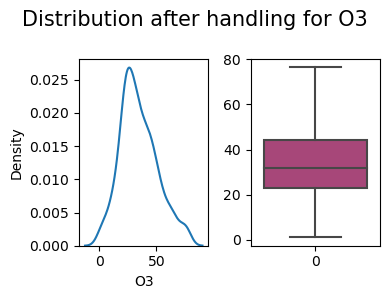

0      404.0
1      406.0
2      372.0
3      280.0
4      319.0
       ...  
566    133.0
567     66.0
568     63.0
569    101.0
570    102.0
Name: AQI, Length: 571, dtype: float64


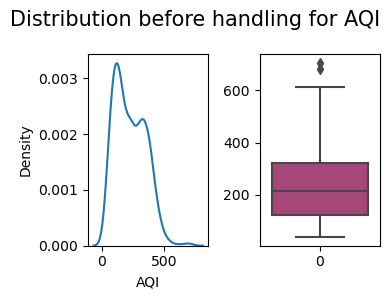

(571, 16)
571
571
(571, 16)
0      404.0
1      406.0
2      372.0
3      280.0
4      319.0
       ...  
566    133.0
567     66.0
568     63.0
569    101.0
570    102.0
Name: AQI, Length: 571, dtype: float64


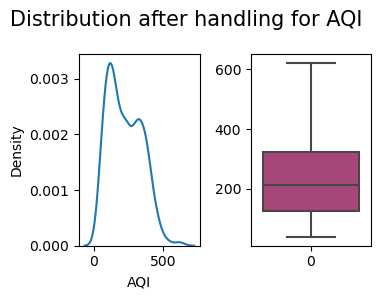

NEW LOCATION - 2
0      187.250
1      146.500
2      174.880
3      209.420
4      172.460
        ...   
849     22.953
850     29.694
851     56.574
852     45.801
853     61.614
Name: PM2.5, Length: 854, dtype: float64


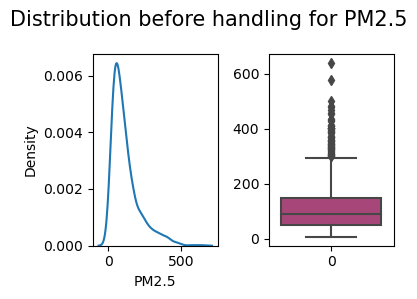

(854, 16)
854
854
(854, 16)
0      187.250
1      146.500
2      174.880
3      209.420
4      172.460
        ...   
849     22.953
850     29.694
851     56.574
852     45.801
853     61.614
Name: PM2.5, Length: 854, dtype: float64


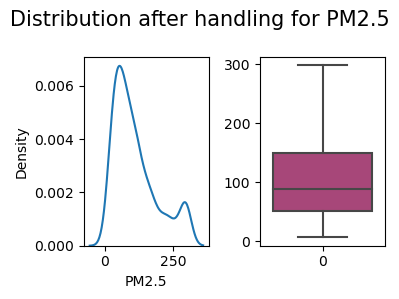

0      359.17000
1      299.54000
2      305.00000
3      369.75000
4      332.79000
         ...    
849     44.36250
850     34.02525
851     58.74750
852     89.98500
853    110.99550
Name: PM10, Length: 854, dtype: float64


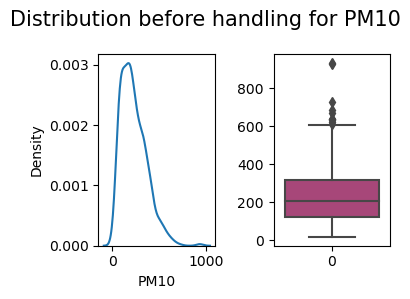

(854, 16)
854
854
(854, 16)
0      359.17000
1      299.54000
2      305.00000
3      369.75000
4      332.79000
         ...    
849     44.36250
850     34.02525
851     58.74750
852     89.98500
853    110.99550
Name: PM10, Length: 854, dtype: float64


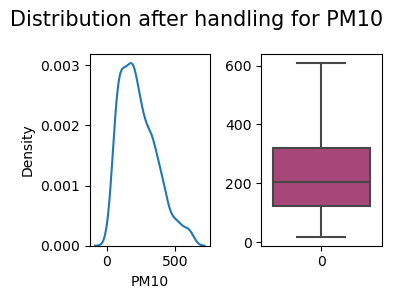

0      0.9700
1      0.8500
2      0.8800
3      1.0300
4      0.9400
        ...  
849    0.6405
850    0.6195
851    0.7770
852    0.7350
853    0.8400
Name: CO, Length: 854, dtype: float64


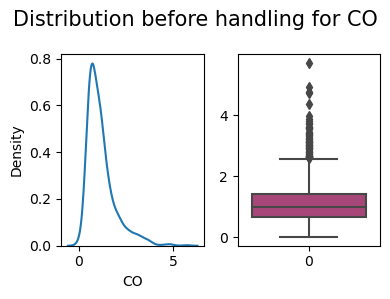

(854, 16)
854
854
(854, 16)
0      0.9700
1      0.8500
2      0.8800
3      1.0300
4      0.9400
        ...  
849    0.6405
850    0.6195
851    0.7770
852    0.7350
853    0.8400
Name: CO, Length: 854, dtype: float64


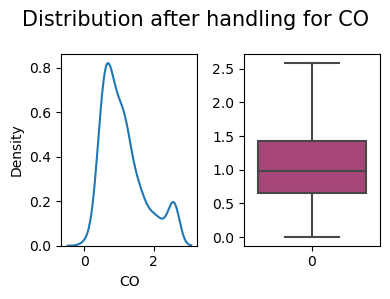

0      11.00000
1      14.29000
2      13.66000
3      16.38000
4      14.22000
         ...   
849    14.10150
850    13.37175
851    18.93150
852    16.64250
853    21.46200
Name: SO2, Length: 854, dtype: float64


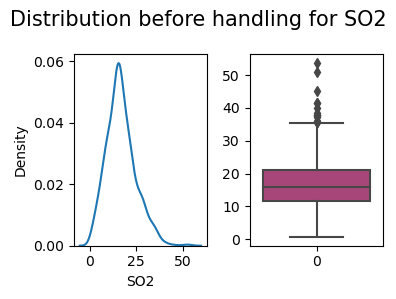

(854, 16)
854
854
(854, 16)
0      11.00000
1      14.29000
2      13.66000
3      16.38000
4      14.22000
         ...   
849    14.10150
850    13.37175
851    18.93150
852    16.64250
853    21.46200
Name: SO2, Length: 854, dtype: float64


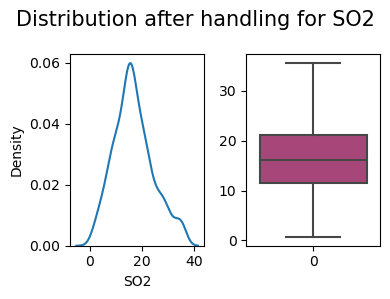

0      35.316451
1      19.523508
2       3.380000
3      27.580000
4      25.520000
         ...    
849    43.102500
850    40.913250
851    39.406500
852    43.932000
853    52.174500
Name: O3, Length: 854, dtype: float64


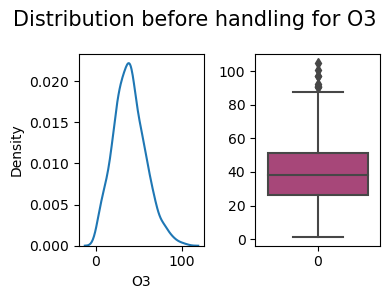

(854, 16)
854
854
(854, 16)
0      35.316451
1      19.523508
2       3.380000
3      27.580000
4      25.520000
         ...    
849    43.102500
850    40.913250
851    39.406500
852    43.932000
853    52.174500
Name: O3, Length: 854, dtype: float64


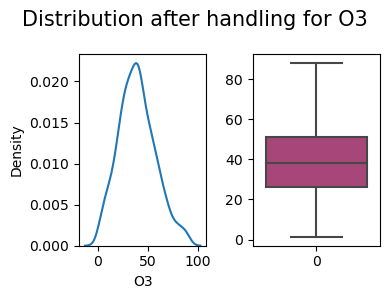

0      376.0
1      329.0
2      340.0
3      357.0
4      355.0
       ...  
849    104.0
850     61.5
851     85.0
852     90.0
853    102.0
Name: AQI, Length: 854, dtype: float64


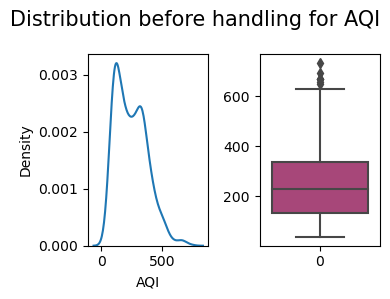

(854, 16)
854
854
(854, 16)
0      376.0
1      329.0
2      340.0
3      357.0
4      355.0
       ...  
849    104.0
850     61.5
851     85.0
852     90.0
853    102.0
Name: AQI, Length: 854, dtype: float64


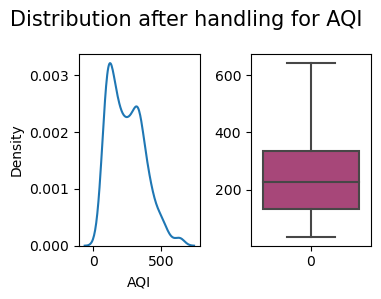

NEW LOCATION - 3
0      53.8200
1      74.2600
2      70.8100
3      97.4100
4      81.8000
        ...   
693    35.5110
694    31.5000
695    62.2650
696    65.0475
697    60.5010
Name: PM2.5, Length: 698, dtype: float64


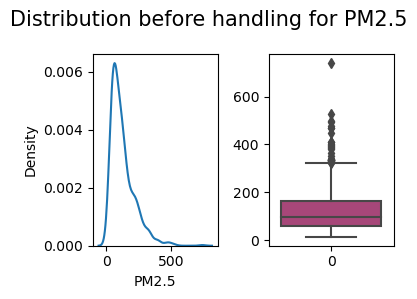

(698, 16)
698
698
(698, 16)
0      53.8200
1      74.2600
2      70.8100
3      97.4100
4      81.8000
        ...   
693    35.5110
694    31.5000
695    62.2650
696    65.0475
697    60.5010
Name: PM2.5, Length: 698, dtype: float64


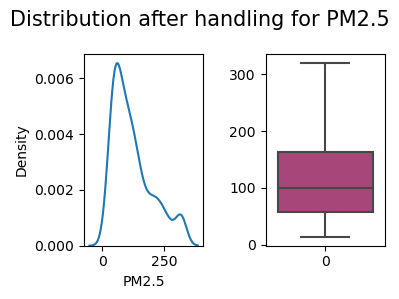

0      140.73000
1      183.57000
2      172.77000
3      235.65000
4      217.32000
         ...    
693     82.63500
694     71.47875
695    127.27050
696    128.74050
697    144.31200
Name: PM10, Length: 698, dtype: float64


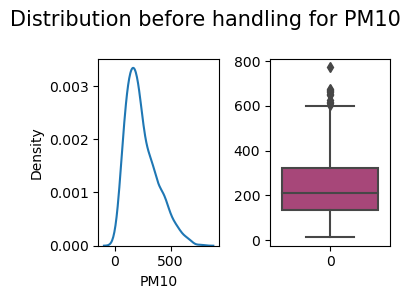

(698, 16)
698
698
(698, 16)
0      140.73000
1      183.57000
2      172.77000
3      235.65000
4      217.32000
         ...    
693     82.63500
694     71.47875
695    127.27050
696    128.74050
697    144.31200
Name: PM10, Length: 698, dtype: float64


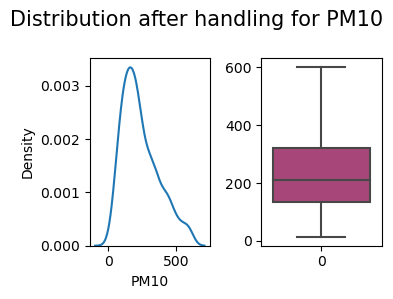

0      0.80000
1      0.73000
2      0.81000
3      0.90000
4      1.01000
        ...   
693    0.60900
694    0.93975
695    1.18650
696    1.49100
697    0.78750
Name: CO, Length: 698, dtype: float64


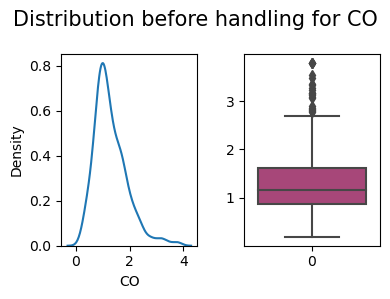

(698, 16)
698
698
(698, 16)
0      0.80000
1      0.73000
2      0.81000
3      0.90000
4      1.01000
        ...   
693    0.60900
694    0.93975
695    1.18650
696    1.49100
697    0.78750
Name: CO, Length: 698, dtype: float64


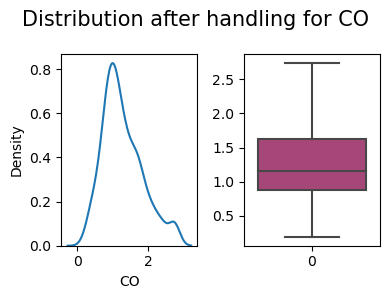

0      13.75000
1      14.97000
2      17.17000
3      14.17000
4      15.39000
         ...   
693    18.45900
694    12.79425
695     8.10600
696    16.61100
697    20.12850
Name: SO2, Length: 698, dtype: float64


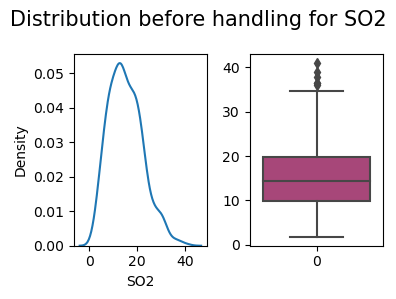

(698, 16)
698
698
(698, 16)
0      13.75000
1      14.97000
2      17.17000
3      14.17000
4      15.39000
         ...   
693    18.45900
694    12.79425
695     8.10600
696    16.61100
697    20.12850
Name: SO2, Length: 698, dtype: float64


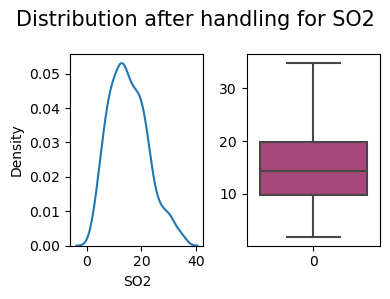

0      45.84000
1      56.74000
2      75.98000
3      71.24000
4      60.18000
         ...   
693    70.81200
694    80.81325
695    79.70550
696    75.74700
697    82.98150
Name: O3, Length: 698, dtype: float64


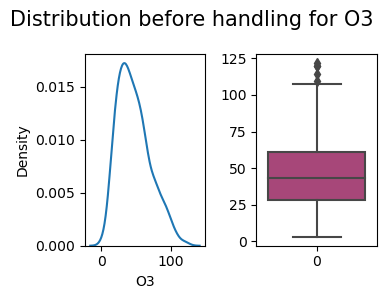

(698, 16)
698
698
(698, 16)
0      45.84000
1      56.74000
2      75.98000
3      71.24000
4      60.18000
         ...   
693    70.81200
694    80.81325
695    79.70550
696    75.74700
697    82.98150
Name: O3, Length: 698, dtype: float64


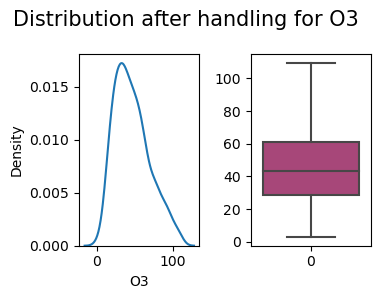

0      126.0
1      151.0
2      144.0
3      190.0
4      188.0
       ...  
693    182.0
694    124.0
695    128.0
696    161.0
697    151.0
Name: AQI, Length: 698, dtype: float64


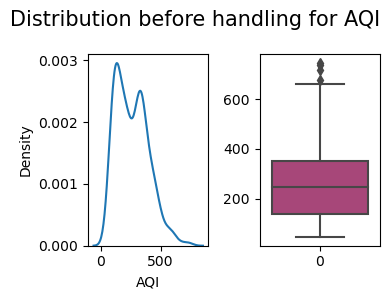

(698, 16)
698
698
(698, 16)
0      126.0
1      151.0
2      144.0
3      190.0
4      188.0
       ...  
693    182.0
694    124.0
695    128.0
696    161.0
697    151.0
Name: AQI, Length: 698, dtype: float64


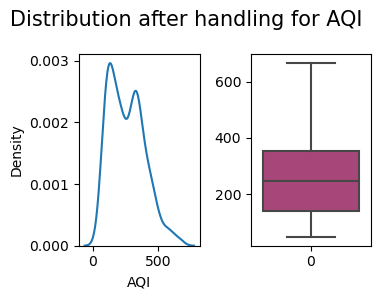

NEW LOCATION - 4
0      56.5000
1      56.5000
2      56.5000
3      56.5000
4      57.6700
        ...   
849    23.0580
850    20.6535
851    36.3195
852    31.1010
853    44.1000
Name: PM2.5, Length: 854, dtype: float64


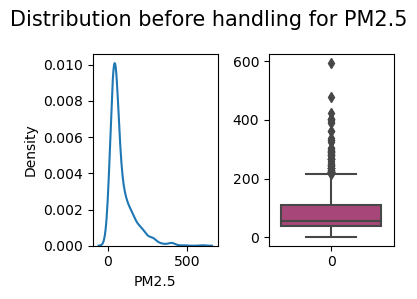

(854, 16)
854
854
(854, 16)
0      56.5000
1      56.5000
2      56.5000
3      56.5000
4      57.6700
        ...   
849    23.0580
850    20.6535
851    36.3195
852    31.1010
853    44.1000
Name: PM2.5, Length: 854, dtype: float64


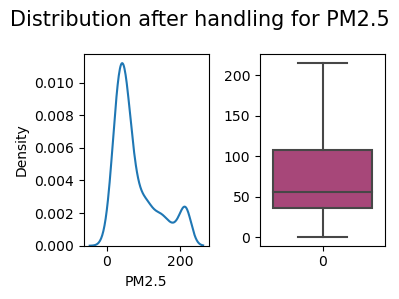

0      338.44000
1      284.96000
2      294.12000
3      333.96000
4      334.62000
         ...    
849     56.74200
850     37.97325
851     75.26400
852     97.71300
853    115.23750
Name: PM10, Length: 854, dtype: float64


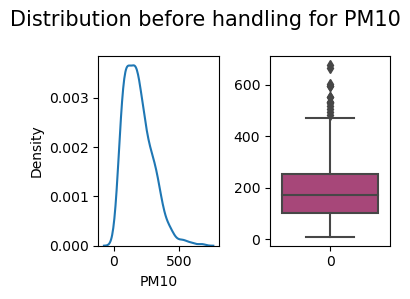

(854, 16)
854
854
(854, 16)
0      338.44000
1      284.96000
2      294.12000
3      333.96000
4      334.62000
         ...    
849     56.74200
850     37.97325
851     75.26400
852     97.71300
853    115.23750
Name: PM10, Length: 854, dtype: float64


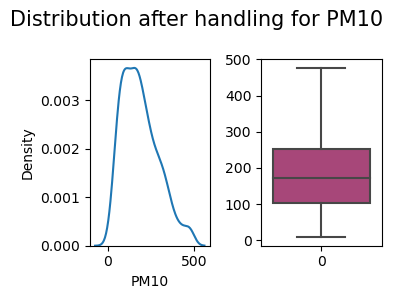

0      1.5800
1      1.4100
2      0.9400
3      1.6000
4      1.4300
        ...  
849    0.5880
850    0.5565
851    0.9555
852    1.2180
853    0.8925
Name: CO, Length: 854, dtype: float64


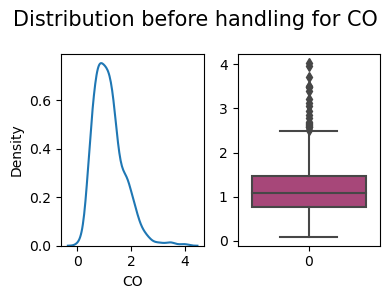

(854, 16)
854
854
(854, 16)
0      1.5800
1      1.4100
2      0.9400
3      1.6000
4      1.4300
        ...  
849    0.5880
850    0.5565
851    0.9555
852    1.2180
853    0.8925
Name: CO, Length: 854, dtype: float64


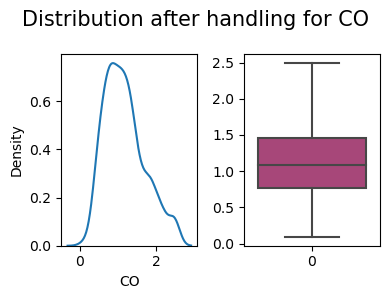

0      27.6800
1      29.6000
2      28.8800
3      34.3600
4      38.3400
        ...   
849    10.0485
850     5.9850
851    10.4265
852    10.3740
853    14.7945
Name: SO2, Length: 854, dtype: float64


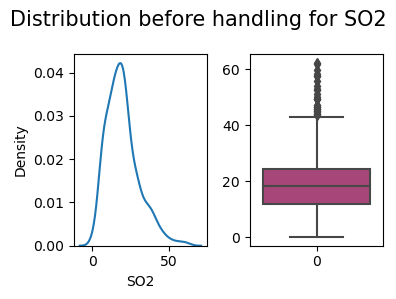

(854, 16)
854
854
(854, 16)
0      27.6800
1      29.6000
2      28.8800
3      34.3600
4      38.3400
        ...   
849    10.0485
850     5.9850
851    10.4265
852    10.3740
853    14.7945
Name: SO2, Length: 854, dtype: float64


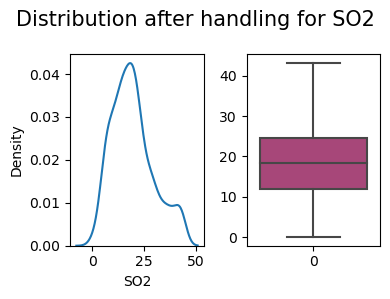

0        4.0000
1        4.0000
2        3.6300
3       42.0500
4       37.6800
         ...   
849     93.0090
850     94.0380
851     98.2275
852    112.4550
853     97.8705
Name: O3, Length: 854, dtype: float64


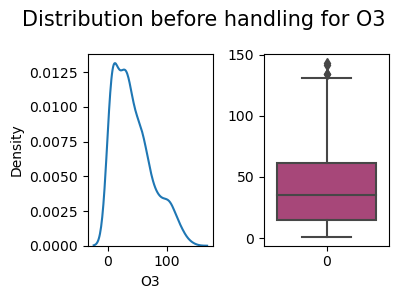

(854, 16)
854
854
(854, 16)
0        4.0000
1        4.0000
2        3.6300
3       42.0500
4       37.6800
         ...   
849     93.0090
850     94.0380
851     98.2275
852    112.4550
853     97.8705
Name: O3, Length: 854, dtype: float64


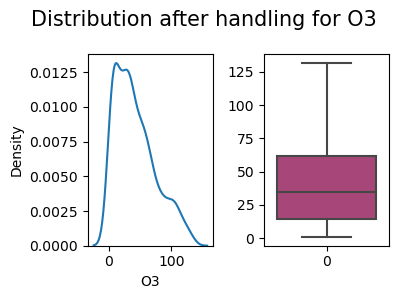

0      311.0
1      256.0
2      239.0
3      264.0
4      306.0
       ...  
849    174.0
850    130.5
851    171.0
852    206.0
853    207.0
Name: AQI, Length: 854, dtype: float64


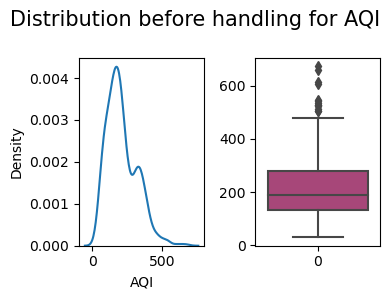

(854, 16)
854
854
(854, 16)
0      311.0
1      256.0
2      239.0
3      264.0
4      306.0
       ...  
849    174.0
850    130.5
851    171.0
852    206.0
853    207.0
Name: AQI, Length: 854, dtype: float64


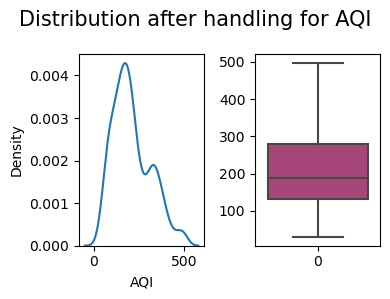

NEW LOCATION - 5
0      205.6200
1      158.2200
2      189.2400
3      206.1700
4      186.5200
         ...   
849     22.9845
850     18.5535
851     35.1855
852     42.6090
853     41.7165
Name: PM2.5, Length: 854, dtype: float64


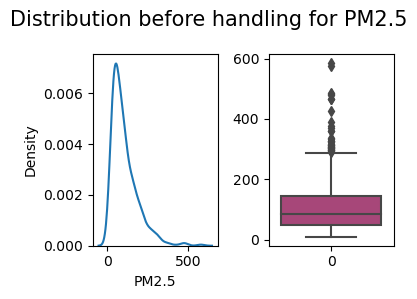

(854, 16)
854
854
(854, 16)
0      205.6200
1      158.2200
2      189.2400
3      206.1700
4      186.5200
         ...   
849     22.9845
850     18.5535
851     35.1855
852     42.6090
853     41.7165
Name: PM2.5, Length: 854, dtype: float64


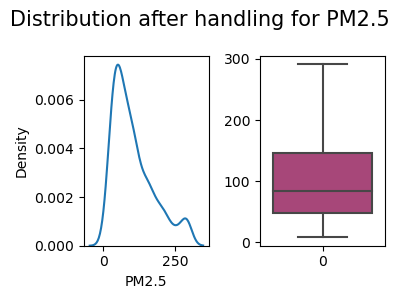

0      410.26000
1      367.15000
2      382.88000
3      501.96000
4      430.84000
         ...    
849     77.60550
850     64.68525
851    118.20900
852    150.22350
853    170.29950
Name: PM10, Length: 854, dtype: float64


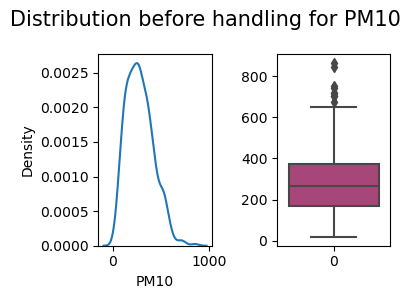

(854, 16)
854
854
(854, 16)
0      410.26000
1      367.15000
2      382.88000
3      501.96000
4      430.84000
         ...    
849     77.60550
850     64.68525
851    118.20900
852    150.22350
853    170.29950
Name: PM10, Length: 854, dtype: float64


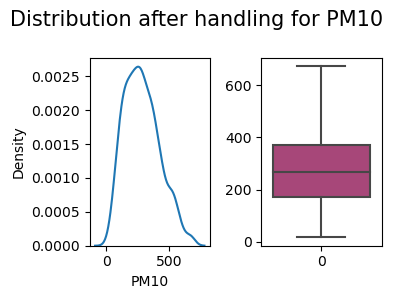

0      1.83000
1      1.92000
2      2.02000
3      2.69000
4      2.31000
        ...   
849    0.55650
850    0.51975
851    0.78750
852    0.64050
853    0.63000
Name: CO, Length: 854, dtype: float64


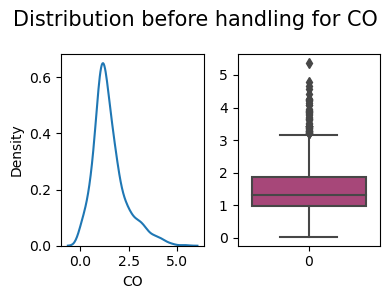

(854, 16)
854
854
(854, 16)
0      1.83000
1      1.92000
2      2.02000
3      2.69000
4      2.31000
        ...   
849    0.55650
850    0.51975
851    0.78750
852    0.64050
853    0.63000
Name: CO, Length: 854, dtype: float64


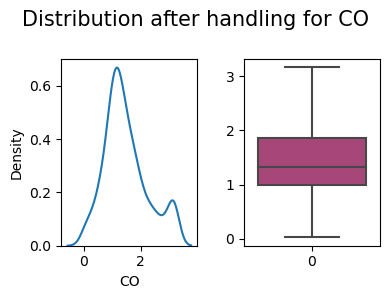

0       5.2100
1       5.4500
2       4.5900
3       6.0600
4       3.1600
        ...   
849    14.5215
850    18.5850
851    15.9390
852    14.3640
853    17.0415
Name: SO2, Length: 854, dtype: float64


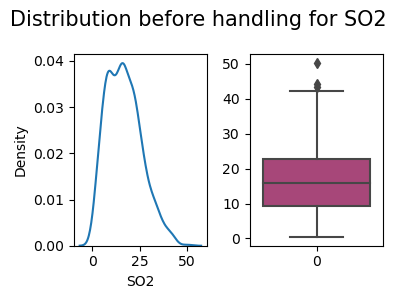

(854, 16)
854
854
(854, 16)
0       5.2100
1       5.4500
2       4.5900
3       6.0600
4       3.1600
        ...   
849    14.5215
850    18.5850
851    15.9390
852    14.3640
853    17.0415
Name: SO2, Length: 854, dtype: float64


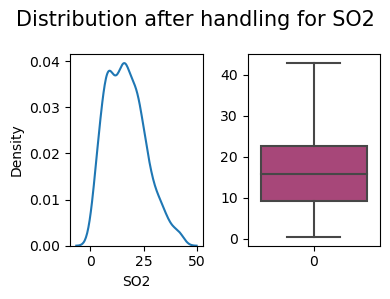

0       7.05000
1       7.05000
2       5.28000
3      41.76000
4      44.68000
         ...   
849    71.30550
850    67.92975
851    94.79400
852    74.86500
853    82.07850
Name: O3, Length: 854, dtype: float64


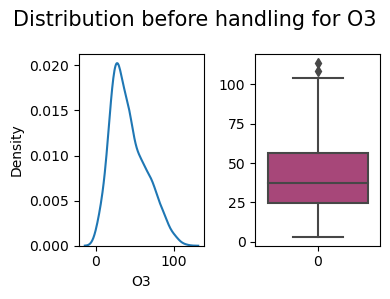

(854, 16)
854
854
(854, 16)
0       7.05000
1       7.05000
2       5.28000
3      41.76000
4      44.68000
         ...   
849    71.30550
850    67.92975
851    94.79400
852    74.86500
853    82.07850
Name: O3, Length: 854, dtype: float64


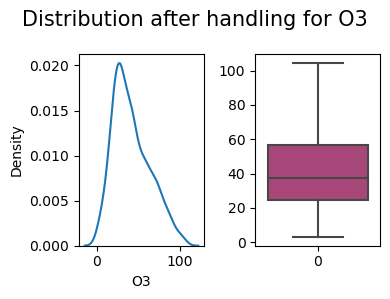

0      427.0
1      354.0
2      346.0
3      405.0
4      498.0
       ...  
849    152.0
850     90.0
851    164.0
852    156.0
853    153.0
Name: AQI, Length: 854, dtype: float64


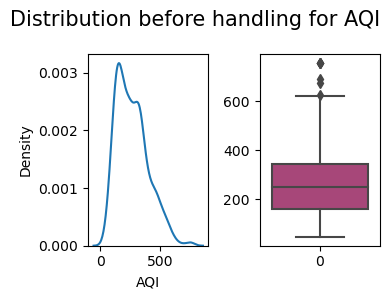

(854, 16)
854
854
(854, 16)
0      427.0
1      354.0
2      346.0
3      405.0
4      498.0
       ...  
849    152.0
850     90.0
851    164.0
852    156.0
853    153.0
Name: AQI, Length: 854, dtype: float64


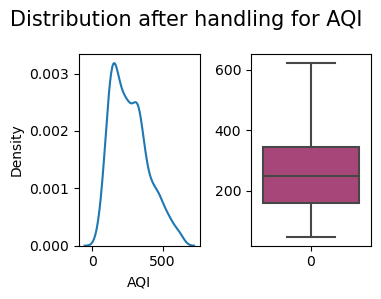

NEW LOCATION - 6
0      200.9600
1      186.2500
2      210.7100
3      269.7900
4      218.0400
         ...   
849     31.6785
850     26.9220
851     45.3600
852     68.6910
853     61.1310
Name: PM2.5, Length: 854, dtype: float64


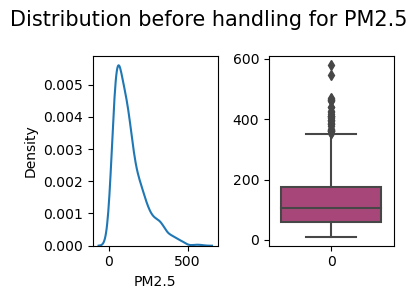

(854, 16)
854
854
(854, 16)
0      200.9600
1      186.2500
2      210.7100
3      269.7900
4      218.0400
         ...   
849     31.6785
850     26.9220
851     45.3600
852     68.6910
853     61.1310
Name: PM2.5, Length: 854, dtype: float64


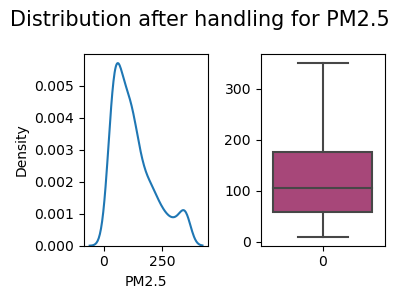

0      393.25000
1      384.29000
2      390.08000
3      483.21000
4      440.38000
         ...    
849    247.34850
850    150.97425
851     84.12600
852     84.12600
853     84.12600
Name: PM10, Length: 854, dtype: float64


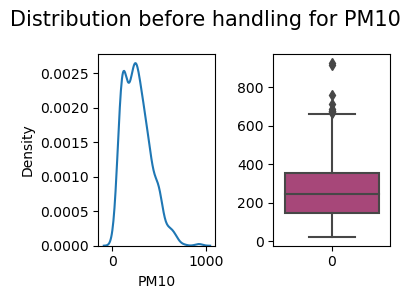

(854, 16)
854
854
(854, 16)
0      393.25000
1      384.29000
2      390.08000
3      483.21000
4      440.38000
         ...    
849    247.34850
850    150.97425
851     84.12600
852     84.12600
853     84.12600
Name: PM10, Length: 854, dtype: float64


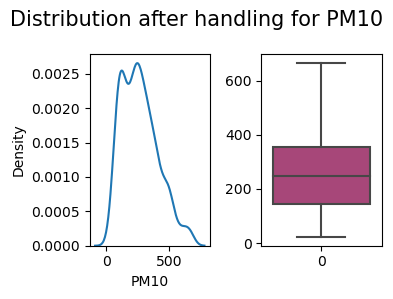

0      1.53000
1      1.44000
2      1.37000
3      1.70000
4      1.61000
        ...   
849    0.91350
850    0.95025
851    0.92400
852    0.97650
853    0.82950
Name: CO, Length: 854, dtype: float64


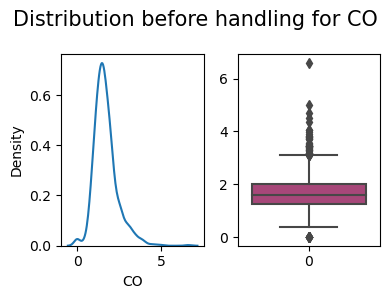

(854, 16)
854
854
(854, 16)
0      1.53000
1      1.44000
2      1.37000
3      1.70000
4      1.61000
        ...   
849    0.91350
850    0.95025
851    0.92400
852    0.97650
853    0.82950
Name: CO, Length: 854, dtype: float64


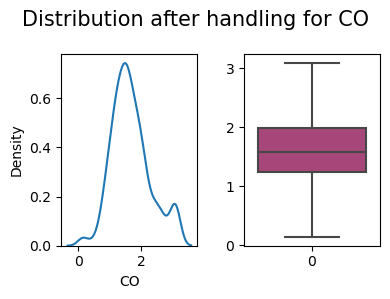

0      12.1100
1      10.3400
2      11.2400
3      15.0500
4      12.6500
        ...   
849     6.7095
850     4.3680
851     4.6095
852     5.9640
853     6.8880
Name: SO2, Length: 854, dtype: float64


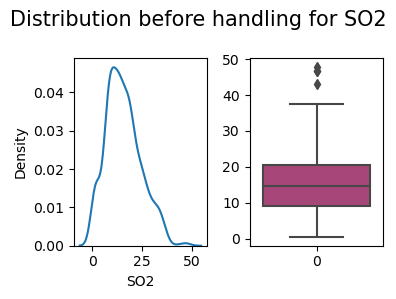

(854, 16)
854
854
(854, 16)
0      12.1100
1      10.3400
2      11.2400
3      15.0500
4      12.6500
        ...   
849     6.7095
850     4.3680
851     4.6095
852     5.9640
853     6.8880
Name: SO2, Length: 854, dtype: float64


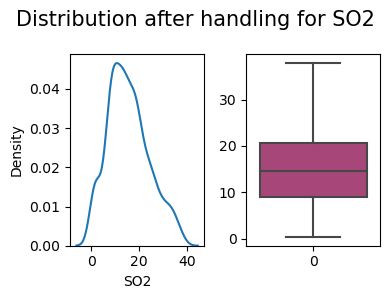

0      58.680428
1      35.592802
2      12.810000
3      12.520000
4      12.670000
         ...    
849    34.387500
850    37.296000
851    26.680500
852    22.512000
853    29.494500
Name: O3, Length: 854, dtype: float64


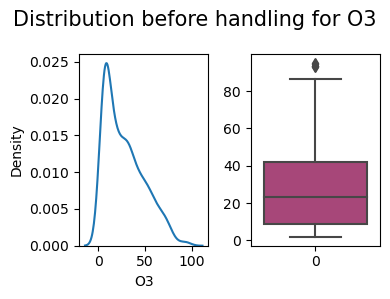

(854, 16)
854
854
(854, 16)
0      58.680428
1      35.592802
2      12.810000
3      12.520000
4      12.670000
         ...    
849    34.387500
850    37.296000
851    26.680500
852    22.512000
853    29.494500
Name: O3, Length: 854, dtype: float64


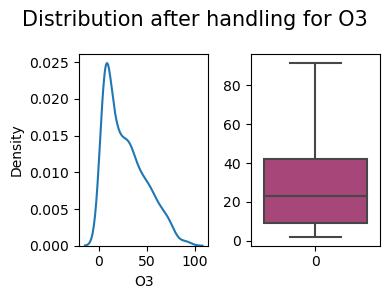

0      427.0
1      345.0
2      378.0
3      407.0
4      451.0
       ...  
849    107.0
850     70.5
851     66.0
852    125.0
853    102.0
Name: AQI, Length: 854, dtype: float64


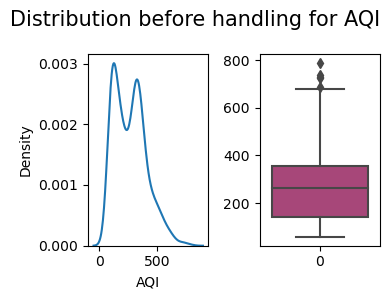

(854, 16)
854
854
(854, 16)
0      427.0
1      345.0
2      378.0
3      407.0
4      451.0
       ...  
849    107.0
850     70.5
851     66.0
852    125.0
853    102.0
Name: AQI, Length: 854, dtype: float64


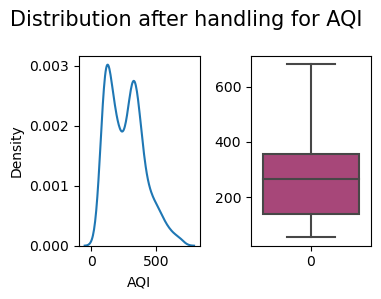

NEW LOCATION - 7
0      185.79000
1      130.14000
2      153.47000
3      189.63000
4      173.70000
         ...    
849     18.27000
850     17.29875
851     38.49300
852     39.27000
853     45.05550
Name: PM2.5, Length: 854, dtype: float64


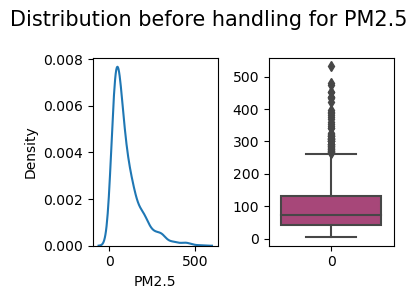

(854, 16)
854
854
(854, 16)
0      185.79000
1      130.14000
2      153.47000
3      189.63000
4      173.70000
         ...    
849     18.27000
850     17.29875
851     38.49300
852     39.27000
853     45.05550
Name: PM2.5, Length: 854, dtype: float64


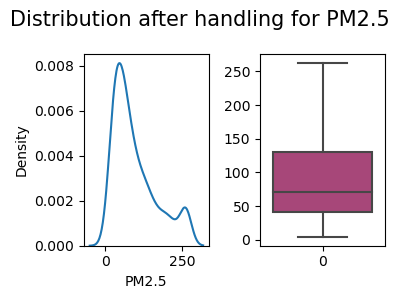

0      337.0600
1      260.1800
2      265.1100
3      329.3200
4      303.4500
         ...   
849     66.2445
850     44.7930
851     77.4270
852     97.8495
853    116.2035
Name: PM10, Length: 854, dtype: float64


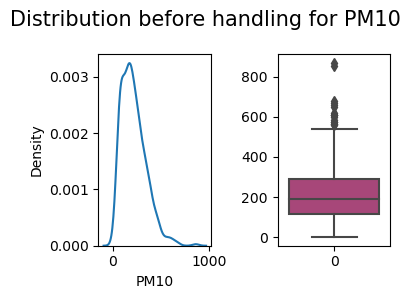

(854, 16)
854
854
(854, 16)
0      337.0600
1      260.1800
2      265.1100
3      329.3200
4      303.4500
         ...   
849     66.2445
850     44.7930
851     77.4270
852     97.8495
853    116.2035
Name: PM10, Length: 854, dtype: float64


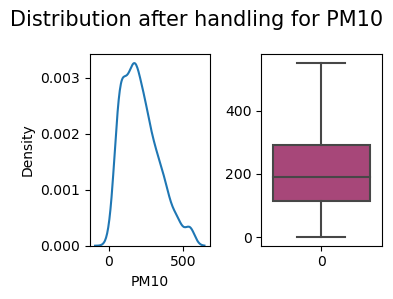

0      1.91000
1      1.43000
2      1.30000
3      1.68000
4      1.48000
        ...   
849    0.67200
850    0.64575
851    0.84000
852    0.79800
853    0.96600
Name: CO, Length: 854, dtype: float64


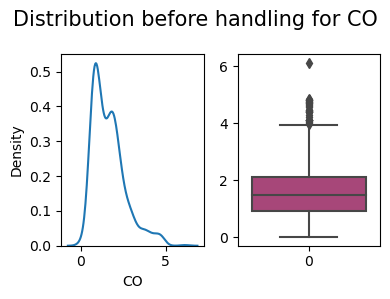

(854, 16)
854
854
(854, 16)
0      1.91000
1      1.43000
2      1.30000
3      1.68000
4      1.48000
        ...   
849    0.67200
850    0.64575
851    0.84000
852    0.79800
853    0.96600
Name: CO, Length: 854, dtype: float64


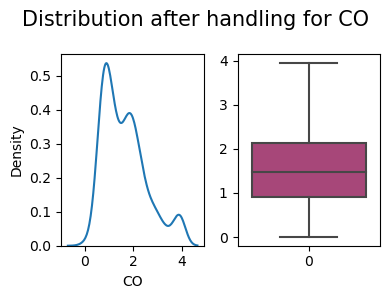

0      12.98000
1      25.56000
2      22.50000
3      20.99000
4      28.67000
         ...   
849    19.18350
850    19.46175
851    23.12100
852    20.49600
853    28.06650
Name: SO2, Length: 854, dtype: float64


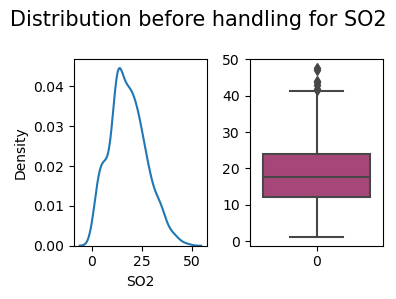

(854, 16)
854
854
(854, 16)
0      12.98000
1      25.56000
2      22.50000
3      20.99000
4      28.67000
         ...   
849    19.18350
850    19.46175
851    23.12100
852    20.49600
853    28.06650
Name: SO2, Length: 854, dtype: float64


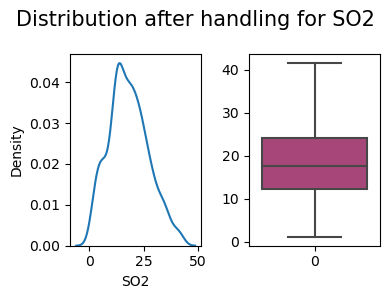

0      20.882853
1      12.476246
2       3.730000
3      30.110000
4      26.560000
         ...    
849    57.487500
850    56.595000
851    87.013500
852    73.384500
853    64.333500
Name: O3, Length: 854, dtype: float64


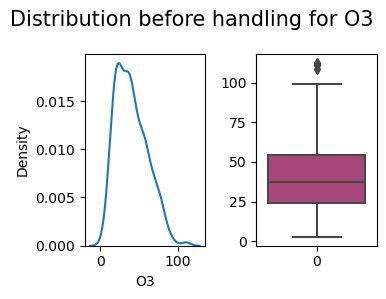

(854, 16)
854
854
(854, 16)
0      20.882853
1      12.476246
2       3.730000
3      30.110000
4      26.560000
         ...    
849    57.487500
850    56.595000
851    87.013500
852    73.384500
853    64.333500
Name: O3, Length: 854, dtype: float64


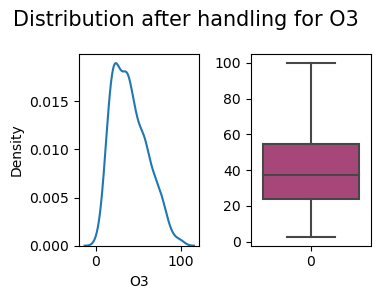

0      346.0
1      322.0
2      320.0
3      345.0
4      353.0
       ...  
849    148.0
850     83.5
851    164.0
852    151.0
853    189.0
Name: AQI, Length: 854, dtype: float64


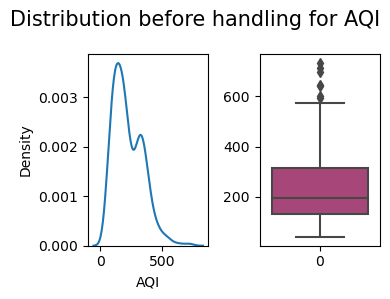

(854, 16)
854
854
(854, 16)
0      346.0
1      322.0
2      320.0
3      345.0
4      353.0
       ...  
849    148.0
850     83.5
851    164.0
852    151.0
853    189.0
Name: AQI, Length: 854, dtype: float64


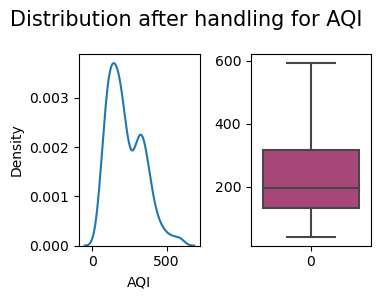

NEW LOCATION - 8
0      162.1700
1      112.0800
2      144.3200
3      183.9200
4      150.2800
         ...   
849     23.4360
850     22.0605
851     42.4830
852     43.7010
853     49.8855
Name: PM2.5, Length: 854, dtype: float64


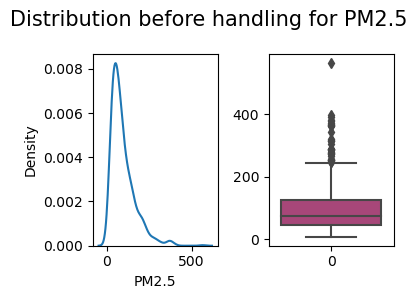

(854, 16)
854
854
(854, 16)
0      162.1700
1      112.0800
2      144.3200
3      183.9200
4      150.2800
         ...   
849     23.4360
850     22.0605
851     42.4830
852     43.7010
853     49.8855
Name: PM2.5, Length: 854, dtype: float64


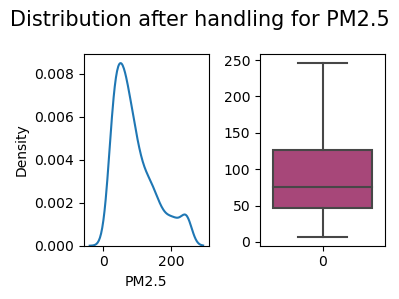

0      316.3000
1      247.4400
2      289.3200
3      352.4400
4      295.4500
         ...   
849     59.4090
850     43.2705
851     78.9915
852     92.5680
853    110.1345
Name: PM10, Length: 854, dtype: float64


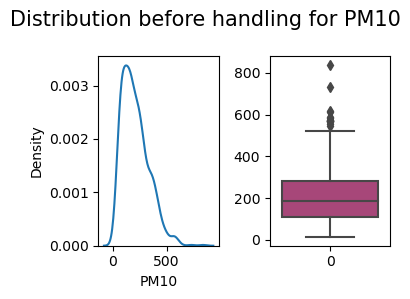

(854, 16)
854
854
(854, 16)
0      316.3000
1      247.4400
2      289.3200
3      352.4400
4      295.4500
         ...   
849     59.4090
850     43.2705
851     78.9915
852     92.5680
853    110.1345
Name: PM10, Length: 854, dtype: float64


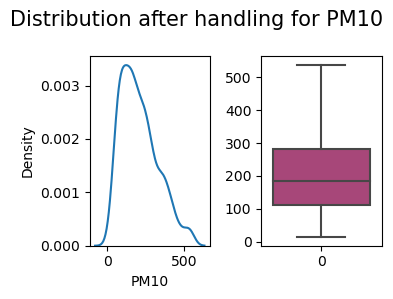

0      1.8600
1      1.2300
2      1.4000
3      2.1300
4      1.7700
        ...  
849    0.3885
850    0.3570
851    0.5565
852    0.5250
853    0.6090
Name: CO, Length: 854, dtype: float64


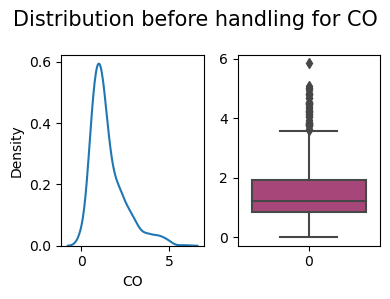

(854, 16)
854
854
(854, 16)
0      1.8600
1      1.2300
2      1.4000
3      2.1300
4      1.7700
        ...  
849    0.3885
850    0.3570
851    0.5565
852    0.5250
853    0.6090
Name: CO, Length: 854, dtype: float64


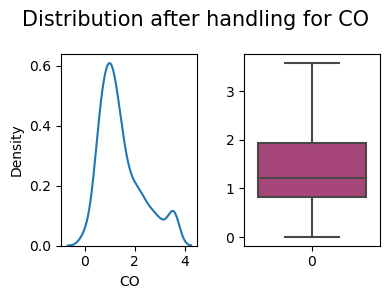

0      16.75000
1      20.42000
2      17.82000
3      20.57000
4      20.59000
         ...   
849    17.52450
850    16.20675
851    21.84000
852    18.78450
853    22.77450
Name: SO2, Length: 854, dtype: float64


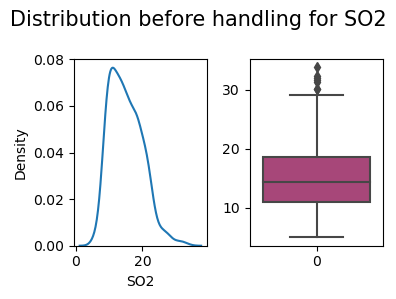

(854, 16)
854
854
(854, 16)
0      16.75000
1      20.42000
2      17.82000
3      20.57000
4      20.59000
         ...   
849    17.52450
850    16.20675
851    21.84000
852    18.78450
853    22.77450
Name: SO2, Length: 854, dtype: float64


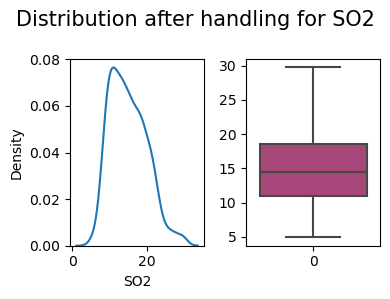

0        8.4000
1        8.4000
2        1.8400
3       27.3300
4       27.4400
         ...   
849    133.9065
850    128.6670
851     94.7520
852     88.5255
853     80.2620
Name: O3, Length: 854, dtype: float64


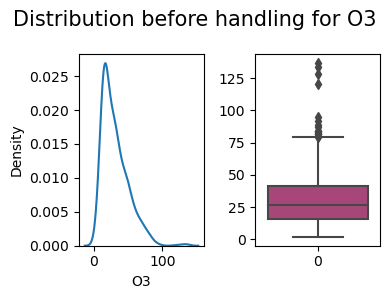

(854, 16)
854
854
(854, 16)
0       8.40000
1       8.40000
2       1.84000
3      27.33000
4      27.44000
         ...   
849    79.41875
850    79.41875
851    79.41875
852    79.41875
853    79.41875
Name: O3, Length: 854, dtype: float64


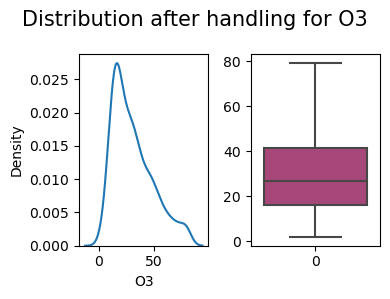

0      334.0
1      297.0
2      312.0
3      338.0
4      339.0
       ...  
849    226.0
850    225.5
851    210.0
852    220.0
853    204.0
Name: AQI, Length: 854, dtype: float64


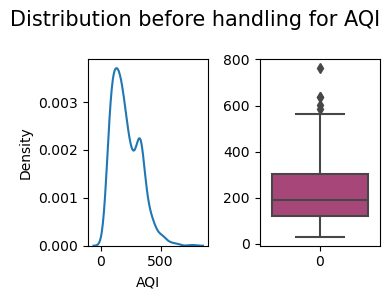

(854, 16)
854
854
(854, 16)
0      334.0
1      297.0
2      312.0
3      338.0
4      339.0
       ...  
849    226.0
850    225.5
851    210.0
852    220.0
853    204.0
Name: AQI, Length: 854, dtype: float64


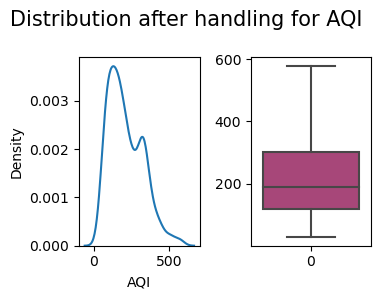

NEW LOCATION - 9
0      38.88000
1      37.65000
2      63.48000
3      73.98000
4      79.35000
         ...   
694    20.84250
695    20.84775
696    40.09950
697    43.51200
698    58.40100
Name: PM2.5, Length: 699, dtype: float64


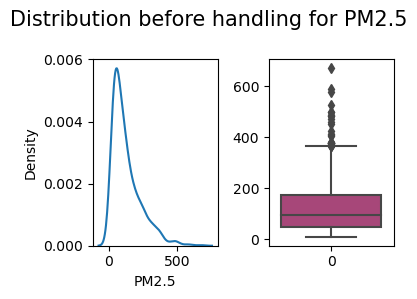

(699, 16)
699
699
(699, 16)
0      38.88000
1      37.65000
2      63.48000
3      73.98000
4      79.35000
         ...   
694    20.84250
695    20.84775
696    40.09950
697    43.51200
698    58.40100
Name: PM2.5, Length: 699, dtype: float64


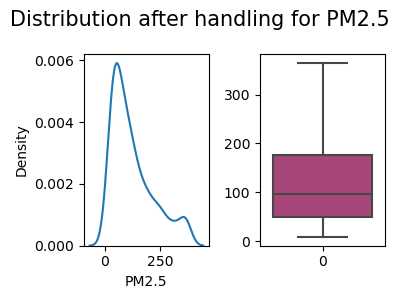

0      145.4200
1      173.9800
2      214.2300
3      298.2900
4      322.5600
         ...   
694     74.8755
695     53.2140
696     88.9875
697    116.1090
698    147.1260
Name: PM10, Length: 699, dtype: float64


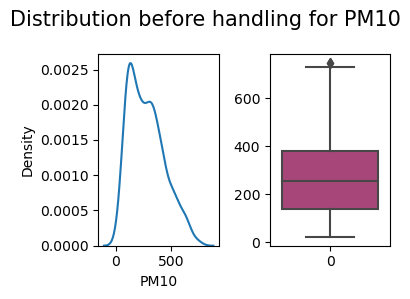

(699, 16)
699
699
(699, 16)
0      145.4200
1      173.9800
2      214.2300
3      298.2900
4      322.5600
         ...   
694     74.8755
695     53.2140
696     88.9875
697    116.1090
698    147.1260
Name: PM10, Length: 699, dtype: float64


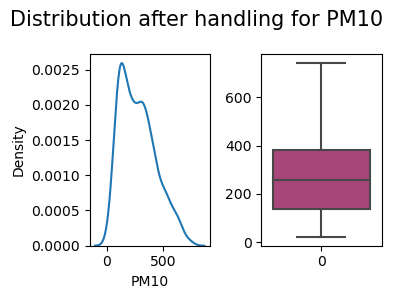

0      0.8700
1      0.8400
2      0.8400
3      0.9500
4      1.1500
        ...  
694    0.5880
695    0.5355
696    0.6720
697    0.6825
698    0.6720
Name: CO, Length: 699, dtype: float64


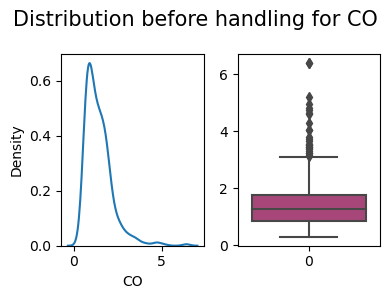

(699, 16)
699
699
(699, 16)
0      0.8700
1      0.8400
2      0.8400
3      0.9500
4      1.1500
        ...  
694    0.5880
695    0.5355
696    0.6720
697    0.6825
698    0.6720
Name: CO, Length: 699, dtype: float64


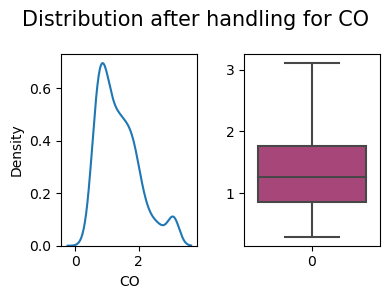

0      18.70000
1      20.47000
2      17.93000
3      13.00000
4      17.52000
         ...   
694     4.04250
695     8.52075
696     6.03750
697     6.09000
698    16.67400
Name: SO2, Length: 699, dtype: float64


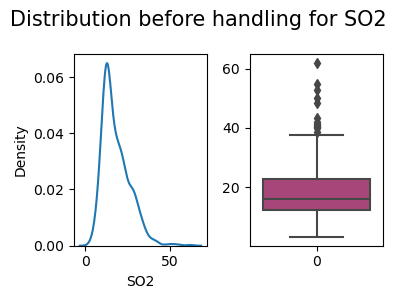

(699, 16)
699
699
(699, 16)
0      18.70000
1      20.47000
2      17.93000
3      13.00000
4      17.52000
         ...   
694     4.04250
695     8.52075
696     6.03750
697     6.09000
698    16.67400
Name: SO2, Length: 699, dtype: float64


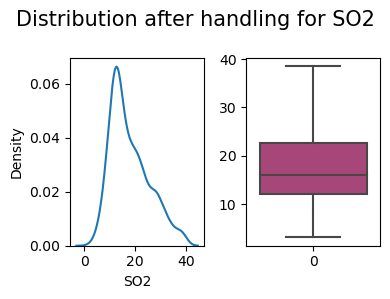

0      25.89000
1      16.81000
2      32.42000
3      36.57000
4      38.85000
         ...   
694    64.41750
695    65.92425
696    71.54700
697    63.28350
698    75.42150
Name: O3, Length: 699, dtype: float64


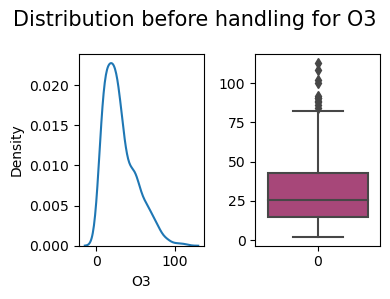

(699, 16)
699
699
(699, 16)
0      25.89000
1      16.81000
2      32.42000
3      36.57000
4      38.85000
         ...   
694    64.41750
695    65.92425
696    71.54700
697    63.28350
698    75.42150
Name: O3, Length: 699, dtype: float64


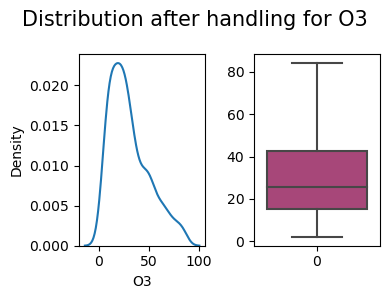

0      132.0
1      131.0
2      173.0
3      198.0
4      312.0
       ...  
694    147.0
695     89.0
696    121.0
697    126.0
698    144.0
Name: AQI, Length: 699, dtype: float64


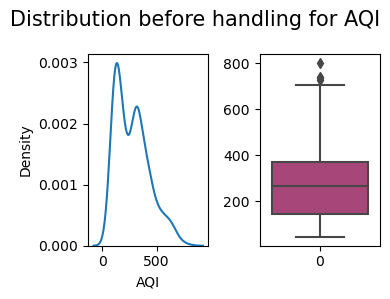

(699, 16)
699
699
(699, 16)
0      132.0
1      131.0
2      173.0
3      198.0
4      312.0
       ...  
694    147.0
695     89.0
696    121.0
697    126.0
698    144.0
Name: AQI, Length: 699, dtype: float64


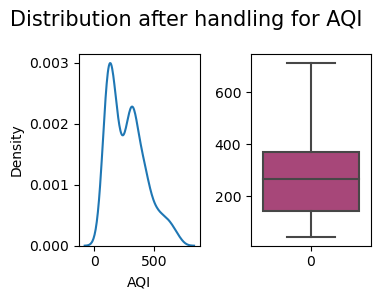

NEW LOCATION - 10
0      126.30000
1      131.71000
2      169.25000
3      138.12000
4      147.92000
         ...    
849     20.92650
850     17.50875
851     36.52950
852     38.69250
853     27.70950
Name: PM2.5, Length: 854, dtype: float64


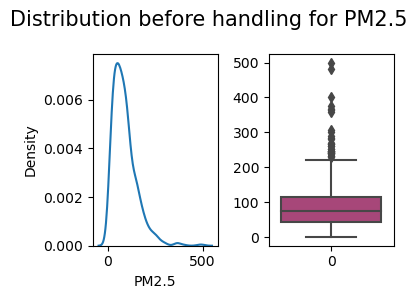

(854, 16)
854
854
(854, 16)
0      126.30000
1      131.71000
2      169.25000
3      138.12000
4      147.92000
         ...    
849     20.92650
850     17.50875
851     36.52950
852     38.69250
853     27.70950
Name: PM2.5, Length: 854, dtype: float64


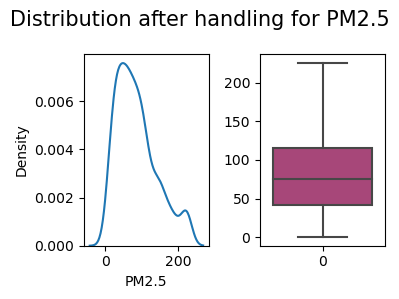

0      209.5100
1      212.5000
2      257.3300
3      215.5800
4      233.0000
         ...   
849     60.0180
850     39.3750
851     71.6520
852     87.7905
853     89.7435
Name: PM10, Length: 854, dtype: float64


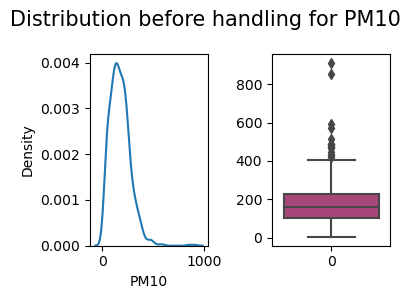

(854, 16)
854
854
(854, 16)
0      209.5100
1      212.5000
2      257.3300
3      215.5800
4      233.0000
         ...   
849     60.0180
850     39.3750
851     71.6520
852     87.7905
853     89.7435
Name: PM10, Length: 854, dtype: float64


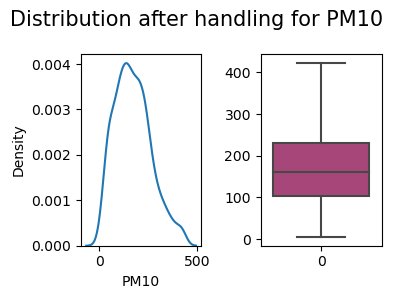

0      0.59000
1      0.47000
2      0.55000
3      0.57000
4      0.76000
        ...   
849    0.48300
850    0.82425
851    1.81650
852    0.63000
853    1.11300
Name: CO, Length: 854, dtype: float64


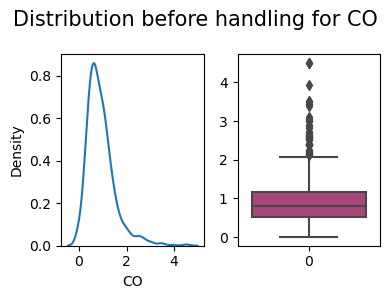

(854, 16)
854
854
(854, 16)
0      0.59000
1      0.47000
2      0.55000
3      0.57000
4      0.76000
        ...   
849    0.48300
850    0.82425
851    1.81650
852    0.63000
853    1.11300
Name: CO, Length: 854, dtype: float64


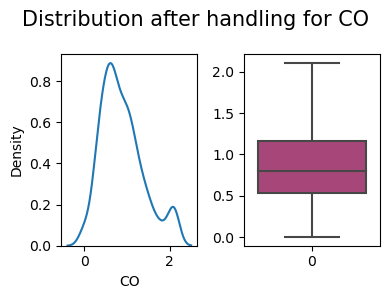

0       4.2400
1       5.8400
2       7.8600
3       5.5900
4       5.1200
        ...   
849     8.1060
850     8.9250
851    13.0935
852     4.3470
853     9.3555
Name: SO2, Length: 854, dtype: float64


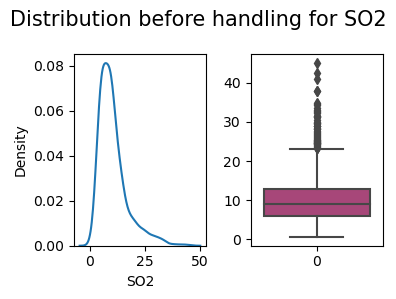

(854, 16)
854
854
(854, 16)
0       4.2400
1       5.8400
2       7.8600
3       5.5900
4       5.1200
        ...   
849     8.1060
850     8.9250
851    13.0935
852     4.3470
853     9.3555
Name: SO2, Length: 854, dtype: float64


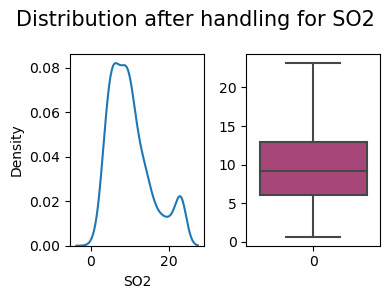

0      55.64299
1      36.18245
2      16.37000
3      41.24000
4      44.51000
         ...   
849     7.91700
850     6.97200
851     7.21350
852     8.52600
853     6.97200
Name: O3, Length: 854, dtype: float64


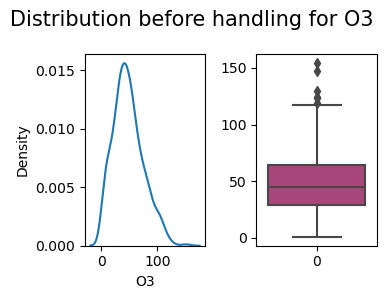

(854, 16)
854
854
(854, 16)
0      55.64299
1      36.18245
2      16.37000
3      41.24000
4      44.51000
         ...   
849     7.91700
850     6.97200
851     7.21350
852     8.52600
853     6.97200
Name: O3, Length: 854, dtype: float64


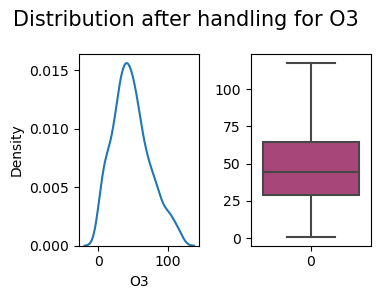

0      312.0
1      311.0
2      327.0
3      324.0
4      318.0
       ...  
849    135.0
850     58.0
851    110.0
852     89.0
853     78.0
Name: AQI, Length: 854, dtype: float64


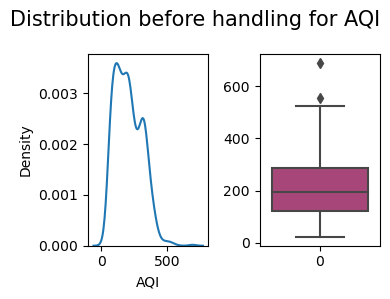

(854, 16)
854
854
(854, 16)
0      312.0
1      311.0
2      327.0
3      324.0
4      318.0
       ...  
849    135.0
850     58.0
851    110.0
852     89.0
853     78.0
Name: AQI, Length: 854, dtype: float64


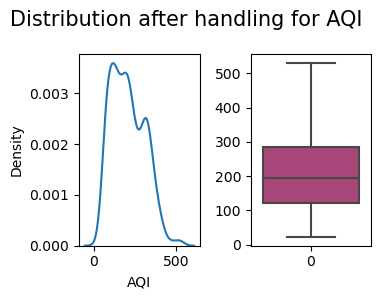

NEW LOCATION - 11
0      149.7100
1      134.7800
2      169.0200
3      200.7900
4      189.9300
         ...   
849     32.1825
850     27.4470
851     46.6935
852     55.6605
853     59.5245
Name: PM2.5, Length: 854, dtype: float64


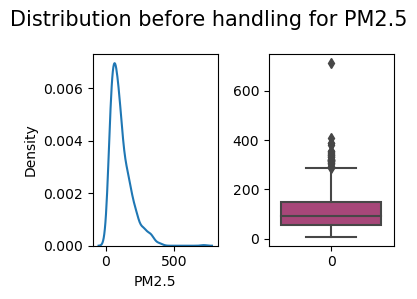

(854, 16)
854
854
(854, 16)
0      149.7100
1      134.7800
2      169.0200
3      200.7900
4      189.9300
         ...   
849     32.1825
850     27.4470
851     46.6935
852     55.6605
853     59.5245
Name: PM2.5, Length: 854, dtype: float64


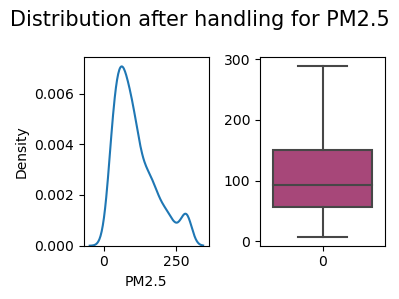

0      239.9200
1      230.9200
2      219.0200
3      309.1100
4      269.5400
         ...   
849     98.3430
850     59.7975
851    115.1850
852    135.2610
853    153.3840
Name: PM10, Length: 854, dtype: float64


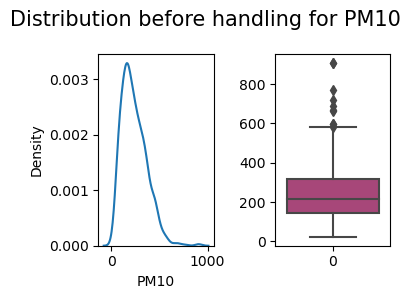

(854, 16)
854
854
(854, 16)
0      239.9200
1      230.9200
2      219.0200
3      309.1100
4      269.5400
         ...   
849     98.3430
850     59.7975
851    115.1850
852    135.2610
853    153.3840
Name: PM10, Length: 854, dtype: float64


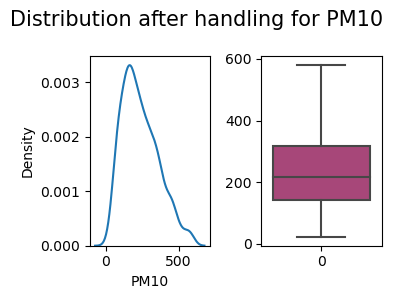

0      0.78000
1      0.71000
2      0.64000
3      0.88000
4      0.82000
        ...   
849    1.36500
850    1.64325
851    1.50150
852    1.48050
853    1.36500
Name: CO, Length: 854, dtype: float64


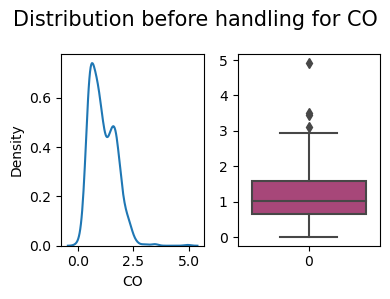

(854, 16)
854
854
(854, 16)
0      0.78000
1      0.71000
2      0.64000
3      0.88000
4      0.82000
        ...   
849    1.36500
850    1.64325
851    1.50150
852    1.48050
853    1.36500
Name: CO, Length: 854, dtype: float64


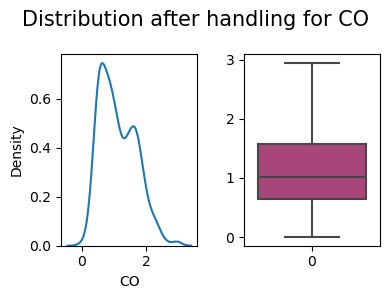

0       9.67000
1      11.66000
2      11.36000
3      14.95000
4      15.21000
         ...   
849    10.51050
850     6.96675
851    16.08600
852     7.62300
853    12.21150
Name: SO2, Length: 854, dtype: float64


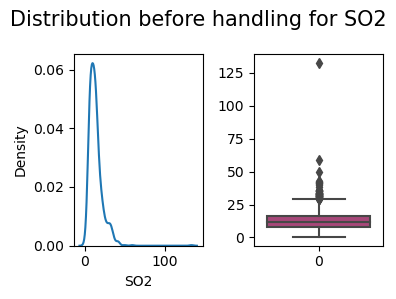

(854, 16)
854
854
(854, 16)
0       9.67000
1      11.66000
2      11.36000
3      14.95000
4      15.21000
         ...   
849    10.51050
850     6.96675
851    16.08600
852     7.62300
853    12.21150
Name: SO2, Length: 854, dtype: float64


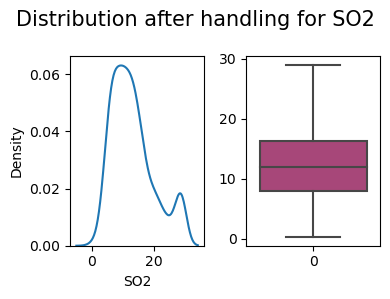

0      13.319188
1      16.766917
2      20.820000
3      37.170000
4      36.400000
         ...    
849    49.003500
850    48.242250
851    53.938500
852    50.589000
853    58.800000
Name: O3, Length: 854, dtype: float64


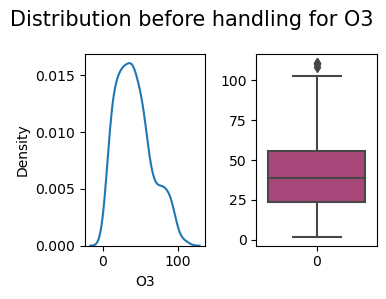

(854, 16)
854
854
(854, 16)
0      13.319188
1      16.766917
2      20.820000
3      37.170000
4      36.400000
         ...    
849    49.003500
850    48.242250
851    53.938500
852    50.589000
853    58.800000
Name: O3, Length: 854, dtype: float64


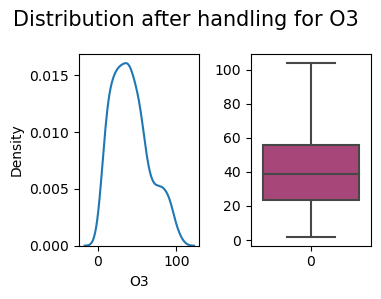

0      333.0
1      314.0
2      335.0
3      349.0
4      359.0
       ...  
849    161.0
850     98.5
851     93.0
852    128.0
853    131.0
Name: AQI, Length: 854, dtype: float64


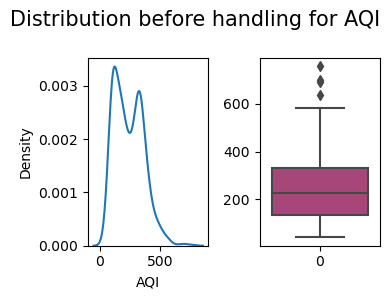

(854, 16)
854
854
(854, 16)
0      333.0
1      314.0
2      335.0
3      349.0
4      359.0
       ...  
849    161.0
850     98.5
851     93.0
852    128.0
853    131.0
Name: AQI, Length: 854, dtype: float64


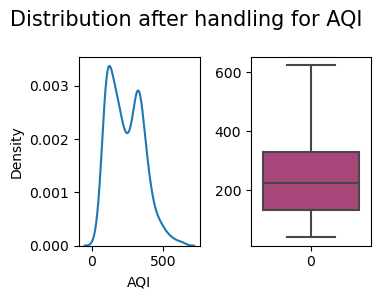

NEW LOCATION - 12
0      160.07000
1      118.73000
2      144.50000
3      187.33000
4      149.58000
         ...    
849     23.34150
850     20.75325
851     54.28500
852     48.20550
853     54.81000
Name: PM2.5, Length: 854, dtype: float64


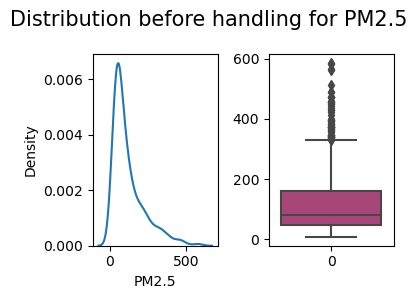

(854, 16)
854
854
(854, 16)
0      160.07000
1      118.73000
2      144.50000
3      187.33000
4      149.58000
         ...    
849     23.34150
850     20.75325
851     54.28500
852     48.20550
853     54.81000
Name: PM2.5, Length: 854, dtype: float64


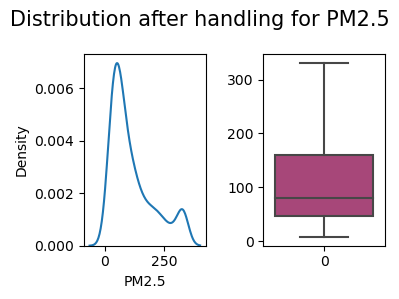

0      273.2900
1      219.9300
2      230.1200
3      267.4600
4      266.1200
         ...   
849     64.3755
850     43.6065
851     90.9825
852    100.5585
853    116.7285
Name: PM10, Length: 854, dtype: float64


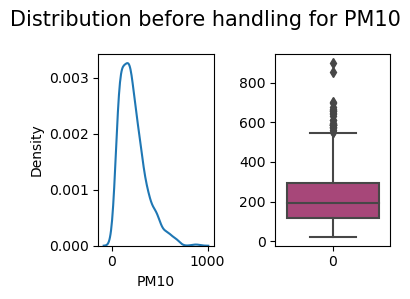

(854, 16)
854
854
(854, 16)
0      273.2900
1      219.9300
2      230.1200
3      267.4600
4      266.1200
         ...   
849     64.3755
850     43.6065
851     90.9825
852    100.5585
853    116.7285
Name: PM10, Length: 854, dtype: float64


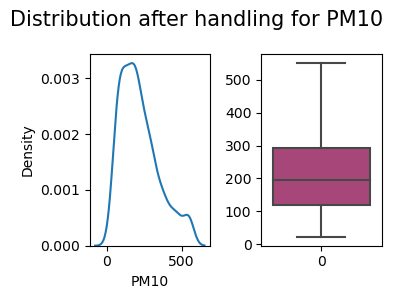

0      0.8700
1      0.5600
2      0.6600
3      0.9800
4      0.7900
        ...  
849    0.5985
850    0.5775
851    0.9345
852    0.7350
853    0.9135
Name: CO, Length: 854, dtype: float64


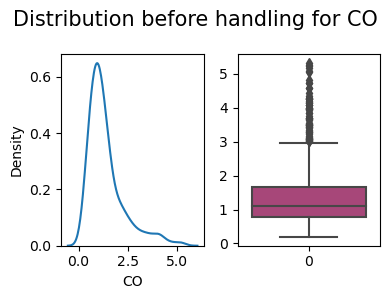

(854, 16)
854
854
(854, 16)
0      0.8700
1      0.5600
2      0.6600
3      0.9800
4      0.7900
        ...  
849    0.5985
850    0.5775
851    0.9345
852    0.7350
853    0.9135
Name: CO, Length: 854, dtype: float64


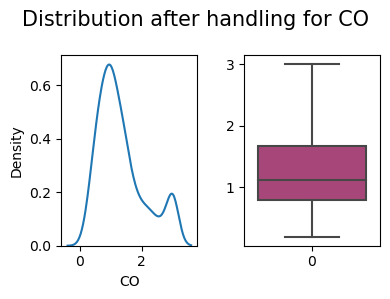

0       3.40000
1       5.80000
2       3.90000
3       4.83000
4       5.01000
         ...   
849    11.27700
850    10.07475
851    18.76350
852    13.42950
853    19.23600
Name: SO2, Length: 854, dtype: float64


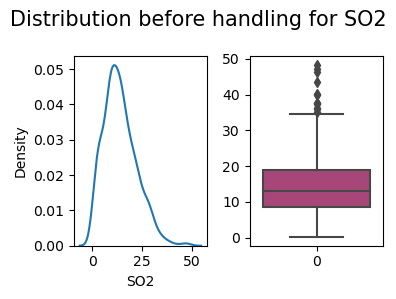

(854, 16)
854
854
(854, 16)
0       3.40000
1       5.80000
2       3.90000
3       4.83000
4       5.01000
         ...   
849    11.27700
850    10.07475
851    18.76350
852    13.42950
853    19.23600
Name: SO2, Length: 854, dtype: float64


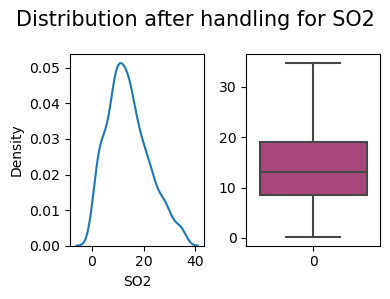

0      39.452741
1      20.368090
2       0.850000
3      29.580000
4      27.240000
         ...    
849    80.167500
850    79.700250
851    71.809500
852    96.684000
853    70.203000
Name: O3, Length: 854, dtype: float64


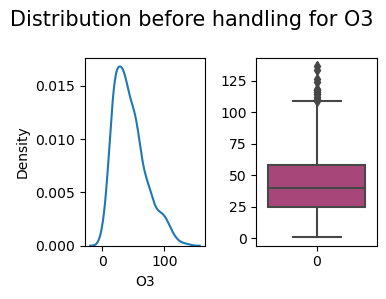

(854, 16)
854
854
(854, 16)
0      39.452741
1      20.368090
2       0.850000
3      29.580000
4      27.240000
         ...    
849    80.167500
850    79.700250
851    71.809500
852    96.684000
853    70.203000
Name: O3, Length: 854, dtype: float64


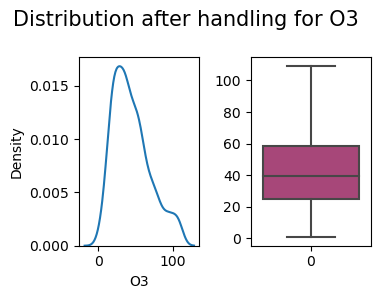

0      338.0
1      308.0
2      315.0
3      337.0
4      340.0
       ...  
849    160.0
850    115.0
851    172.0
852    209.0
853    211.0
Name: AQI, Length: 854, dtype: float64


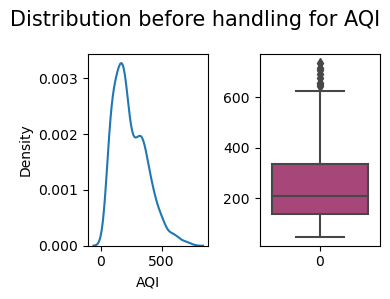

(854, 16)
854
854
(854, 16)
0      338.0
1      308.0
2      315.0
3      337.0
4      340.0
       ...  
849    160.0
850    115.0
851    172.0
852    209.0
853    211.0
Name: AQI, Length: 854, dtype: float64


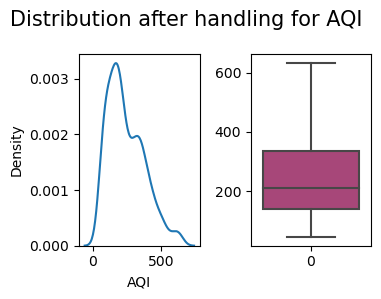

NEW LOCATION - 13
0      162.17000
1      112.08000
2      144.32000
3      183.92000
4      150.28000
         ...    
849     22.97400
850     21.90825
851     46.90350
852     50.52600
853     48.56250
Name: PM2.5, Length: 854, dtype: float64


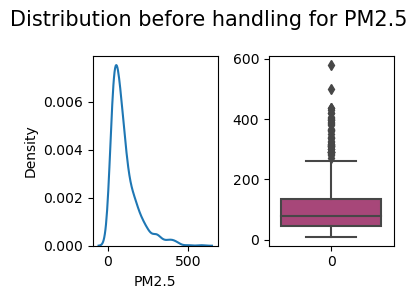

(854, 16)
854
854
(854, 16)
0      162.17000
1      112.08000
2      144.32000
3      183.92000
4      150.28000
         ...    
849     22.97400
850     21.90825
851     46.90350
852     50.52600
853     48.56250
Name: PM2.5, Length: 854, dtype: float64


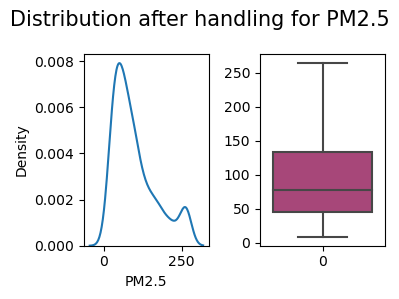

0      316.3000
1      247.4400
2      289.3200
3      352.4400
4      295.4500
         ...   
849     70.3290
850     50.0325
851     91.5285
852    120.2460
853    123.2910
Name: PM10, Length: 854, dtype: float64


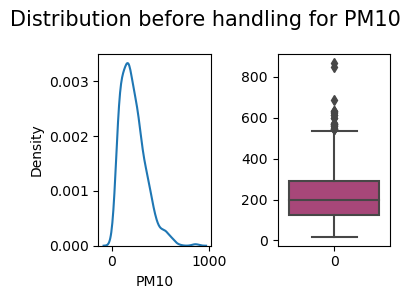

(854, 16)
854
854
(854, 16)
0      316.3000
1      247.4400
2      289.3200
3      352.4400
4      295.4500
         ...   
849     70.3290
850     50.0325
851     91.5285
852    120.2460
853    123.2910
Name: PM10, Length: 854, dtype: float64


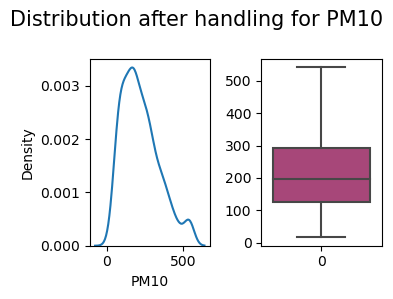

0      1.8600
1      1.2300
2      1.4000
3      2.1300
4      1.7700
        ...  
849    0.6405
850    0.7350
851    0.7980
852    0.8715
853    0.7875
Name: CO, Length: 854, dtype: float64


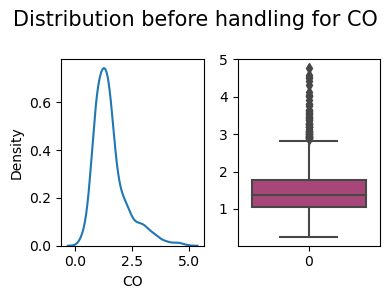

(854, 16)
854
854
(854, 16)
0      1.8600
1      1.2300
2      1.4000
3      2.1300
4      1.7700
        ...  
849    0.6405
850    0.7350
851    0.7980
852    0.8715
853    0.7875
Name: CO, Length: 854, dtype: float64


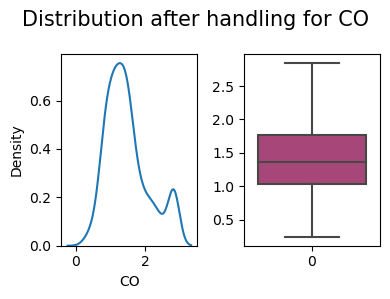

0      16.7500
1      20.4200
2      17.8200
3      20.5700
4      20.5900
        ...   
849    12.7995
850    11.6970
851    18.7215
852    15.4560
853    19.4880
Name: SO2, Length: 854, dtype: float64


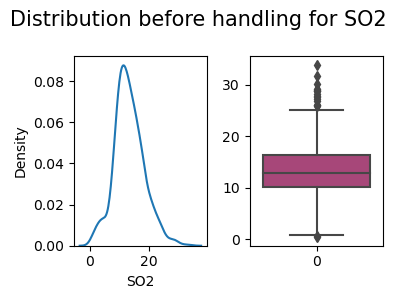

(854, 16)
854
854
(854, 16)
0      16.7500
1      20.4200
2      17.8200
3      20.5700
4      20.5900
        ...   
849    12.7995
850    11.6970
851    18.7215
852    15.4560
853    19.4880
Name: SO2, Length: 854, dtype: float64


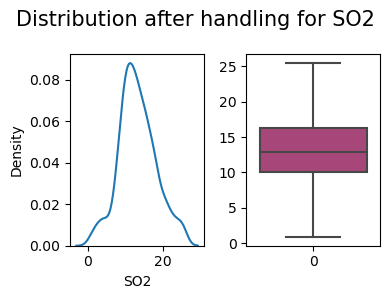

0       8.4000
1       8.4000
2       1.8400
3      27.3300
4      27.4400
        ...   
849     2.0790
850    30.2085
851    32.9805
852    33.8100
853    33.9990
Name: O3, Length: 854, dtype: float64


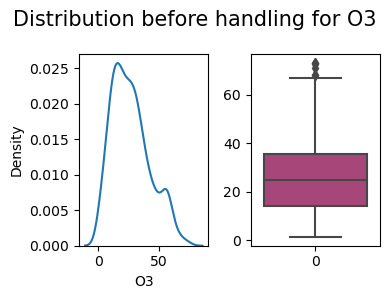

(854, 16)
854
854
(854, 16)
0       8.4000
1       8.4000
2       1.8400
3      27.3300
4      27.4400
        ...   
849     2.0790
850    30.2085
851    32.9805
852    33.8100
853    33.9990
Name: O3, Length: 854, dtype: float64


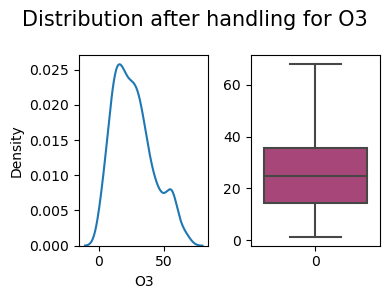

0      334.0
1      297.0
2      312.0
3      338.0
4      339.0
       ...  
849    143.0
850     61.0
851     60.0
852    118.0
853    109.0
Name: AQI, Length: 854, dtype: float64


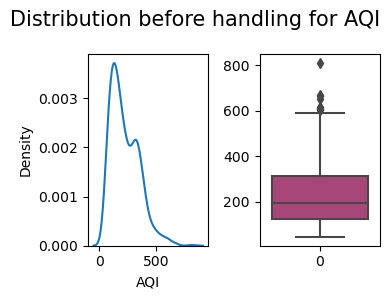

(854, 16)
854
854
(854, 16)
0      334.0
1      297.0
2      312.0
3      338.0
4      339.0
       ...  
849    143.0
850     61.0
851     60.0
852    118.0
853    109.0
Name: AQI, Length: 854, dtype: float64


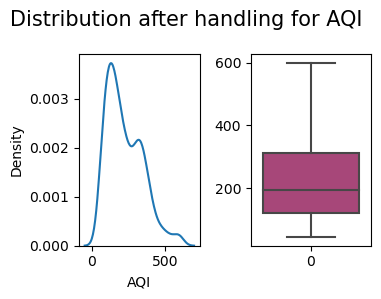

NEW LOCATION - 14
0      144.0500
1      155.5900
2      122.0000
3      145.4600
4      174.2800
         ...   
849     20.8320
850     19.0785
851     42.4935
852     42.6405
853     51.1455
Name: PM2.5, Length: 854, dtype: float64


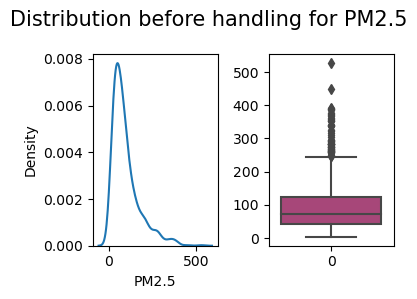

(854, 16)
854
854
(854, 16)
0      144.0500
1      155.5900
2      122.0000
3      145.4600
4      174.2800
         ...   
849     20.8320
850     19.0785
851     42.4935
852     42.6405
853     51.1455
Name: PM2.5, Length: 854, dtype: float64


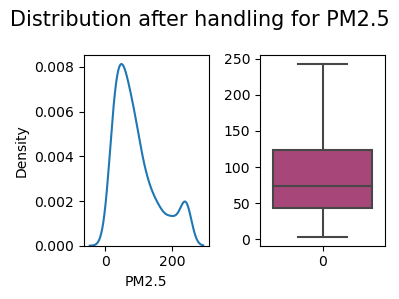

0      355.2100
1      278.8900
2      267.5400
3      304.2900
4      259.3900
         ...   
849     64.8480
850     37.1805
851     65.1525
852     77.1855
853     94.0065
Name: PM10, Length: 854, dtype: float64


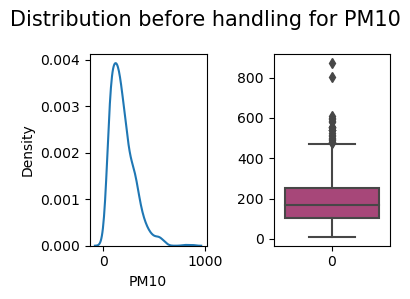

(854, 16)
854
854
(854, 16)
0      355.2100
1      278.8900
2      267.5400
3      304.2900
4      259.3900
         ...   
849     64.8480
850     37.1805
851     65.1525
852     77.1855
853     94.0065
Name: PM10, Length: 854, dtype: float64


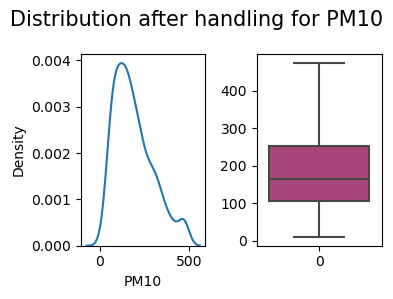

0      1.5000
1      1.2400
2      1.1500
3      1.5000
4      1.2300
        ...  
849    0.3570
850    0.3465
851    0.4935
852    0.4725
853    0.4830
Name: CO, Length: 854, dtype: float64


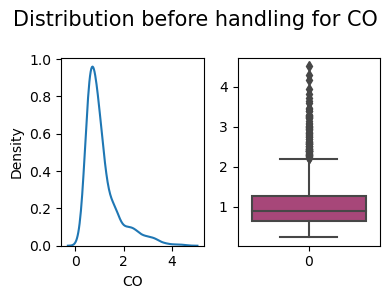

(854, 16)
854
854
(854, 16)
0      1.5000
1      1.2400
2      1.1500
3      1.5000
4      1.2300
        ...  
849    0.3570
850    0.3465
851    0.4935
852    0.4725
853    0.4830
Name: CO, Length: 854, dtype: float64


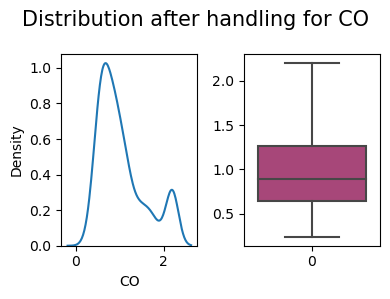

0      6.7200
1      6.4100
2      7.3300
3      8.9000
4      8.0000
        ...  
849    6.6255
850    4.3365
851    7.7070
852    4.9875
853    6.9615
Name: SO2, Length: 854, dtype: float64


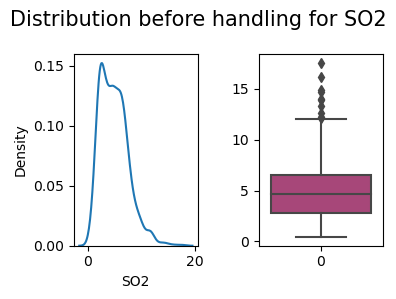

(854, 16)
854
854
(854, 16)
0      6.7200
1      6.4100
2      7.3300
3      8.9000
4      8.0000
        ...  
849    6.6255
850    4.3365
851    7.7070
852    4.9875
853    6.9615
Name: SO2, Length: 854, dtype: float64


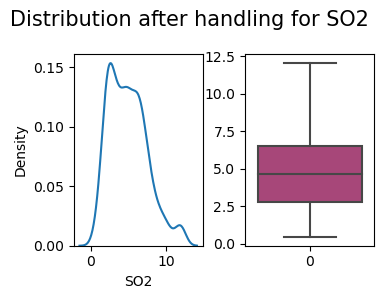

0      26.250209
1      17.905406
2       9.090000
3      50.420000
4      47.870000
         ...    
849    35.332500
850    30.156000
851    27.069000
852    25.200000
853    31.195500
Name: O3, Length: 854, dtype: float64


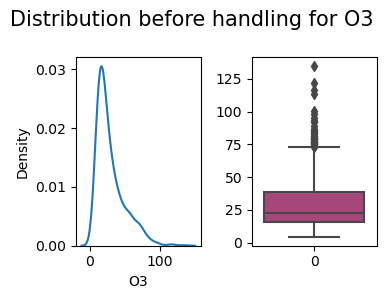

(854, 16)
854
854
(854, 16)
0      26.250209
1      17.905406
2       9.090000
3      50.420000
4      47.870000
         ...    
849    35.332500
850    30.156000
851    27.069000
852    25.200000
853    31.195500
Name: O3, Length: 854, dtype: float64


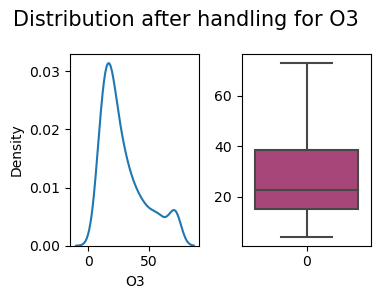

0      360.0
1      324.0
2      310.0
3      312.0
4      341.0
       ...  
849    126.0
850     51.5
851     48.0
852     82.0
853     82.0
Name: AQI, Length: 854, dtype: float64


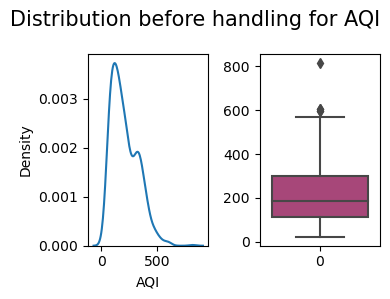

(854, 16)
854
854
(854, 16)
0      360.0
1      324.0
2      310.0
3      312.0
4      341.0
       ...  
849    126.0
850     51.5
851     48.0
852     82.0
853     82.0
Name: AQI, Length: 854, dtype: float64


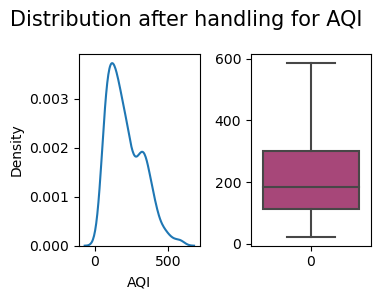

NEW LOCATION - 15
0      34.2000
1      42.0500
2      52.2900
3      54.1500
4      53.8800
        ...   
694    19.3515
695    17.6925
696    30.3870
697    36.3510
698    43.5645
Name: PM2.5, Length: 699, dtype: float64


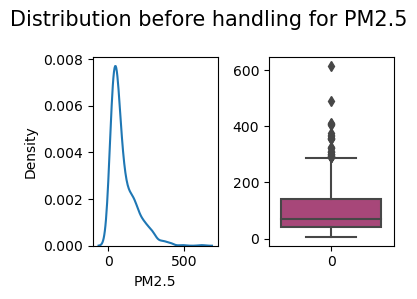

(699, 16)
699
699
(699, 16)
0      34.2000
1      42.0500
2      52.2900
3      54.1500
4      53.8800
        ...   
694    19.3515
695    17.6925
696    30.3870
697    36.3510
698    43.5645
Name: PM2.5, Length: 699, dtype: float64


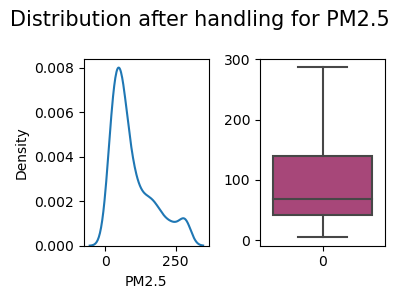

0      108.1700
1      142.8300
2      199.8500
3      159.3300
4      151.3100
         ...   
694     49.4760
695     38.0730
696     62.6325
697     82.4040
698     99.9705
Name: PM10, Length: 699, dtype: float64


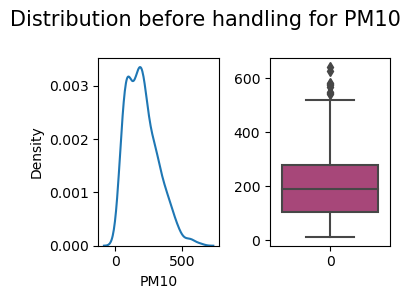

(699, 16)
699
699
(699, 16)
0      108.1700
1      142.8300
2      199.8500
3      159.3300
4      151.3100
         ...   
694     49.4760
695     38.0730
696     62.6325
697     82.4040
698     99.9705
Name: PM10, Length: 699, dtype: float64


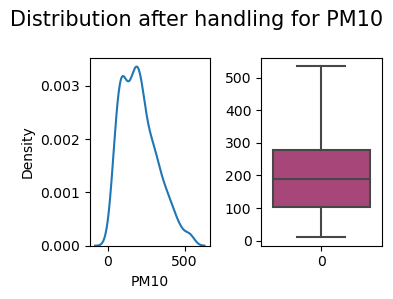

0      1.00000
1      1.46000
2      1.42000
3      1.15000
4      1.12000
        ...   
694    0.42000
695    0.43575
696    0.55650
697    0.74550
698    0.71400
Name: CO, Length: 699, dtype: float64


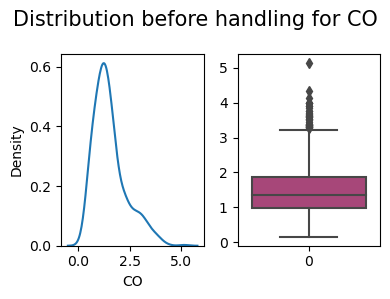

(699, 16)
699
699
(699, 16)
0      1.00000
1      1.46000
2      1.42000
3      1.15000
4      1.12000
        ...   
694    0.42000
695    0.43575
696    0.55650
697    0.74550
698    0.71400
Name: CO, Length: 699, dtype: float64


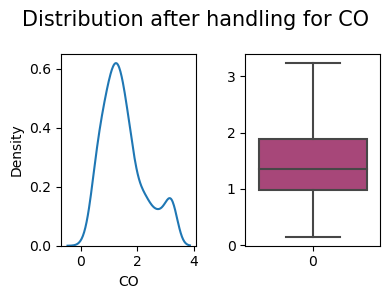

0       9.930
1      12.390
2       7.940
3       9.830
4      10.850
        ...  
694    11.718
695    11.718
696    11.718
697    11.718
698    19.467
Name: SO2, Length: 699, dtype: float64


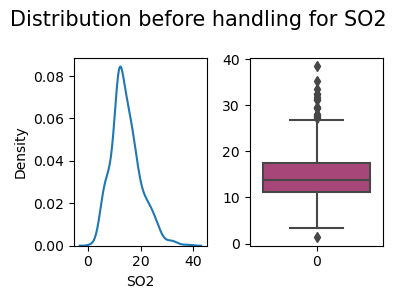

(699, 16)
699
699
(699, 16)
0       9.930
1      12.390
2       7.940
3       9.830
4      10.850
        ...  
694    11.718
695    11.718
696    11.718
697    11.718
698    19.467
Name: SO2, Length: 699, dtype: float64


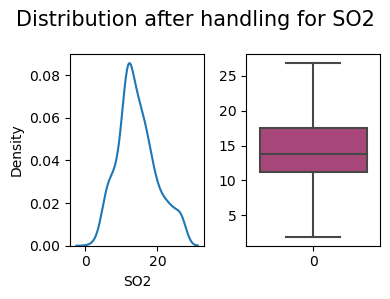

0      47.32000
1      33.40000
2      18.28000
3      40.66000
4      58.25000
         ...   
694    72.07200
695    65.61975
696    78.22500
697    58.47450
698    79.17000
Name: O3, Length: 699, dtype: float64


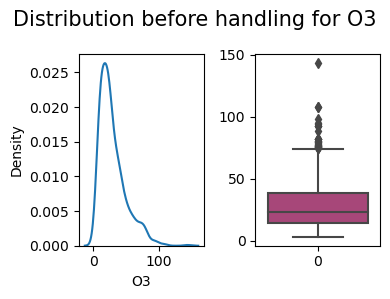

(699, 16)
699
699
(699, 16)
0      47.32000
1      33.40000
2      18.28000
3      40.66000
4      58.25000
         ...   
694    72.07200
695    65.61975
696    74.54910
697    58.47450
698    74.54910
Name: O3, Length: 699, dtype: float64


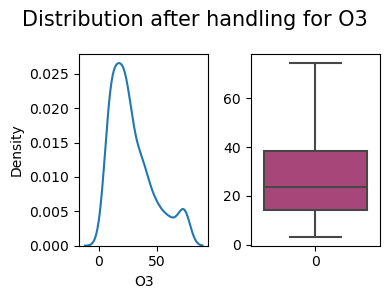

0      100.0
1      126.0
2      158.0
3      148.0
4      140.0
       ...  
694    134.0
695     91.0
696    136.0
697    110.0
698    149.0
Name: AQI, Length: 699, dtype: float64


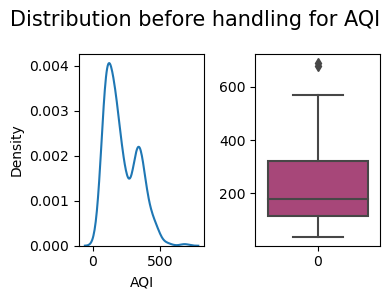

(699, 16)
699
699
(699, 16)
0      100.0
1      126.0
2      158.0
3      148.0
4      140.0
       ...  
694    134.0
695     91.0
696    136.0
697    110.0
698    149.0
Name: AQI, Length: 699, dtype: float64


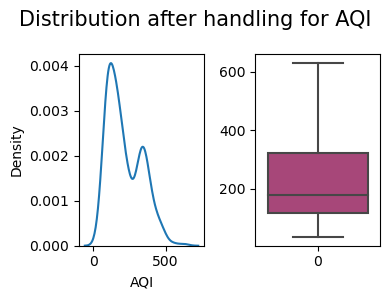

NEW LOCATION - 16
0      138.89000
1      140.38000
2      163.00000
3      214.84000
4      168.75000
         ...    
849     28.04550
850     27.99825
851     51.48150
852     61.55100
853     57.16200
Name: PM2.5, Length: 854, dtype: float64


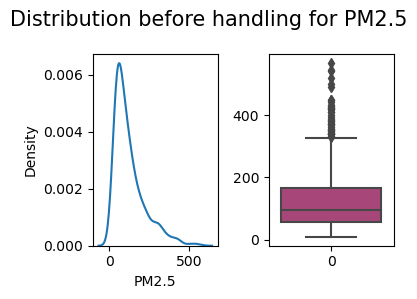

(854, 16)
854
854
(854, 16)
0      138.89000
1      140.38000
2      163.00000
3      214.84000
4      168.75000
         ...    
849     28.04550
850     27.99825
851     51.48150
852     61.55100
853     57.16200
Name: PM2.5, Length: 854, dtype: float64


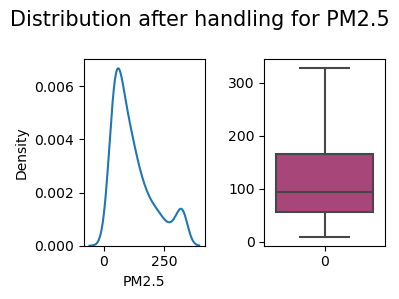

0      325.2200
1      327.5800
2      346.1200
3      435.4700
4      368.7400
         ...   
849     84.9660
850     62.2335
851    100.3065
852    129.9480
853    138.2850
Name: PM10, Length: 854, dtype: float64


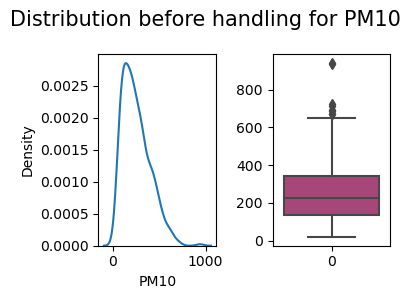

(854, 16)
854
854
(854, 16)
0      325.2200
1      327.5800
2      346.1200
3      435.4700
4      368.7400
         ...   
849     84.9660
850     62.2335
851    100.3065
852    129.9480
853    138.2850
Name: PM10, Length: 854, dtype: float64


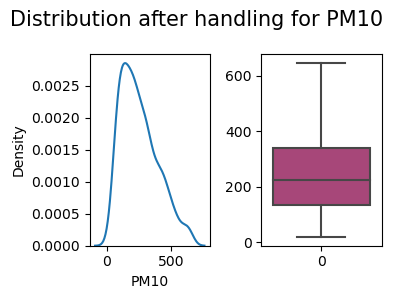

0      0.8700
1      0.8500
2      0.8300
3      1.1400
4      0.8200
        ...  
849    0.5565
850    0.6090
851    0.8190
852    0.7350
853    0.7770
Name: CO, Length: 854, dtype: float64


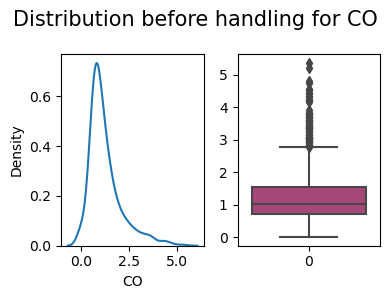

(854, 16)
854
854
(854, 16)
0      0.8700
1      0.8500
2      0.8300
3      1.1400
4      0.8200
        ...  
849    0.5565
850    0.6090
851    0.8190
852    0.7350
853    0.7770
Name: CO, Length: 854, dtype: float64


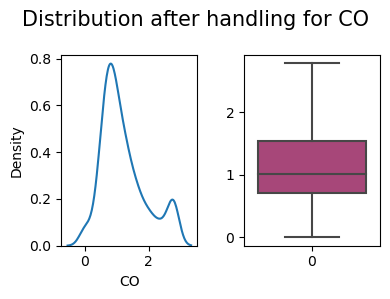

0       6.5000
1       9.6300
2      10.0100
3      12.2500
4      10.8300
        ...   
849     4.7355
850     4.3575
851     9.7020
852     7.7175
853     8.8095
Name: SO2, Length: 854, dtype: float64


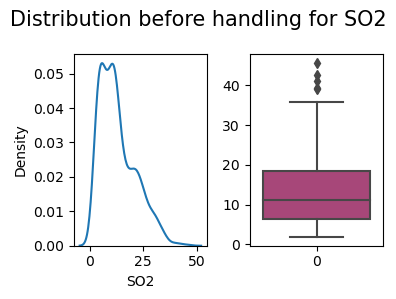

(854, 16)
854
854
(854, 16)
0       6.5000
1       9.6300
2      10.0100
3      12.2500
4      10.8300
        ...   
849     4.7355
850     4.3575
851     9.7020
852     7.7175
853     8.8095
Name: SO2, Length: 854, dtype: float64


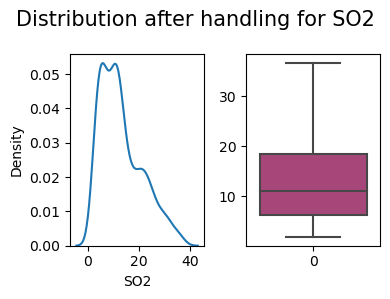

0       5.0000
1       5.0000
2       6.9500
3      30.4600
4      33.3900
        ...   
849    25.1370
850    25.1790
851    27.6465
852    19.8240
853    25.4625
Name: O3, Length: 854, dtype: float64


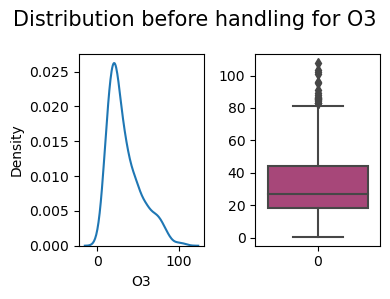

(854, 16)
854
854
(854, 16)
0       5.0000
1       5.0000
2       6.9500
3      30.4600
4      33.3900
        ...   
849    25.1370
850    25.1790
851    27.6465
852    19.8240
853    25.4625
Name: O3, Length: 854, dtype: float64


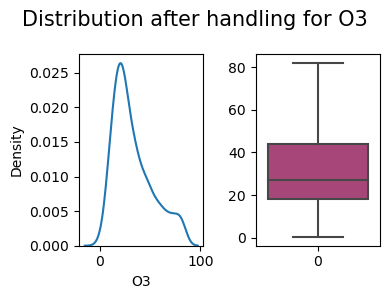

0      332.0
1      313.0
2      330.0
3      369.0
4      373.0
       ...  
849    149.0
850     72.0
851     69.0
852    131.0
853    121.0
Name: AQI, Length: 854, dtype: float64


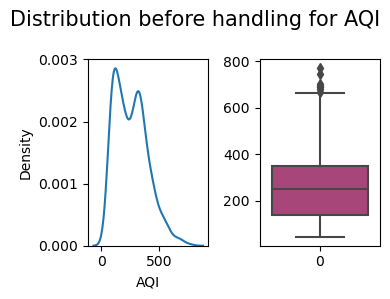

(854, 16)
854
854
(854, 16)
0      332.0
1      313.0
2      330.0
3      369.0
4      373.0
       ...  
849    149.0
850     72.0
851     69.0
852    131.0
853    121.0
Name: AQI, Length: 854, dtype: float64


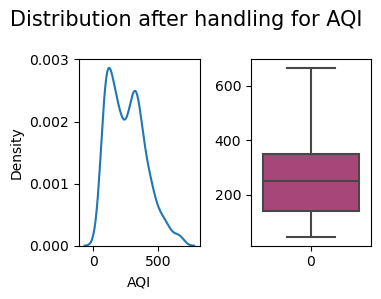

NEW LOCATION - 17
0      140.5000
1      112.1100
2      145.0800
3      200.2500
4      151.6700
         ...   
849     24.4335
850     24.8745
851     45.3915
852     53.9280
853     53.9805
Name: PM2.5, Length: 854, dtype: float64


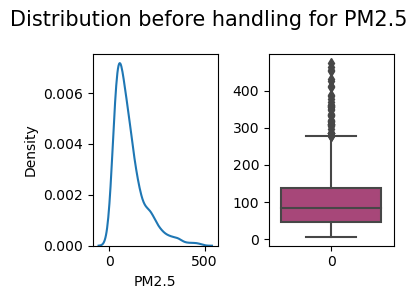

(854, 16)
854
854
(854, 16)
0      140.5000
1      112.1100
2      145.0800
3      200.2500
4      151.6700
         ...   
849     24.4335
850     24.8745
851     45.3915
852     53.9280
853     53.9805
Name: PM2.5, Length: 854, dtype: float64


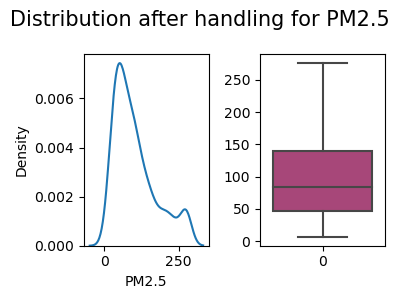

0      291.48000
1      258.73000
2      273.29000
3      380.50000
4      312.25000
         ...    
849     76.70250
850     54.35325
851     81.57450
852    114.03000
853    125.52750
Name: PM10, Length: 854, dtype: float64


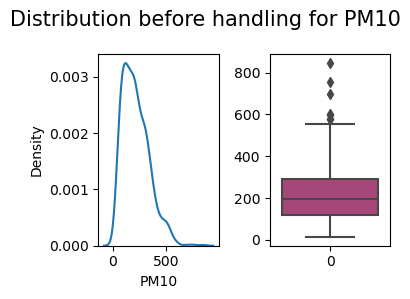

(854, 16)
854
854
(854, 16)
0      291.48000
1      258.73000
2      273.29000
3      380.50000
4      312.25000
         ...    
849     76.70250
850     54.35325
851     81.57450
852    114.03000
853    125.52750
Name: PM10, Length: 854, dtype: float64


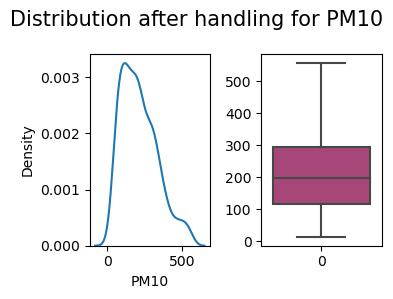

0      0.9400
1      0.7900
2      0.8800
3      1.1600
4      0.8700
        ...  
849    1.6170
850    1.6590
851    1.8165
852    1.8270
853    1.8060
Name: CO, Length: 854, dtype: float64


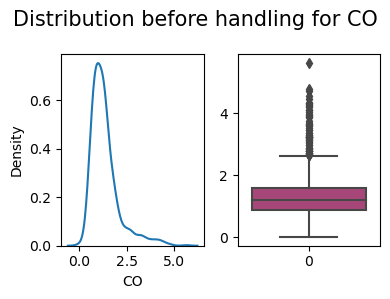

(854, 16)
854
854
(854, 16)
0      0.9400
1      0.7900
2      0.8800
3      1.1600
4      0.8700
        ...  
849    1.6170
850    1.6590
851    1.8165
852    1.8270
853    1.8060
Name: CO, Length: 854, dtype: float64


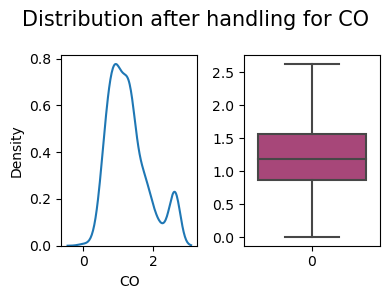

0       4.79000
1       6.34000
2       6.02000
3       7.04000
4       6.05000
         ...   
849    12.98850
850    10.00125
851    15.85500
852    12.97800
853    15.89700
Name: SO2, Length: 854, dtype: float64


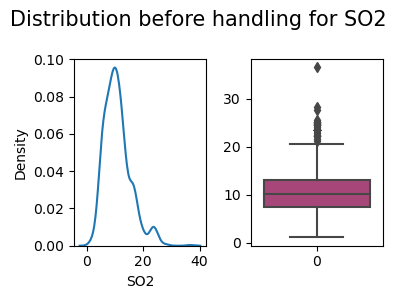

(854, 16)
854
854
(854, 16)
0       4.79000
1       6.34000
2       6.02000
3       7.04000
4       6.05000
         ...   
849    12.98850
850    10.00125
851    15.85500
852    12.97800
853    15.89700
Name: SO2, Length: 854, dtype: float64


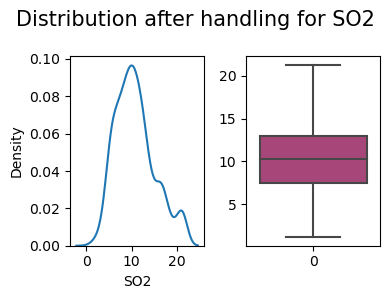

0       4.8000
1       4.8000
2       3.6500
3      45.9900
4      54.2900
        ...   
849    59.3250
850    60.2595
851    59.4090
852    61.3620
853    70.5285
Name: O3, Length: 854, dtype: float64


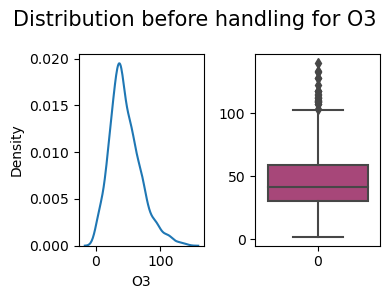

(854, 16)
854
854
(854, 16)
0       4.8000
1       4.8000
2       3.6500
3      45.9900
4      54.2900
        ...   
849    59.3250
850    60.2595
851    59.4090
852    61.3620
853    70.5285
Name: O3, Length: 854, dtype: float64


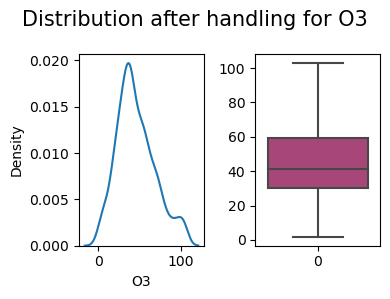

0      327.0
1      289.0
2      309.0
3      344.0
4      342.0
       ...  
849    141.0
850     91.5
851    103.0
852    121.0
853    134.0
Name: AQI, Length: 854, dtype: float64


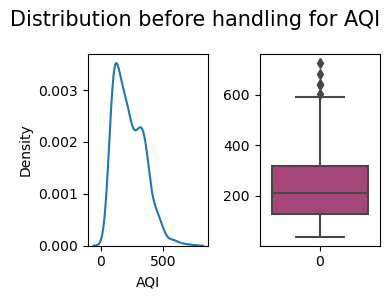

(854, 16)
854
854
(854, 16)
0      327.0
1      289.0
2      309.0
3      344.0
4      342.0
       ...  
849    141.0
850     91.5
851    103.0
852    121.0
853    134.0
Name: AQI, Length: 854, dtype: float64


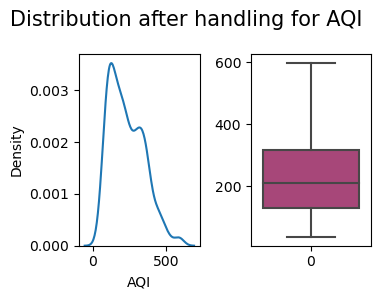

NEW LOCATION - 18
0      41.3400
1      44.9900
2      43.8200
3      54.9100
4      61.7700
        ...   
694    22.0920
695    20.7165
696    38.6715
697    44.1630
698    42.8505
Name: PM2.5, Length: 699, dtype: float64


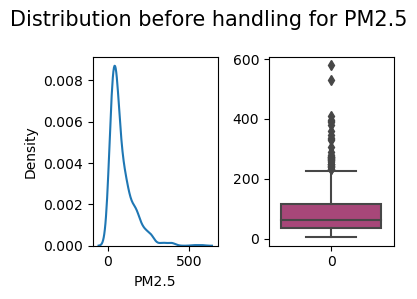

(699, 16)
699
699
(699, 16)
0      41.3400
1      44.9900
2      43.8200
3      54.9100
4      61.7700
        ...   
694    22.0920
695    20.7165
696    38.6715
697    44.1630
698    42.8505
Name: PM2.5, Length: 699, dtype: float64


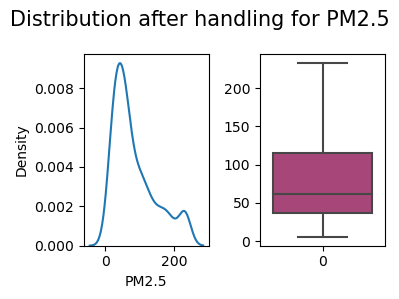

0      109.41000
1      130.45000
2      146.78000
3      142.18000
4      155.68000
         ...    
694     47.14500
695     34.17225
696     59.34600
697     71.46300
698     74.94900
Name: PM10, Length: 699, dtype: float64


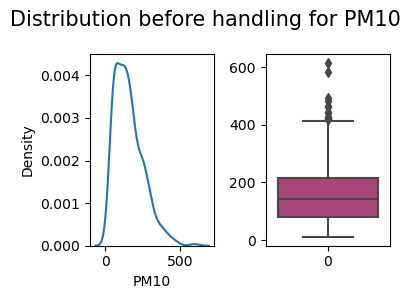

(699, 16)
699
699
(699, 16)
0      109.41000
1      130.45000
2      146.78000
3      142.18000
4      155.68000
         ...    
694     47.14500
695     34.17225
696     59.34600
697     71.46300
698     74.94900
Name: PM10, Length: 699, dtype: float64


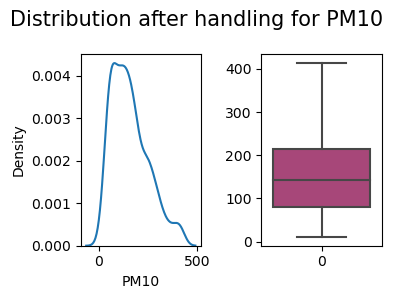

0      0.6000
1      0.5900
2      0.6300
3      0.6700
4      0.9100
        ...  
694    0.5040
695    0.4305
696    0.6510
697    0.6090
698    0.5880
Name: CO, Length: 699, dtype: float64


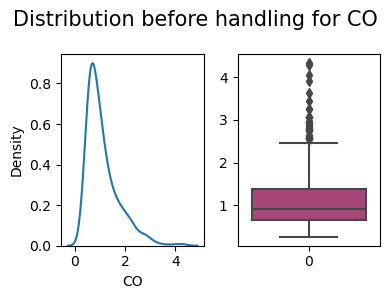

(699, 16)
699
699
(699, 16)
0      0.6000
1      0.5900
2      0.6300
3      0.6700
4      0.9100
        ...  
694    0.5040
695    0.4305
696    0.6510
697    0.6090
698    0.5880
Name: CO, Length: 699, dtype: float64


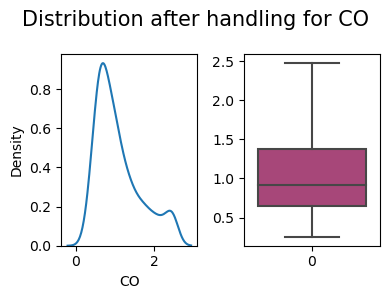

0       9.9700
1      10.6600
2       8.8700
3       8.2600
4      11.2800
        ...   
694     6.2685
695     5.0925
696     8.5680
697     6.4995
698    10.1640
Name: SO2, Length: 699, dtype: float64


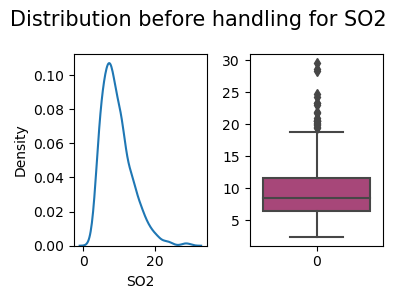

(699, 16)
699
699
(699, 16)
0       9.9700
1      10.6600
2       8.8700
3       8.2600
4      11.2800
        ...   
694     6.2685
695     5.0925
696     8.5680
697     6.4995
698    10.1640
Name: SO2, Length: 699, dtype: float64


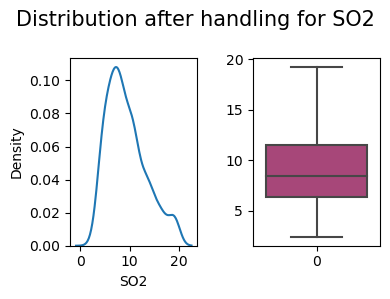

0      58.8400
1      56.4400
2      56.5400
3      74.3000
4      63.8400
        ...   
694    39.3645
695    40.3410
696    50.7045
697    49.7070
698    47.0925
Name: O3, Length: 699, dtype: float64


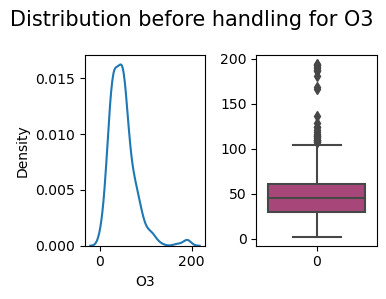

(699, 16)
699
699
(699, 16)
0      58.8400
1      56.4400
2      56.5400
3      74.3000
4      63.8400
        ...   
694    39.3645
695    40.3410
696    50.7045
697    49.7070
698    47.0925
Name: O3, Length: 699, dtype: float64


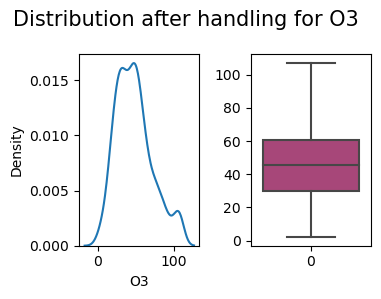

0      138.0
1      133.0
2      128.0
3      174.0
4      200.0
       ...  
694    101.0
695     55.5
696     94.0
697     96.0
698    103.0
Name: AQI, Length: 699, dtype: float64


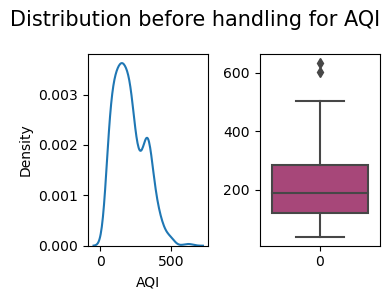

(699, 16)
699
699
(699, 16)
0      138.0
1      133.0
2      128.0
3      174.0
4      200.0
       ...  
694    101.0
695     55.5
696     94.0
697     96.0
698    103.0
Name: AQI, Length: 699, dtype: float64


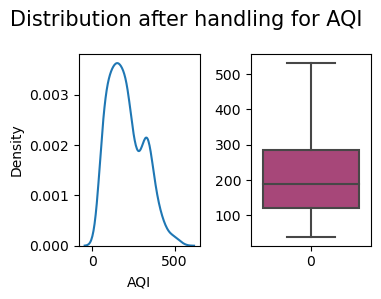

NEW LOCATION - 19
0      140.67000
1      108.50000
2      145.33000
3      172.58000
4      141.50000
         ...    
849     27.66750
850     22.19175
851     50.03250
852     54.41100
853     49.95900
Name: PM2.5, Length: 854, dtype: float64


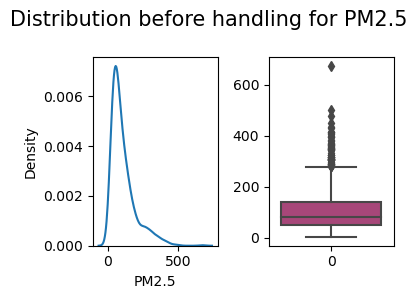

(854, 16)
854
854
(854, 16)
0      140.67000
1      108.50000
2      145.33000
3      172.58000
4      141.50000
         ...    
849     27.66750
850     22.19175
851     50.03250
852     54.41100
853     49.95900
Name: PM2.5, Length: 854, dtype: float64


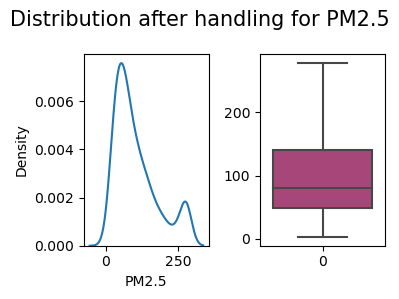

0      283.33000
1      247.75000
2      274.42000
3      319.71000
4      287.88000
         ...    
849     95.45550
850     66.53325
851     93.88050
852    110.36550
853    124.58250
Name: PM10, Length: 854, dtype: float64


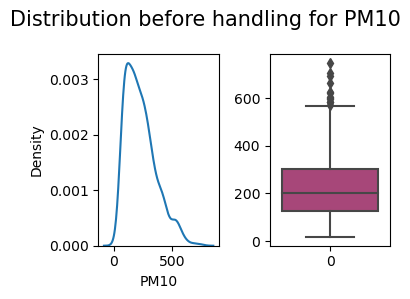

(854, 16)
854
854
(854, 16)
0      283.33000
1      247.75000
2      274.42000
3      319.71000
4      287.88000
         ...    
849     95.45550
850     66.53325
851     93.88050
852    110.36550
853    124.58250
Name: PM10, Length: 854, dtype: float64


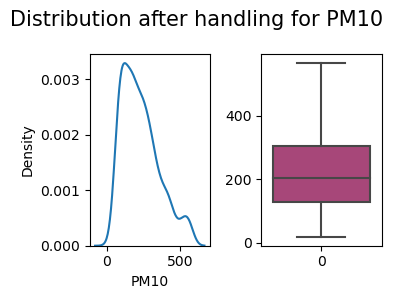

0      0.7400
1      0.6600
2      0.7400
3      0.7800
4      0.6900
        ...  
849    3.0030
850    2.8455
851    3.4650
852    3.9900
853    2.5935
Name: CO, Length: 854, dtype: float64


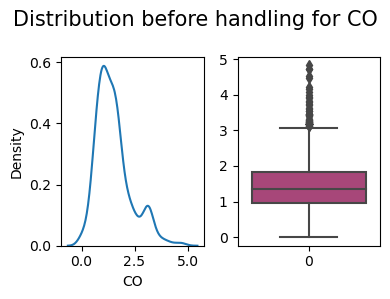

(854, 16)
854
854
(854, 16)
0      0.74000
1      0.66000
2      0.74000
3      0.78000
4      0.69000
        ...   
849    3.00300
850    2.84550
851    3.11835
852    3.11835
853    2.59350
Name: CO, Length: 854, dtype: float64


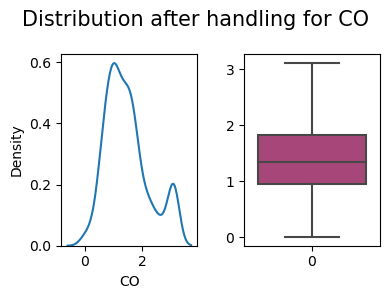

0      12.4900
1      13.2900
2      12.1600
3       9.5000
4       4.0200
        ...   
849    15.8655
850    15.7395
851    29.6520
852    34.6710
853    31.0485
Name: SO2, Length: 854, dtype: float64


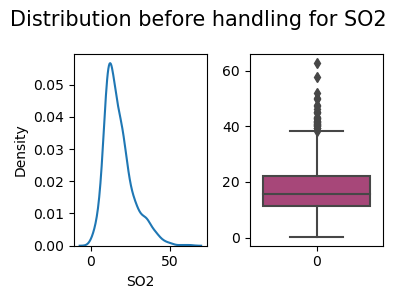

(854, 16)
854
854
(854, 16)
0      12.4900
1      13.2900
2      12.1600
3       9.5000
4       4.0200
        ...   
849    15.8655
850    15.7395
851    29.6520
852    34.6710
853    31.0485
Name: SO2, Length: 854, dtype: float64


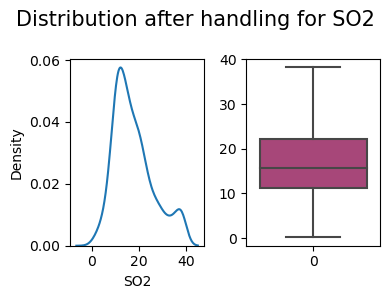

0      32.596440
1      17.881082
2       2.810000
3      30.180000
4      32.760000
         ...    
849    59.398500
850    54.825750
851    48.856500
852    36.109500
853    39.721500
Name: O3, Length: 854, dtype: float64


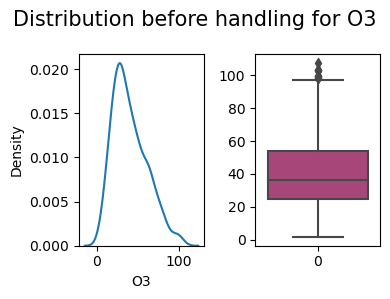

(854, 16)
854
854
(854, 16)
0      32.596440
1      17.881082
2       2.810000
3      30.180000
4      32.760000
         ...    
849    59.398500
850    54.825750
851    48.856500
852    36.109500
853    39.721500
Name: O3, Length: 854, dtype: float64


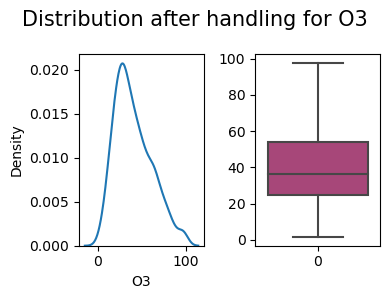

0      330.0
1      292.0
2      306.0
3      332.0
4      330.0
       ...  
849    163.0
850    123.5
851    141.0
852    139.0
853    126.0
Name: AQI, Length: 854, dtype: float64


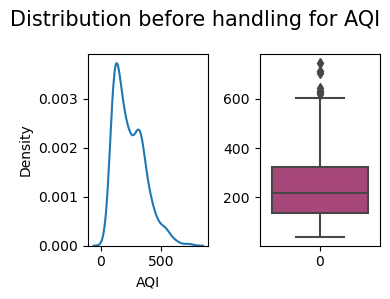

(854, 16)
854
854
(854, 16)
0      330.0
1      292.0
2      306.0
3      332.0
4      330.0
       ...  
849    163.0
850    123.5
851    141.0
852    139.0
853    126.0
Name: AQI, Length: 854, dtype: float64


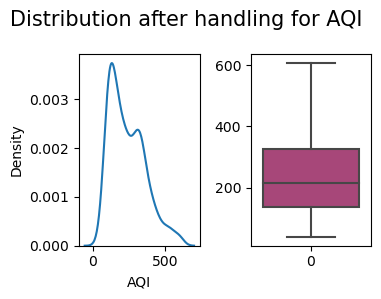

NEW LOCATION - 20
0      192.96000
1      160.04000
2      182.00000
3      219.04000
4      170.92000
         ...    
849     25.63050
850     26.67525
851     39.32250
852     40.95000
853     55.34550
Name: PM2.5, Length: 854, dtype: float64


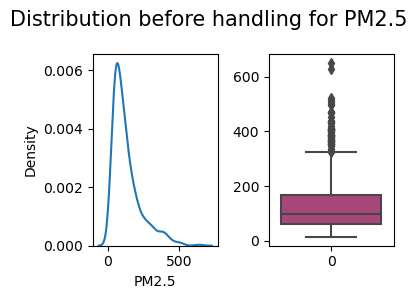

(854, 16)
854
854
(854, 16)
0      192.96000
1      160.04000
2      182.00000
3      219.04000
4      170.92000
         ...    
849     25.63050
850     26.67525
851     39.32250
852     40.95000
853     55.34550
Name: PM2.5, Length: 854, dtype: float64


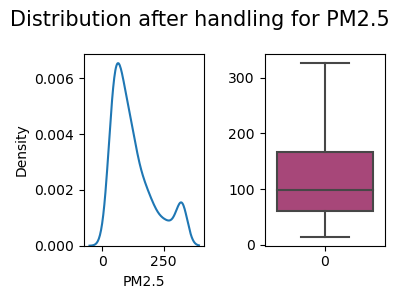

0      392.79000
1      357.75000
2      363.04000
3      420.04000
4      372.38000
         ...    
849     69.37350
850     54.30075
851     63.02100
852    112.69650
853    124.82400
Name: PM10, Length: 854, dtype: float64


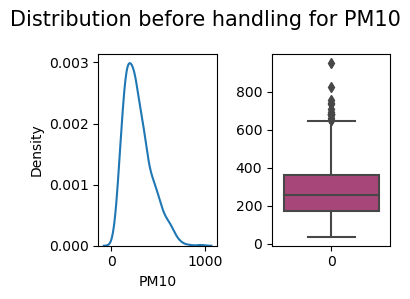

(854, 16)
854
854
(854, 16)
0      392.79000
1      357.75000
2      363.04000
3      420.04000
4      372.38000
         ...    
849     69.37350
850     54.30075
851     63.02100
852    112.69650
853    124.82400
Name: PM10, Length: 854, dtype: float64


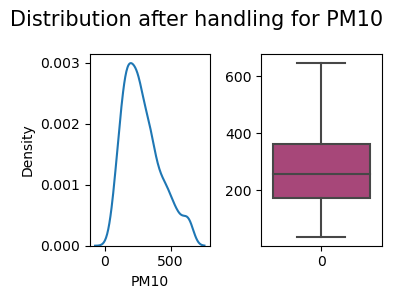

0      1.05000
1      1.02000
2      1.03000
3      1.18000
4      0.99000
        ...   
849    1.48050
850    1.53825
851    1.74300
852    1.58550
853    1.77450
Name: CO, Length: 854, dtype: float64


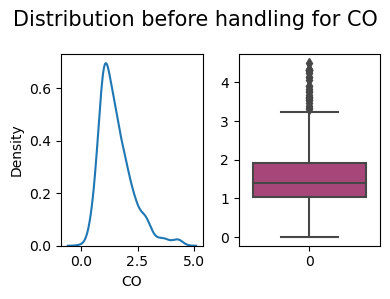

(854, 16)
854
854
(854, 16)
0      1.05000
1      1.02000
2      1.03000
3      1.18000
4      0.99000
        ...   
849    1.48050
850    1.53825
851    1.74300
852    1.58550
853    1.77450
Name: CO, Length: 854, dtype: float64


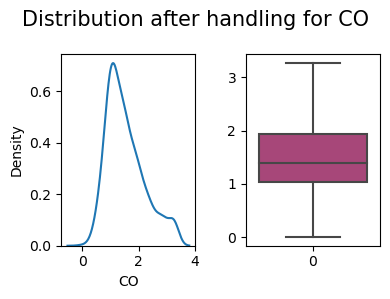

0       8.1100
1      12.0800
2       9.0800
3      14.0200
4       8.3500
        ...   
849    18.5745
850    18.9210
851    18.3855
852    18.4380
853    18.7635
Name: SO2, Length: 854, dtype: float64


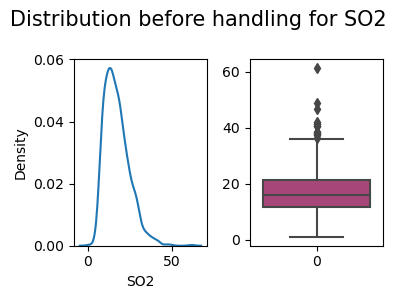

(854, 16)
854
854
(854, 16)
0       8.1100
1      12.0800
2       9.0800
3      14.0200
4       8.3500
        ...   
849    18.5745
850    18.9210
851    18.3855
852    18.4380
853    18.7635
Name: SO2, Length: 854, dtype: float64


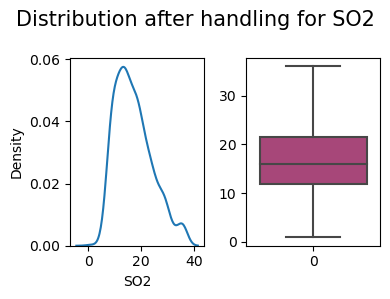

0       8.80000
1       8.80000
2       5.43000
3      21.39000
4      20.52000
         ...   
849     5.51250
850     5.67525
851     4.72500
852     5.02950
853    10.53150
Name: O3, Length: 854, dtype: float64


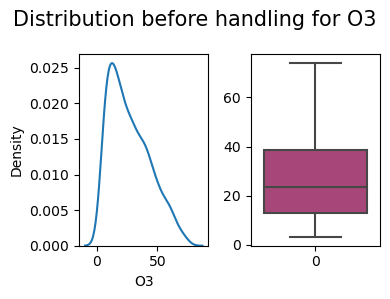

(854, 16)
854
854
(854, 16)
0       8.80000
1       8.80000
2       5.43000
3      21.39000
4      20.52000
         ...   
849     5.51250
850     5.67525
851     4.72500
852     5.02950
853    10.53150
Name: O3, Length: 854, dtype: float64


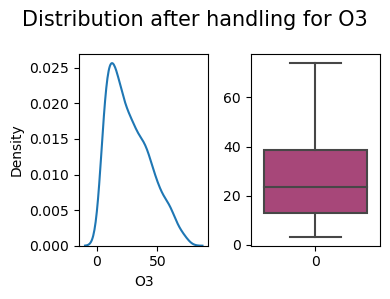

0      393.0
1      337.0
2      347.0
3      368.0
4      366.0
       ...  
849    139.0
850     94.5
851     99.0
852     99.0
853    119.0
Name: AQI, Length: 854, dtype: float64


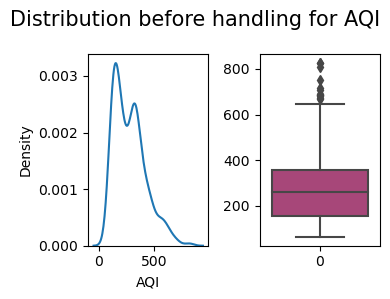

(854, 16)
854
854
(854, 16)
0      393.0
1      337.0
2      347.0
3      368.0
4      366.0
       ...  
849    139.0
850     94.5
851     99.0
852     99.0
853    119.0
Name: AQI, Length: 854, dtype: float64


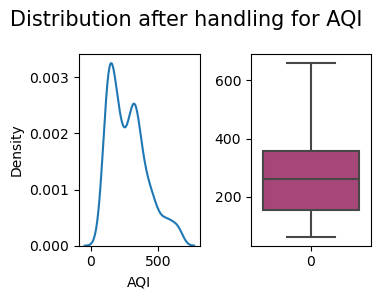

NEW LOCATION - 21
0      23.08000
1      22.68965
2      24.04000
3      18.41000
4      24.04000
         ...   
699    17.06250
700    24.12375
701     7.92750
702     5.34450
703     5.36550
Name: PM2.5, Length: 704, dtype: float64


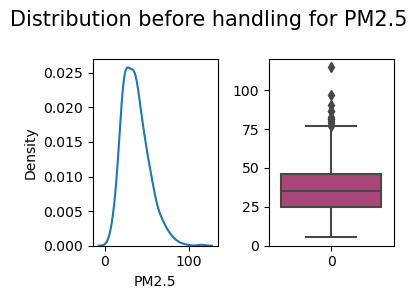

(704, 16)
704
704
(704, 16)
0      23.08000
1      22.68965
2      24.04000
3      18.41000
4      24.04000
         ...   
699    17.06250
700    24.12375
701     7.92750
702     5.34450
703     5.36550
Name: PM2.5, Length: 704, dtype: float64


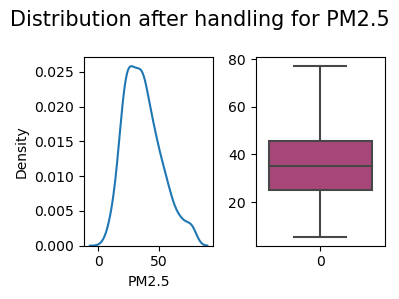

0      54.71000
1      53.77486
2      54.18000
3      49.22000
4      61.00000
         ...   
699    42.92400
700    63.95550
701    22.89000
702    19.93950
703    18.36450
Name: PM10, Length: 704, dtype: float64


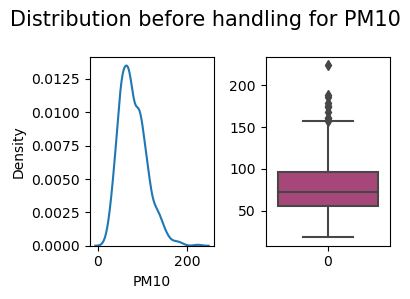

(704, 16)
704
704
(704, 16)
0      54.71000
1      53.77486
2      54.18000
3      49.22000
4      61.00000
         ...   
699    42.92400
700    63.95550
701    22.89000
702    19.93950
703    18.36450
Name: PM10, Length: 704, dtype: float64


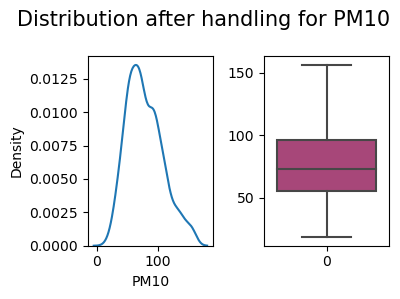

0      0.580000
1      1.029877
2      0.520000
3      0.360000
4      0.450000
         ...   
699    0.588000
700    0.372750
701    0.409500
702    0.178500
703    0.577500
Name: CO, Length: 704, dtype: float64


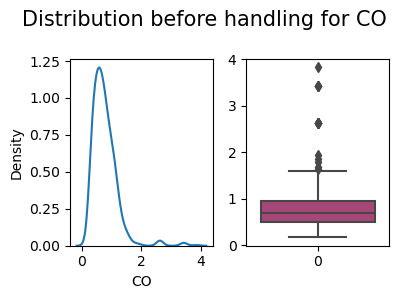

(704, 16)
704
704
(704, 16)
0      0.580000
1      1.029877
2      0.520000
3      0.360000
4      0.450000
         ...   
699    0.588000
700    0.372750
701    0.409500
702    0.178500
703    0.577500
Name: CO, Length: 704, dtype: float64


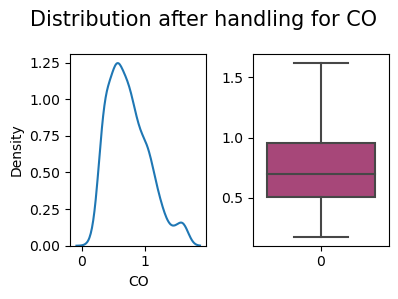

0       7.930000
1       7.083178
2       7.400000
3       6.080000
4       7.550000
         ...    
699     7.749000
700    10.190250
701     9.838500
702     9.103500
703    11.844000
Name: SO2, Length: 704, dtype: float64


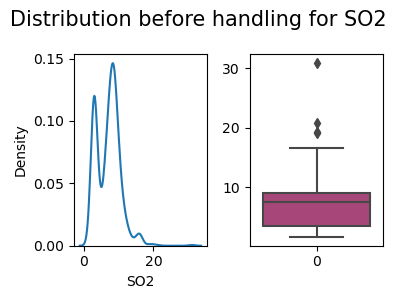

(704, 16)
704
704
(704, 16)
0       7.930000
1       7.083178
2       7.400000
3       6.080000
4       7.550000
         ...    
699     7.749000
700    10.190250
701     9.838500
702     9.103500
703    11.844000
Name: SO2, Length: 704, dtype: float64


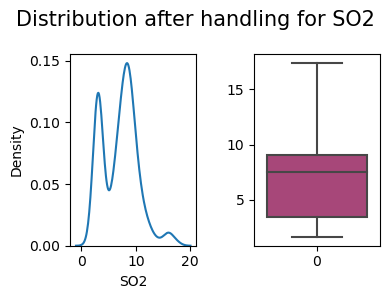

0      10.670000
1       9.906287
2      10.710000
3      10.260000
4       7.100000
         ...    
699    44.299500
700    36.902250
701    29.431500
702    23.341500
703    25.231500
Name: O3, Length: 704, dtype: float64


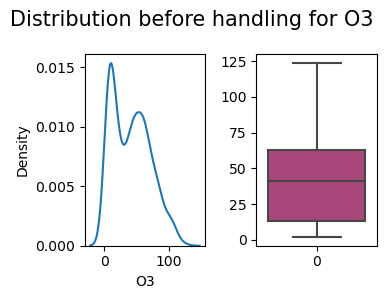

(704, 16)
704
704
(704, 16)
0      10.670000
1       9.906287
2      10.710000
3      10.260000
4       7.100000
         ...    
699    44.299500
700    36.902250
701    29.431500
702    23.341500
703    25.231500
Name: O3, Length: 704, dtype: float64


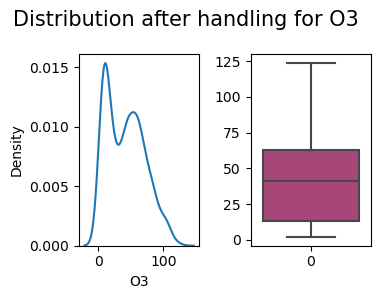

0      56.000000
1      55.279023
2      56.000000
3      51.000000
4      52.000000
         ...    
699    69.000000
700    58.000000
701    47.000000
702    32.000000
703    35.000000
Name: AQI, Length: 704, dtype: float64


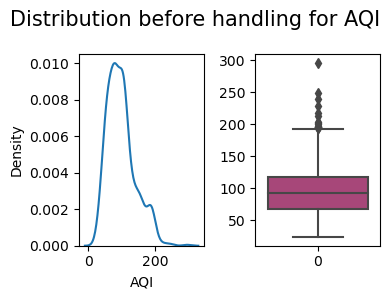

(704, 16)
704
704
(704, 16)
0      56.000000
1      55.279023
2      56.000000
3      51.000000
4      52.000000
         ...    
699    69.000000
700    58.000000
701    47.000000
702    32.000000
703    35.000000
Name: AQI, Length: 704, dtype: float64


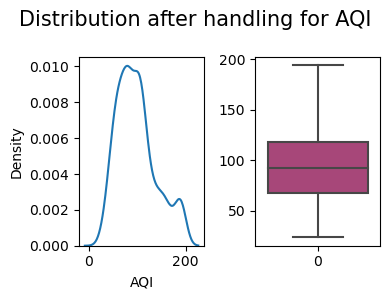

NEW LOCATION - 22
0      16.74000
1      15.98000
2      16.26000
3      13.49000
4       7.47000
         ...   
695     9.36600
696    15.79725
697     3.90600
698     3.74850
699    17.60850
Name: PM2.5, Length: 700, dtype: float64


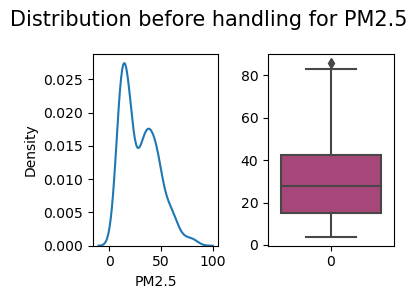

(700, 16)
700
700
(700, 16)
0      16.74000
1      15.98000
2      16.26000
3      13.49000
4       7.47000
         ...   
695     9.36600
696    15.79725
697     3.90600
698     3.74850
699    17.60850
Name: PM2.5, Length: 700, dtype: float64


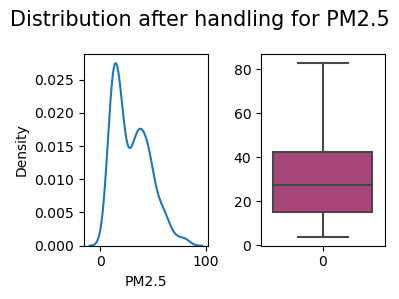

0      42.2700
1      62.4900
2      48.3800
3      40.0600
4      23.7100
        ...   
695    39.5220
696    46.4625
697    22.5645
698    15.4035
699    19.6035
Name: PM10, Length: 700, dtype: float64


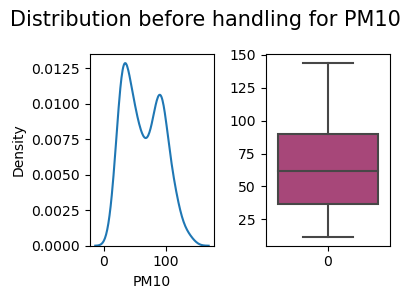

(700, 16)
700
700
(700, 16)
0      42.2700
1      62.4900
2      48.3800
3      40.0600
4      23.7100
        ...   
695    39.5220
696    46.4625
697    22.5645
698    15.4035
699    19.6035
Name: PM10, Length: 700, dtype: float64


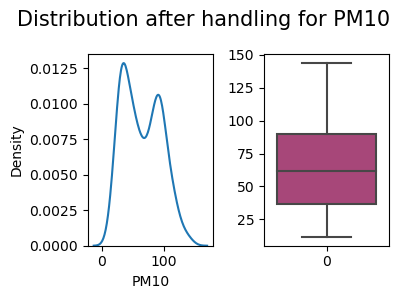

0      0.3900
1      0.4100
2      0.4000
3      0.5000
4      0.4000
        ...  
695    0.5985
696    0.9870
697    0.7980
698    0.5985
699    1.0605
Name: CO, Length: 700, dtype: float64


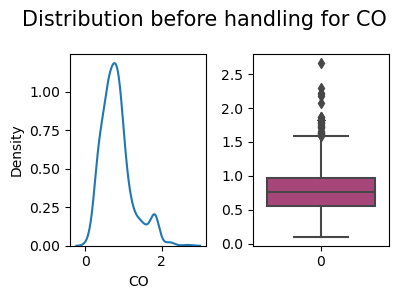

(700, 16)
700
700
(700, 16)
0      0.3900
1      0.4100
2      0.4000
3      0.5000
4      0.4000
        ...  
695    0.5985
696    0.9870
697    0.7980
698    0.5985
699    1.0605
Name: CO, Length: 700, dtype: float64


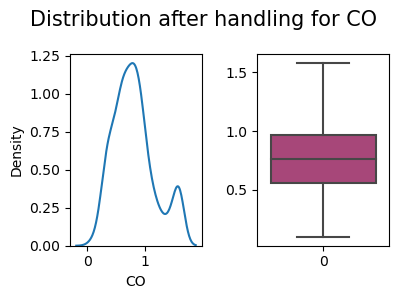

0      3.74000
1      3.83000
2      5.35000
3      3.20000
4      3.67000
        ...   
695    9.91200
696    9.74925
697    7.93800
698    8.04300
699    9.12450
Name: SO2, Length: 700, dtype: float64


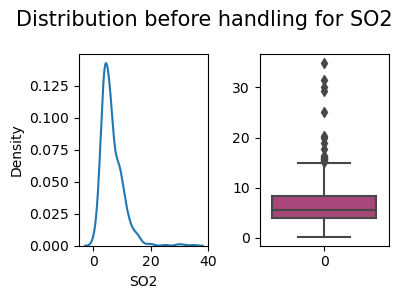

(700, 16)
700
700
(700, 16)
0      3.74000
1      3.83000
2      5.35000
3      3.20000
4      3.67000
        ...   
695    9.91200
696    9.74925
697    7.93800
698    8.04300
699    9.12450
Name: SO2, Length: 700, dtype: float64


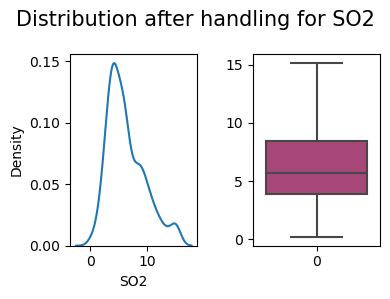

0      25.9700
1      22.1200
2      22.8000
3      22.9900
4      26.6200
        ...   
695    31.6365
696    26.6700
697    22.6905
698    16.1490
699    18.7110
Name: O3, Length: 700, dtype: float64


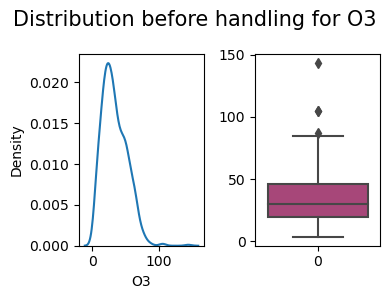

(700, 16)
700
700
(700, 16)
0      25.9700
1      22.1200
2      22.8000
3      22.9900
4      26.6200
        ...   
695    31.6365
696    26.6700
697    22.6905
698    16.1490
699    18.7110
Name: O3, Length: 700, dtype: float64


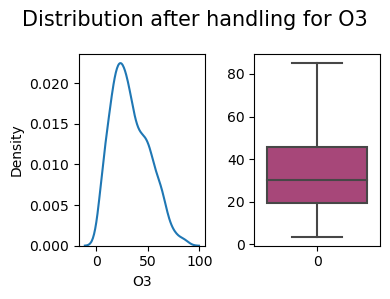

0      43.0
1      50.0
2      58.0
3      48.0
4      40.0
       ... 
695    54.0
696    70.0
697    66.0
698    42.0
699    62.0
Name: AQI, Length: 700, dtype: float64


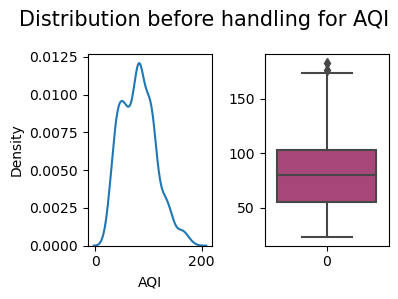

(700, 16)
700
700
(700, 16)
0      43.0
1      50.0
2      58.0
3      48.0
4      40.0
       ... 
695    54.0
696    70.0
697    66.0
698    42.0
699    62.0
Name: AQI, Length: 700, dtype: float64


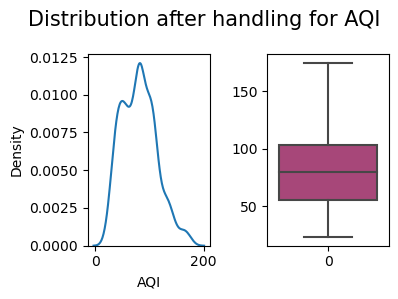

NEW LOCATION - 23
0      13.2300
1      13.5800
2      12.2600
3       8.5600
4      10.8200
        ...   
694    11.5080
695    17.9130
696     3.4440
697     2.5725
698     3.7170
Name: PM2.5, Length: 699, dtype: float64


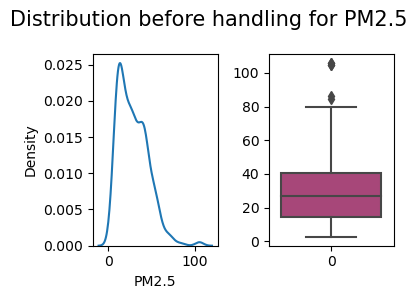

(699, 16)
699
699
(699, 16)
0      13.2300
1      13.5800
2      12.2600
3       8.5600
4      10.8200
        ...   
694    11.5080
695    17.9130
696     3.4440
697     2.5725
698     3.7170
Name: PM2.5, Length: 699, dtype: float64


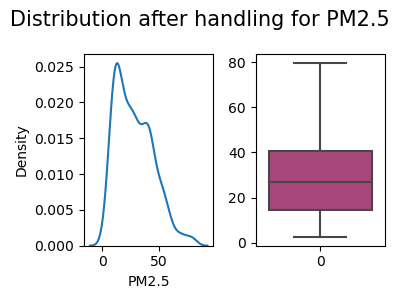

0      19.336669
1      20.970886
2      24.840000
3      17.080000
4      22.690000
         ...    
694    36.960000
695    43.239000
696    17.304000
697    13.219500
698    11.119500
Name: PM10, Length: 699, dtype: float64


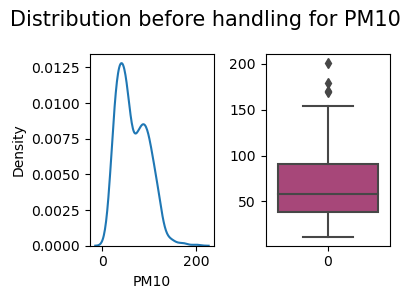

(699, 16)
699
699
(699, 16)
0      19.336669
1      20.970886
2      24.840000
3      17.080000
4      22.690000
         ...    
694    36.960000
695    43.239000
696    17.304000
697    13.219500
698    11.119500
Name: PM10, Length: 699, dtype: float64


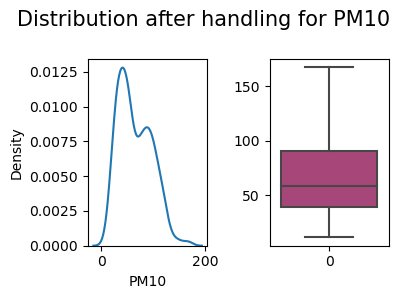

0      0.4600
1      0.4000
2      0.4300
3      0.5300
4      0.5100
        ...  
694    0.6300
695    0.7665
696    0.4410
697    0.5250
698    0.2520
Name: CO, Length: 699, dtype: float64


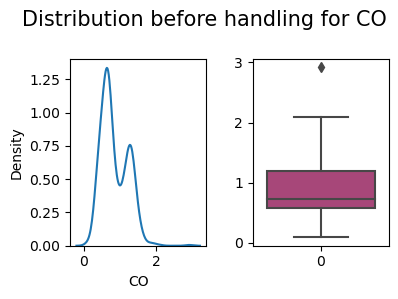

(699, 16)
699
699
(699, 16)
0      0.4600
1      0.4000
2      0.4300
3      0.5300
4      0.5100
        ...  
694    0.6300
695    0.7665
696    0.4410
697    0.5250
698    0.2520
Name: CO, Length: 699, dtype: float64


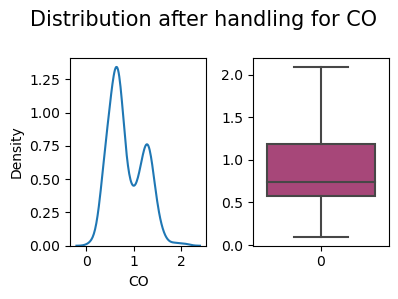

0       6.18000
1       5.91000
2      10.64000
3      15.57000
4      15.08000
         ...   
694    10.74150
695    11.27175
696    10.94100
697    10.69950
698    11.83350
Name: SO2, Length: 699, dtype: float64


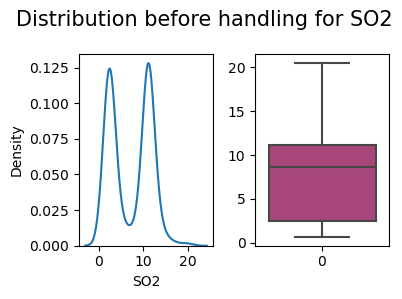

(699, 16)
699
699
(699, 16)
0       6.18000
1       5.91000
2      10.64000
3      15.57000
4      15.08000
         ...   
694    10.74150
695    11.27175
696    10.94100
697    10.69950
698    11.83350
Name: SO2, Length: 699, dtype: float64


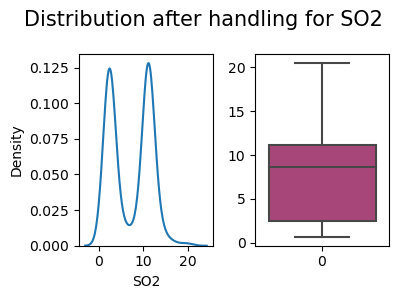

0       8.97000
1       8.43000
2      22.47000
3      28.15000
4      24.11000
         ...   
694    29.29500
695    27.67275
696    20.48550
697    17.49300
698    18.40650
Name: O3, Length: 699, dtype: float64


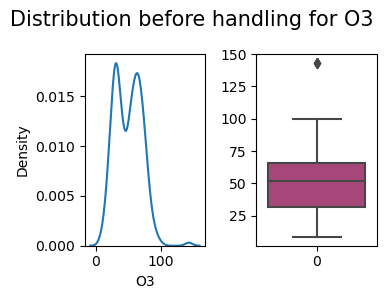

(699, 16)
699
699
(699, 16)
0       8.97000
1       8.43000
2      22.47000
3      28.15000
4      24.11000
         ...   
694    29.29500
695    27.67275
696    20.48550
697    17.49300
698    18.40650
Name: O3, Length: 699, dtype: float64


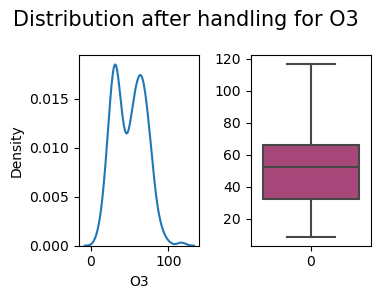

0      44.0
1      37.0
2      38.0
3      42.0
4      41.0
       ... 
694    48.0
695    54.5
696    40.0
697    27.0
698    22.0
Name: AQI, Length: 699, dtype: float64


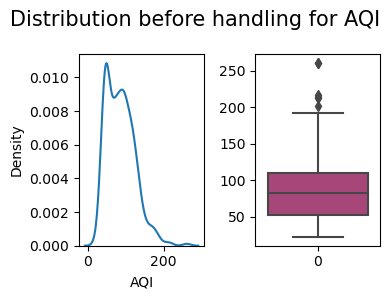

(699, 16)
699
699
(699, 16)
0      44.0
1      37.0
2      38.0
3      42.0
4      41.0
       ... 
694    48.0
695    54.5
696    40.0
697    27.0
698    22.0
Name: AQI, Length: 699, dtype: float64


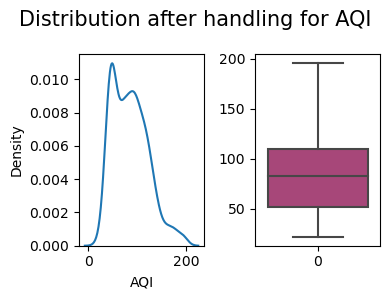

NEW LOCATION - 24
0      19.33000
1      16.14000
2      17.05000
3      16.11000
4      11.13000
         ...   
695    11.20350
696    21.42525
697     6.73050
698     4.89300
699     5.08200
Name: PM2.5, Length: 700, dtype: float64


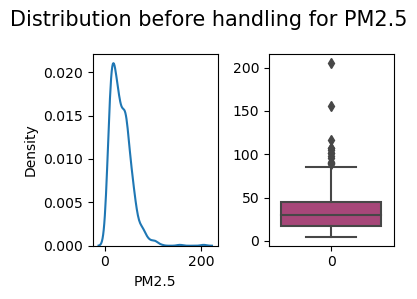

(700, 16)
700
700
(700, 16)
0      19.33000
1      16.14000
2      17.05000
3      16.11000
4      11.13000
         ...   
695    11.20350
696    21.42525
697     6.73050
698     4.89300
699     5.08200
Name: PM2.5, Length: 700, dtype: float64


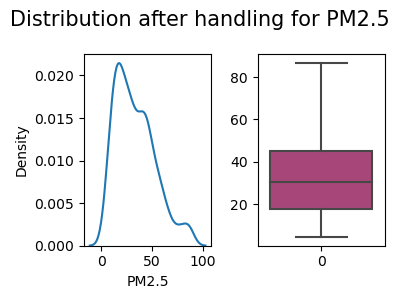

0      50.9600
1      53.7300
2      62.8500
3      50.9500
4      29.2600
        ...   
695    23.5620
696    48.4785
697    19.9710
698    18.8685
699    16.8945
Name: PM10, Length: 700, dtype: float64


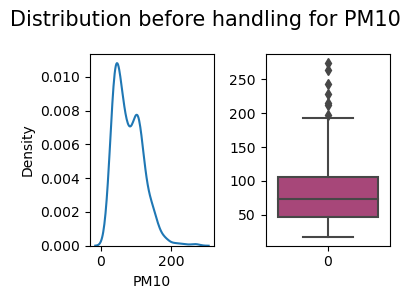

(700, 16)
700
700
(700, 16)
0      50.9600
1      53.7300
2      62.8500
3      50.9500
4      29.2600
        ...   
695    23.5620
696    48.4785
697    19.9710
698    18.8685
699    16.8945
Name: PM10, Length: 700, dtype: float64


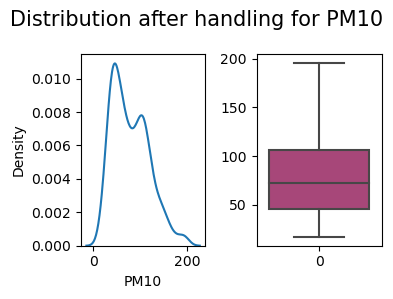

0      0.48000
1      0.42000
2      0.42000
3      0.53000
4      0.43000
        ...   
695    1.05000
696    0.82425
697    0.49350
698    0.60900
699    0.52500
Name: CO, Length: 700, dtype: float64


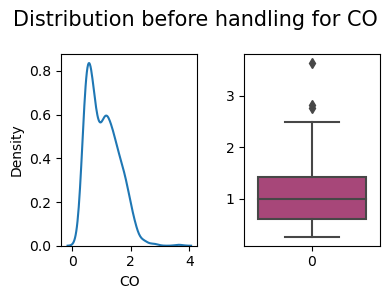

(700, 16)
700
700
(700, 16)
0      0.48000
1      0.42000
2      0.42000
3      0.53000
4      0.43000
        ...   
695    1.05000
696    0.82425
697    0.49350
698    0.60900
699    0.52500
Name: CO, Length: 700, dtype: float64


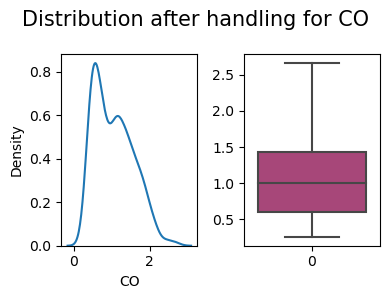

0      18.78000
1      17.98000
2       9.24000
3      13.86000
4      14.13000
         ...   
695     3.62250
696     4.02675
697     4.22100
698     3.83250
699     4.14750
Name: SO2, Length: 700, dtype: float64


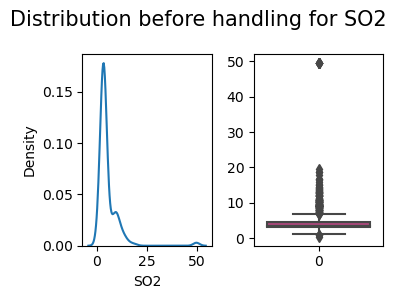

(700, 16)
700
700
(700, 16)
0      6.83910
1      6.83910
2      6.83910
3      6.83910
4      6.83910
        ...   
695    3.62250
696    4.02675
697    4.22100
698    3.83250
699    4.14750
Name: SO2, Length: 700, dtype: float64


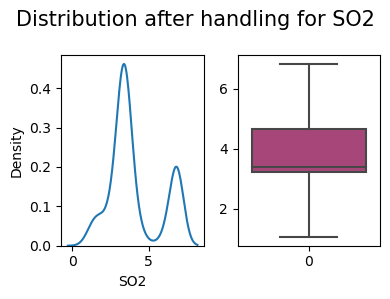

0      20.5800
1      16.9200
2      19.1100
3      18.4500
4      22.9000
        ...   
695    19.5195
696    36.2460
697    29.0220
698    26.8905
699    30.6285
Name: O3, Length: 700, dtype: float64


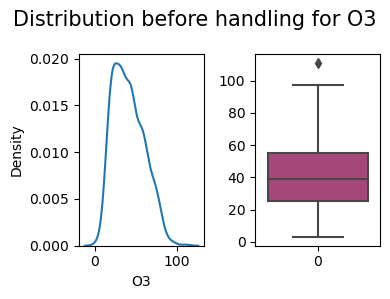

(700, 16)
700
700
(700, 16)
0      20.5800
1      16.9200
2      19.1100
3      18.4500
4      22.9000
        ...   
695    19.5195
696    36.2460
697    29.0220
698    26.8905
699    30.6285
Name: O3, Length: 700, dtype: float64


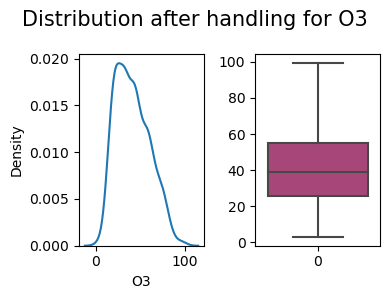

0      42.0
1      56.0
2      55.0
3      61.0
4      40.0
       ... 
695    72.0
696    64.5
697    43.0
698    41.0
699    47.0
Name: AQI, Length: 700, dtype: float64


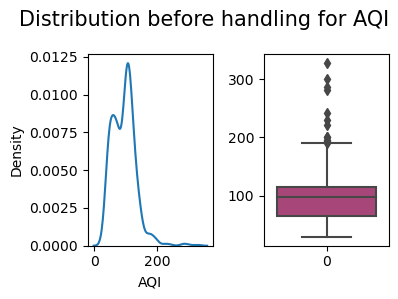

(700, 16)
700
700
(700, 16)
0      42.0
1      56.0
2      55.0
3      61.0
4      40.0
       ... 
695    72.0
696    64.5
697    43.0
698    41.0
699    47.0
Name: AQI, Length: 700, dtype: float64


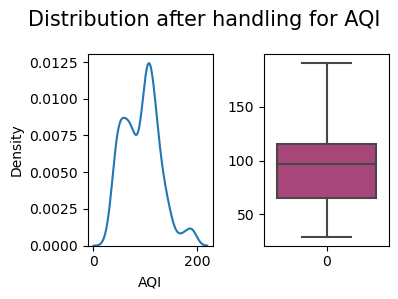

NEW LOCATION - 25
0      28.550000
1      28.634979
2      30.560000
3      25.010000
4      38.860000
         ...    
699    18.795000
700    19.257000
701     8.641500
702     7.119000
703     5.869500
Name: PM2.5, Length: 704, dtype: float64


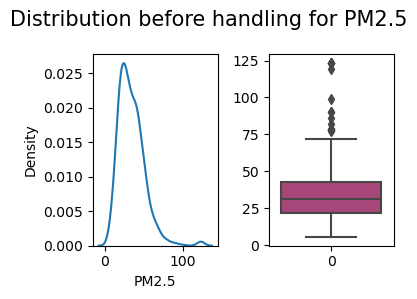

(704, 16)
704
704
(704, 16)
0      28.550000
1      28.634979
2      30.560000
3      25.010000
4      38.860000
         ...    
699    18.795000
700    19.257000
701     8.641500
702     7.119000
703     5.869500
Name: PM2.5, Length: 704, dtype: float64


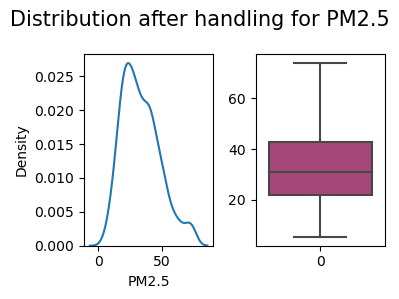

0      106.080000
1      102.427077
2       98.760000
3       95.140000
4      114.120000
          ...    
699     53.308500
700     51.119250
701     33.631500
702     35.574000
703     36.204000
Name: PM10, Length: 704, dtype: float64


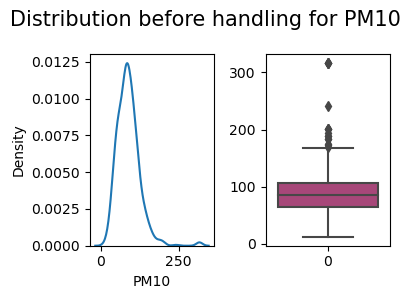

(704, 16)
704
704
(704, 16)
0      106.080000
1      102.427077
2       98.760000
3       95.140000
4      114.120000
          ...    
699     53.308500
700     51.119250
701     33.631500
702     35.574000
703     36.204000
Name: PM10, Length: 704, dtype: float64


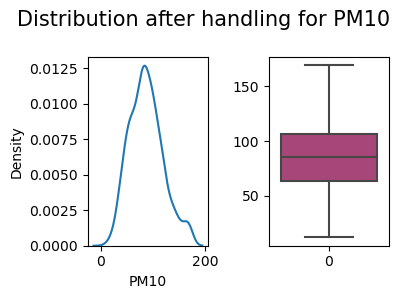

0      0.962732
1      1.177258
2      0.620000
3      1.130000
4      1.590000
         ...   
699    0.714000
700    0.582750
701    0.483000
702    0.451500
703    0.409500
Name: CO, Length: 704, dtype: float64


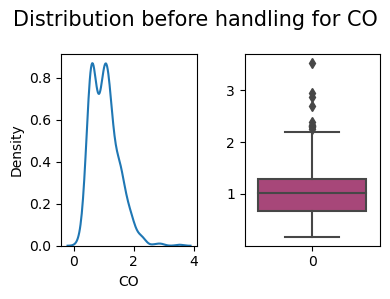

(704, 16)
704
704
(704, 16)
0      0.962732
1      1.177258
2      0.620000
3      1.130000
4      1.590000
         ...   
699    0.714000
700    0.582750
701    0.483000
702    0.451500
703    0.409500
Name: CO, Length: 704, dtype: float64


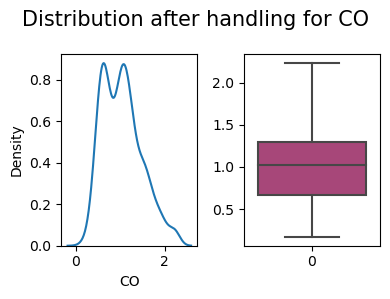

0      8.240000
1      8.975773
2      9.190000
3      8.260000
4      9.520000
         ...   
699    2.184000
700    2.488500
701    5.019000
702    4.819500
703    4.725000
Name: SO2, Length: 704, dtype: float64


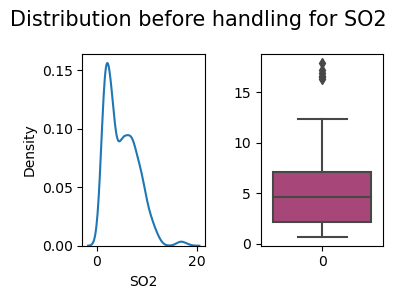

(704, 16)
704
704
(704, 16)
0      8.240000
1      8.975773
2      9.190000
3      8.260000
4      9.520000
         ...   
699    2.184000
700    2.488500
701    5.019000
702    4.819500
703    4.725000
Name: SO2, Length: 704, dtype: float64


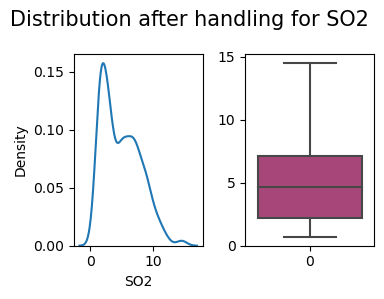

0       8.480000
1       7.594638
2       8.450000
3       8.350000
4       7.000000
         ...    
699    18.784500
700    26.538750
701    27.352500
702    25.378500
703    16.558500
Name: O3, Length: 704, dtype: float64


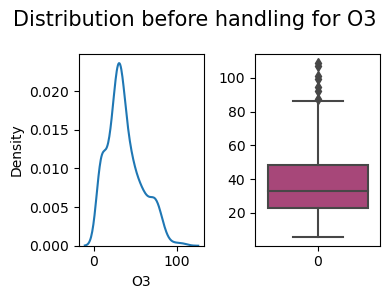

(704, 16)
704
704
(704, 16)
0       8.480000
1       7.594638
2       8.450000
3       8.350000
4       7.000000
         ...    
699    18.784500
700    26.538750
701    27.352500
702    25.378500
703    16.558500
Name: O3, Length: 704, dtype: float64


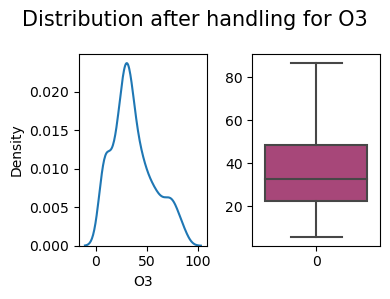

0      113.000000
1      107.144491
2      101.000000
3       96.000000
4      104.000000
          ...    
699     62.000000
700     60.500000
701     48.000000
702     38.000000
703     37.000000
Name: AQI, Length: 704, dtype: float64


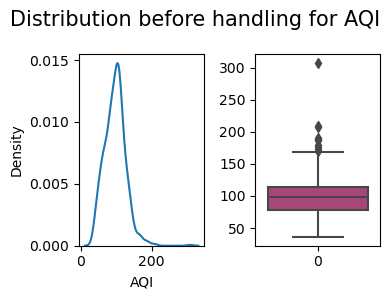

(704, 16)
704
704
(704, 16)
0      113.000000
1      107.144491
2      101.000000
3       96.000000
4      104.000000
          ...    
699     62.000000
700     60.500000
701     48.000000
702     38.000000
703     37.000000
Name: AQI, Length: 704, dtype: float64


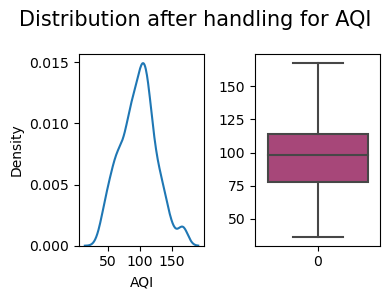

NEW LOCATION - 26
0      13.73940
1      15.19800
2      16.08540
3      18.72720
4      19.33920
         ...   
357    15.97050
358     9.65475
359    21.60900
360    22.79550
361     8.38950
Name: PM2.5, Length: 362, dtype: float64


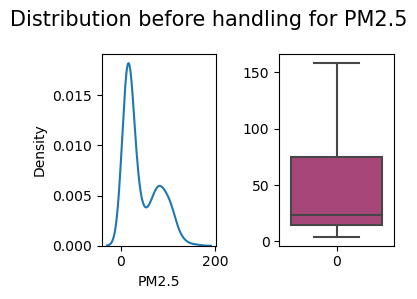

(362, 16)
362
362
(362, 16)
0      13.73940
1      15.19800
2      16.08540
3      18.72720
4      19.33920
         ...   
357    15.97050
358     9.65475
359    21.60900
360    22.79550
361     8.38950
Name: PM2.5, Length: 362, dtype: float64


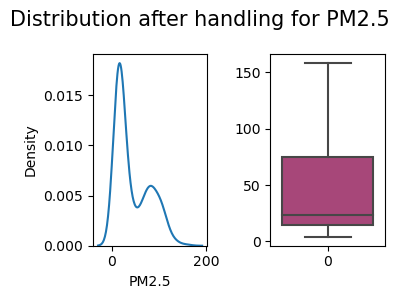

0      60.8226
1      83.7012
2      73.2054
3      64.9740
4      57.2832
        ...   
357    27.9930
358    22.3650
359    28.3395
360    54.2640
361    25.3470
Name: PM10, Length: 362, dtype: float64


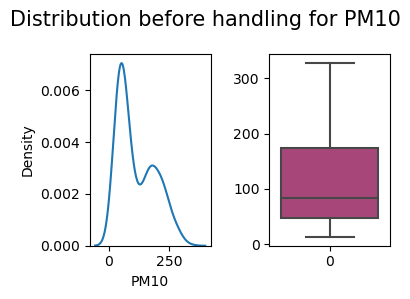

(362, 16)
362
362
(362, 16)
0      60.8226
1      83.7012
2      73.2054
3      64.9740
4      57.2832
        ...   
357    27.9930
358    22.3650
359    28.3395
360    54.2640
361    25.3470
Name: PM10, Length: 362, dtype: float64


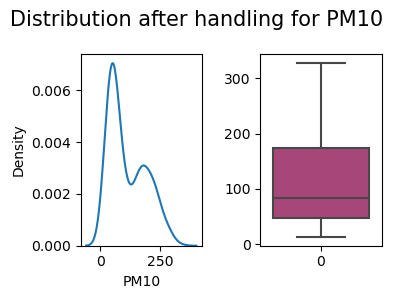

0      0.36720
1      0.40800
2      0.31620
3      0.48960
4      0.65280
        ...   
357    0.17850
358    0.15225
359    0.17850
360    0.34650
361    0.19950
Name: CO, Length: 362, dtype: float64


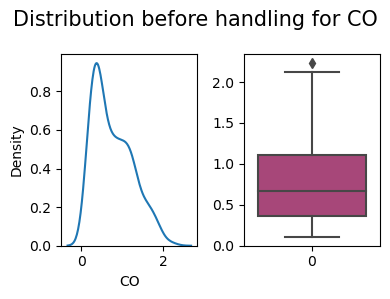

(362, 16)
362
362
(362, 16)
0      0.36720
1      0.40800
2      0.31620
3      0.48960
4      0.65280
        ...   
357    0.17850
358    0.15225
359    0.17850
360    0.34650
361    0.19950
Name: CO, Length: 362, dtype: float64


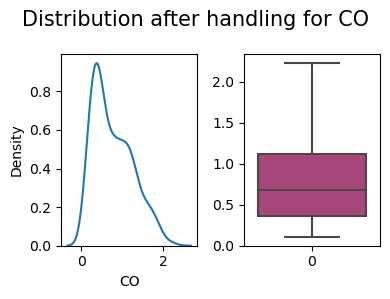

0      6.09960
1      7.52760
2      7.35420
3      7.38480
4      7.34400
        ...   
357    3.73800
358    3.44925
359    2.99250
360    1.61700
361    2.38350
Name: SO2, Length: 362, dtype: float64


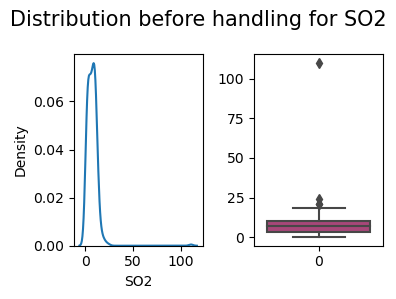

(362, 16)
362
362
(362, 16)
0      6.09960
1      7.52760
2      7.35420
3      7.38480
4      7.34400
        ...   
357    3.73800
358    3.44925
359    2.99250
360    1.61700
361    2.38350
Name: SO2, Length: 362, dtype: float64


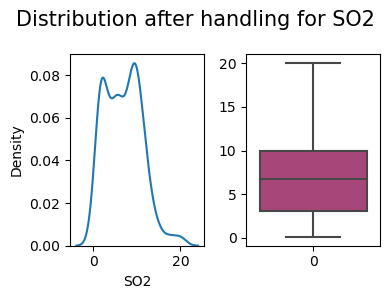

0      11.2098
1      11.7096
2      14.5758
3      22.3074
4      42.2076
        ...   
357     6.5520
358     6.4785
359     7.3290
360     7.2555
361     7.4550
Name: O3, Length: 362, dtype: float64


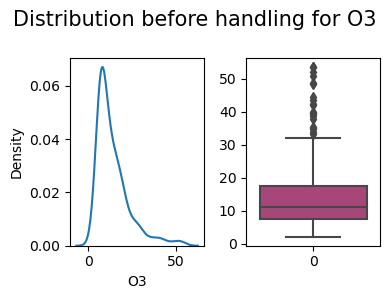

(362, 16)
362
362
(362, 16)
0      11.20980
1      11.70960
2      14.57580
3      22.30740
4      33.00675
         ...   
357     6.55200
358     6.47850
359     7.32900
360     7.25550
361     7.45500
Name: O3, Length: 362, dtype: float64


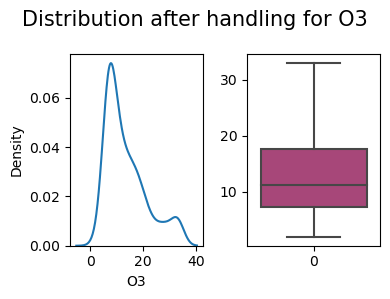

0       79.0
1       81.0
2       87.0
3       76.0
4      110.0
       ...  
357     94.0
358     89.0
359     65.0
360     44.0
361     64.0
Name: AQI, Length: 362, dtype: float64


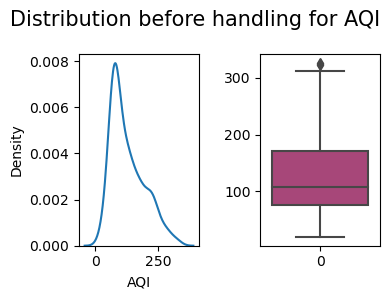

(362, 16)
362
362
(362, 16)
0       79.0
1       81.0
2       87.0
3       76.0
4      110.0
       ...  
357     94.0
358     89.0
359     65.0
360     44.0
361     64.0
Name: AQI, Length: 362, dtype: float64


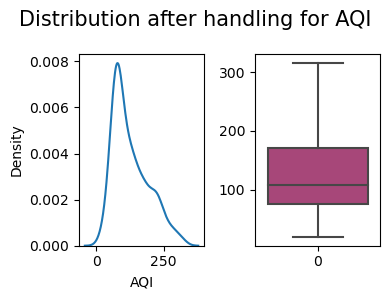

NEW LOCATION - 27
0       9.3228
1       7.7418
2       4.3860
3       5.5080
4       5.9160
        ...   
339    10.0065
340    10.8990
341    16.3800
342    24.7800
343    13.8810
Name: PM2.5, Length: 344, dtype: float64


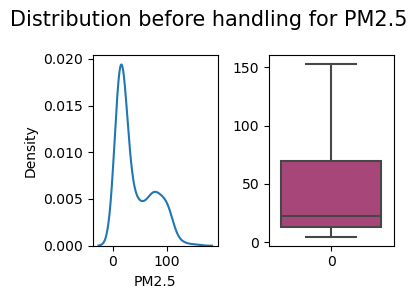

(344, 16)
344
344
(344, 16)
0       9.3228
1       7.7418
2       4.3860
3       5.5080
4       5.9160
        ...   
339    10.0065
340    10.8990
341    16.3800
342    24.7800
343    13.8810
Name: PM2.5, Length: 344, dtype: float64


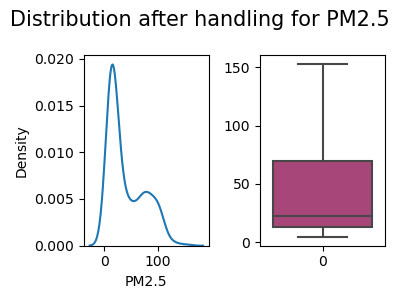

0      34.2516
1      31.8342
2      18.8700
3      28.4478
4      37.2096
        ...   
339    24.4335
340    27.5310
341    28.5075
342    34.0515
343    20.2965
Name: PM10, Length: 344, dtype: float64


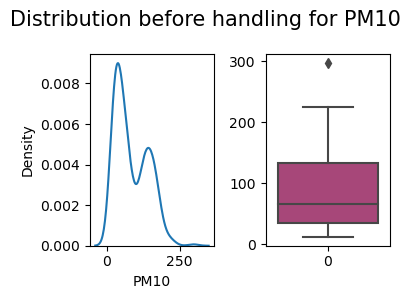

(344, 16)
344
344
(344, 16)
0      34.2516
1      31.8342
2      18.8700
3      28.4478
4      37.2096
        ...   
339    24.4335
340    27.5310
341    28.5075
342    34.0515
343    20.2965
Name: PM10, Length: 344, dtype: float64


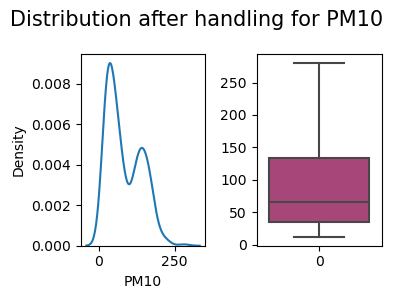

0      0.35700
1      0.23460
2      0.18360
3      0.03060
4      0.15300
        ...   
339    0.44100
340    0.42525
341    0.51450
342    0.60900
343    0.45150
Name: CO, Length: 344, dtype: float64


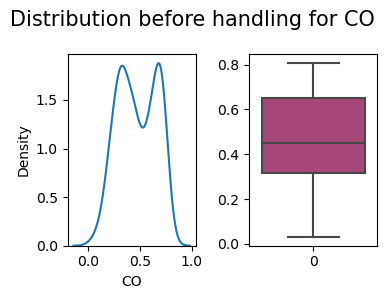

(344, 16)
344
344
(344, 16)
0      0.35700
1      0.23460
2      0.18360
3      0.03060
4      0.15300
        ...   
339    0.44100
340    0.42525
341    0.51450
342    0.60900
343    0.45150
Name: CO, Length: 344, dtype: float64


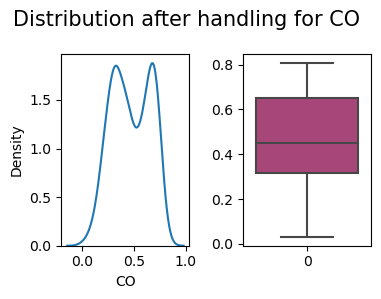

0      10.10820
1       9.64920
2       9.66960
3       9.71040
4       9.71040
         ...   
339     6.34200
340     7.00875
341     4.34700
342     4.77750
343     3.27600
Name: SO2, Length: 344, dtype: float64


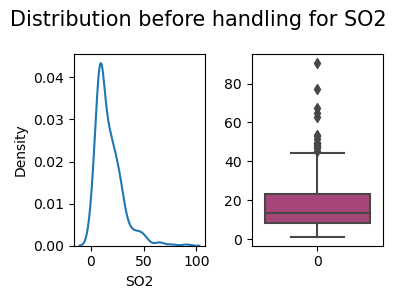

(344, 16)
344
344
(344, 16)
0      10.10820
1       9.64920
2       9.66960
3       9.71040
4       9.71040
         ...   
339     6.34200
340     7.00875
341     4.34700
342     4.77750
343     3.27600
Name: SO2, Length: 344, dtype: float64


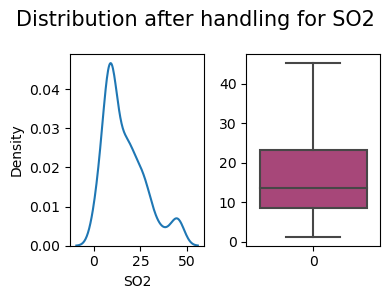

0      31.24260
1      26.62200
2      26.85660
3      30.44700
4      39.97380
         ...   
339    38.49300
340    37.43775
341    43.75350
342    42.29400
343    36.57150
Name: O3, Length: 344, dtype: float64


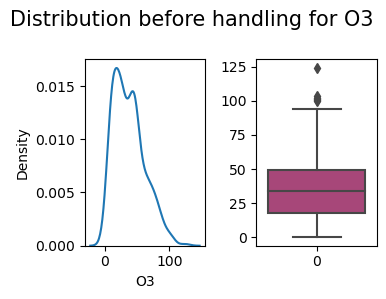

(344, 16)
344
344
(344, 16)
0      31.24260
1      26.62200
2      26.85660
3      30.44700
4      39.97380
         ...   
339    38.49300
340    37.43775
341    43.75350
342    42.29400
343    36.57150
Name: O3, Length: 344, dtype: float64


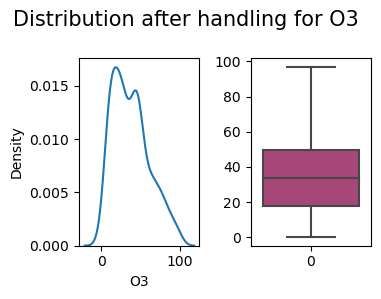

0      57.0
1      40.0
2      34.0
3      34.0
4      50.0
       ... 
339    41.0
340    39.5
341    49.0
342    50.0
343    44.0
Name: AQI, Length: 344, dtype: float64


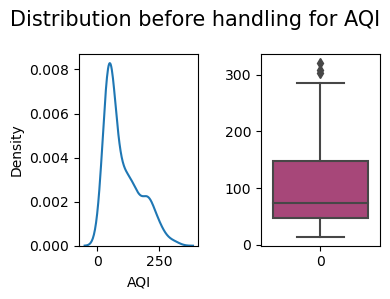

(344, 16)
344
344
(344, 16)
0      57.0
1      40.0
2      34.0
3      34.0
4      50.0
       ... 
339    41.0
340    39.5
341    49.0
342    50.0
343    44.0
Name: AQI, Length: 344, dtype: float64


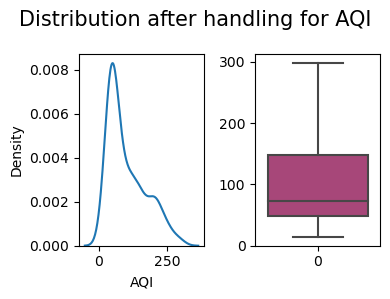

NEW LOCATION - 28
0      17.9724
1      19.2780
2      20.9814
3      23.9496
4      22.4706
        ...   
357     6.7830
358    12.0120
359    22.9320
360    24.8220
361    11.0040
Name: PM2.5, Length: 362, dtype: float64


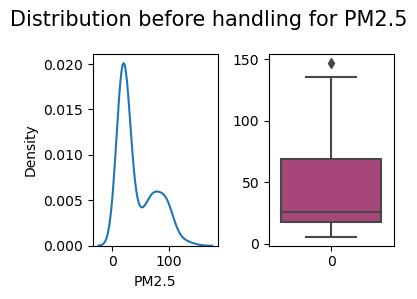

(362, 16)
362
362
(362, 16)
0      17.9724
1      19.2780
2      20.9814
3      23.9496
4      22.4706
        ...   
357     6.7830
358    12.0120
359    22.9320
360    24.8220
361    11.0040
Name: PM2.5, Length: 362, dtype: float64


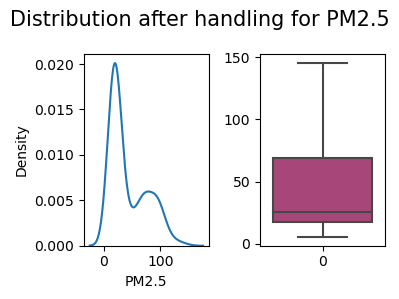

0      134.07900
1      137.84280
2      156.58020
3      134.65020
4       73.75620
         ...    
357     64.03950
358     96.21675
359     84.10500
360     61.83450
361     10.93050
Name: PM10, Length: 362, dtype: float64


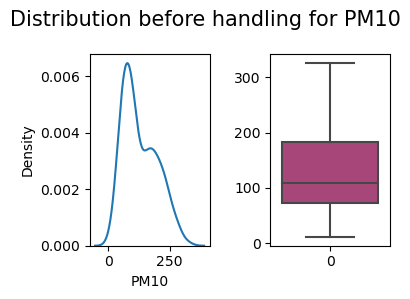

(362, 16)
362
362
(362, 16)
0      134.07900
1      137.84280
2      156.58020
3      134.65020
4       73.75620
         ...    
357     64.03950
358     96.21675
359     84.10500
360     61.83450
361     10.93050
Name: PM10, Length: 362, dtype: float64


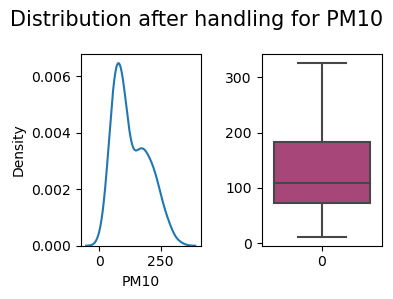

0      0.1632
1      0.2142
2      0.2958
3      0.3978
4      0.4080
        ...  
357    0.2100
358    0.1785
359    0.2415
360    0.4620
361    0.2100
Name: CO, Length: 362, dtype: float64


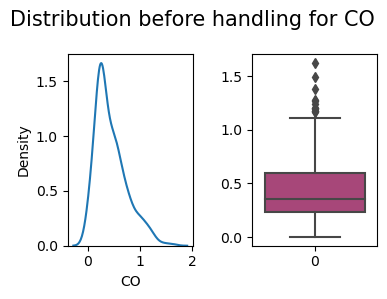

(362, 16)
362
362
(362, 16)
0      0.1632
1      0.2142
2      0.2958
3      0.3978
4      0.4080
        ...  
357    0.2100
358    0.1785
359    0.2415
360    0.4620
361    0.2100
Name: CO, Length: 362, dtype: float64


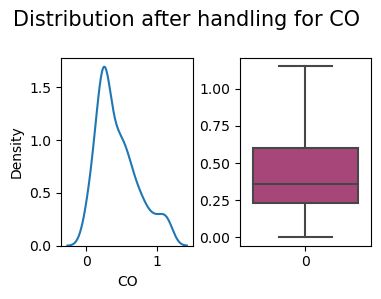

0      18.71700
1       6.87480
2       7.24200
3       6.34440
4       9.08820
         ...   
357     6.48900
358     4.05825
359    10.96200
360    12.77850
361    20.37000
Name: SO2, Length: 362, dtype: float64


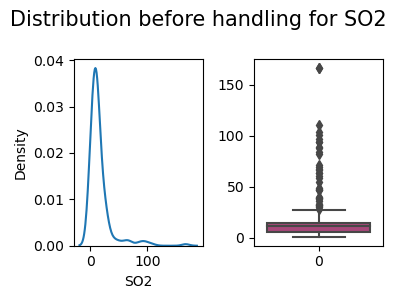

(362, 16)
362
362
(362, 16)
0      18.71700
1       6.87480
2       7.24200
3       6.34440
4       9.08820
         ...   
357     6.48900
358     4.05825
359    10.96200
360    12.77850
361    20.37000
Name: SO2, Length: 362, dtype: float64


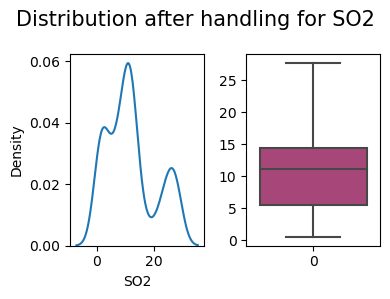

0       7.39500
1       6.38520
2       5.48760
3       9.53700
4      23.53140
         ...   
357    11.27700
358    10.04325
359     8.43150
360    26.63850
361    20.31750
Name: O3, Length: 362, dtype: float64


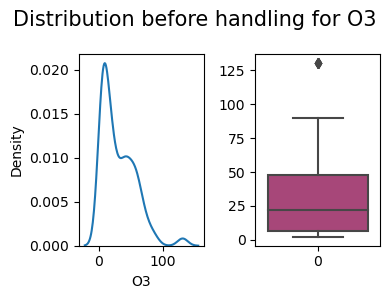

(362, 16)
362
362
(362, 16)
0       7.39500
1       6.38520
2       5.48760
3       9.53700
4      23.53140
         ...   
357    11.27700
358    10.04325
359     8.43150
360    26.63850
361    20.31750
Name: O3, Length: 362, dtype: float64


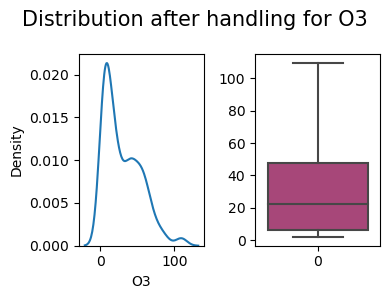

0      119.0
1      122.0
2      138.0
3      125.0
4      143.0
       ...  
357     77.0
358     90.0
359     70.0
360     44.0
361     39.0
Name: AQI, Length: 362, dtype: float64


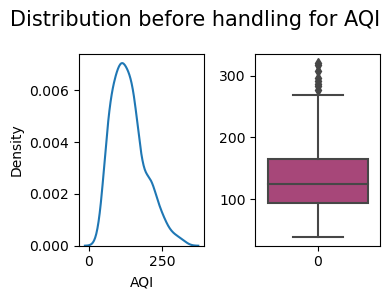

(362, 16)
362
362
(362, 16)
0      119.0
1      122.0
2      138.0
3      125.0
4      143.0
       ...  
357     77.0
358     90.0
359     70.0
360     44.0
361     39.0
Name: AQI, Length: 362, dtype: float64


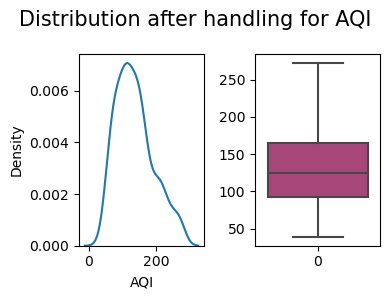

NEW LOCATION - 29
0      30.42660
1      15.49380
2      15.19800
3      16.37100
4      17.00340
         ...   
359     4.84050
360     7.05075
361    18.97350
362    28.65450
363     9.96450
Name: PM2.5, Length: 364, dtype: float64


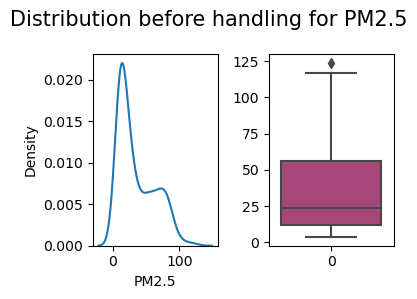

(364, 16)
364
364
(364, 16)
0      30.42660
1      15.49380
2      15.19800
3      16.37100
4      17.00340
         ...   
359     4.84050
360     7.05075
361    18.97350
362    28.65450
363     9.96450
Name: PM2.5, Length: 364, dtype: float64


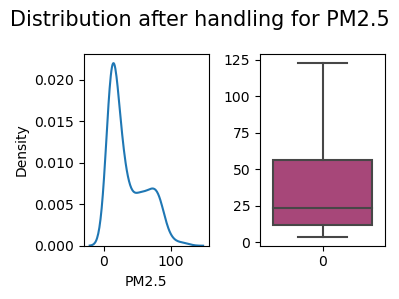

0      73.2768
1      56.2836
2      55.6614
3      66.7080
4      72.1650
        ...   
359    30.4500
360    20.0760
361    39.2280
362    42.7035
363    19.6770
Name: PM10, Length: 364, dtype: float64


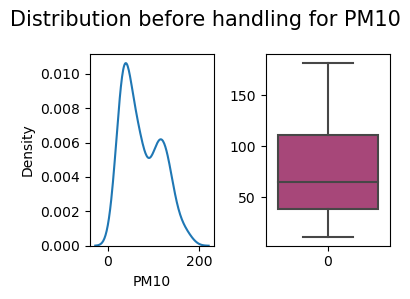

(364, 16)
364
364
(364, 16)
0      73.2768
1      56.2836
2      55.6614
3      66.7080
4      72.1650
        ...   
359    30.4500
360    20.0760
361    39.2280
362    42.7035
363    19.6770
Name: PM10, Length: 364, dtype: float64


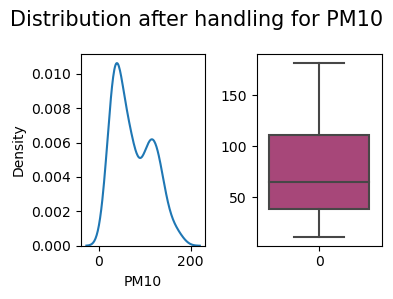

0      0.3060
1      0.3366
2      0.2856
3      0.2652
4      0.2448
        ...  
359    0.2730
360    0.2625
361    0.3045
362    0.5250
363    0.3255
Name: CO, Length: 364, dtype: float64


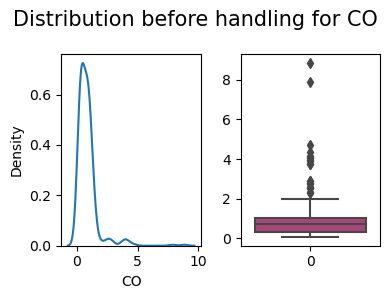

(364, 16)
364
364
(364, 16)
0      0.3060
1      0.3366
2      0.2856
3      0.2652
4      0.2448
        ...  
359    0.2730
360    0.2625
361    0.3045
362    0.5250
363    0.3255
Name: CO, Length: 364, dtype: float64


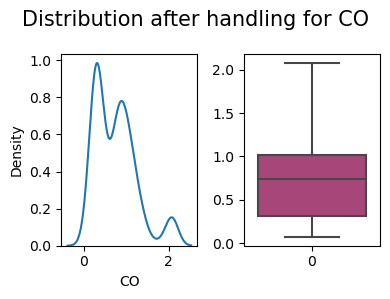

0      13.65780
1      10.78140
2      12.79080
3      13.63740
4      14.30040
         ...   
359     4.43100
360     4.13175
361     4.11600
362     3.91650
363     4.33650
Name: SO2, Length: 364, dtype: float64


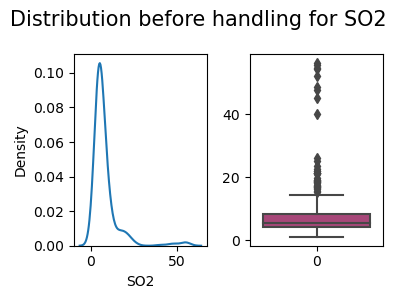

(364, 16)
364
364
(364, 16)
0      13.65780
1      10.78140
2      12.79080
3      13.63740
4      14.30040
         ...   
359     4.43100
360     4.13175
361     4.11600
362     3.91650
363     4.33650
Name: SO2, Length: 364, dtype: float64


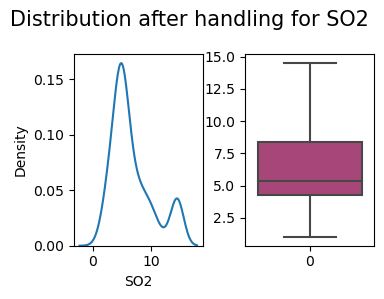

0       6.60960
1       9.86340
2       9.41460
3      11.38320
4       9.63900
         ...   
359    12.25350
360    10.85175
361    11.34000
362    24.75900
363    12.07500
Name: O3, Length: 364, dtype: float64


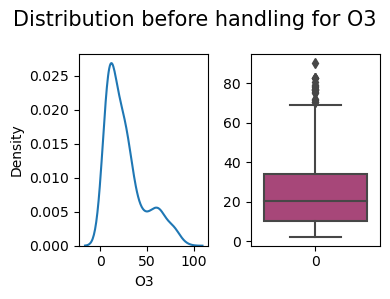

(364, 16)
364
364
(364, 16)
0       6.60960
1       9.86340
2       9.41460
3      11.38320
4       9.63900
         ...   
359    12.25350
360    10.85175
361    11.34000
362    24.75900
363    12.07500
Name: O3, Length: 364, dtype: float64


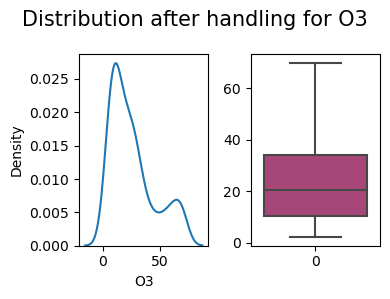

0      78.0
1      76.0
2      54.0
3      61.0
4      72.0
       ... 
359    19.0
360    17.0
361    21.0
362    43.0
363    36.0
Name: AQI, Length: 364, dtype: float64


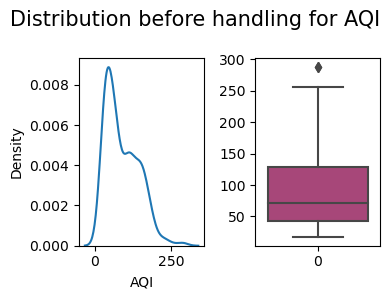

(364, 16)
364
364
(364, 16)
0      78.0
1      76.0
2      54.0
3      61.0
4      72.0
       ... 
359    19.0
360    17.0
361    21.0
362    43.0
363    36.0
Name: AQI, Length: 364, dtype: float64


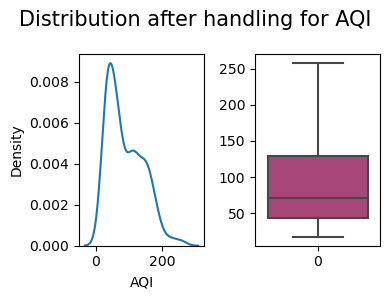

NEW LOCATION - 30
0      22.19520
1      23.54160
2      24.26580
3      25.87740
4      21.51180
         ...   
343     7.05600
344     8.09025
345    13.11450
346    18.29100
347     6.21600
Name: PM2.5, Length: 348, dtype: float64


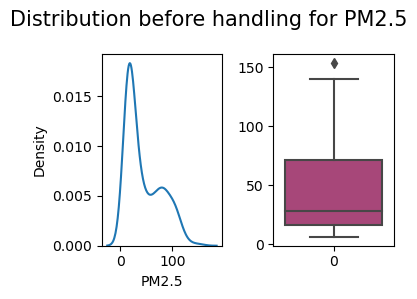

(348, 16)
348
348
(348, 16)
0      22.19520
1      23.54160
2      24.26580
3      25.87740
4      21.51180
         ...   
343     7.05600
344     8.09025
345    13.11450
346    18.29100
347     6.21600
Name: PM2.5, Length: 348, dtype: float64


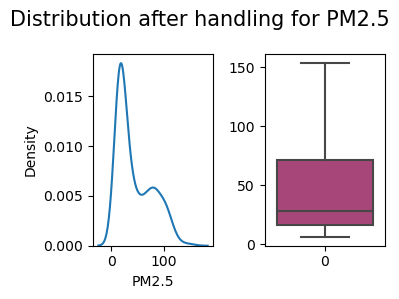

0      91.6572
1      87.0672
2      91.1982
3      82.4160
4      55.2636
        ...   
343    27.3000
344    36.5400
345    50.8200
346    61.2885
347    20.2440
Name: PM10, Length: 348, dtype: float64


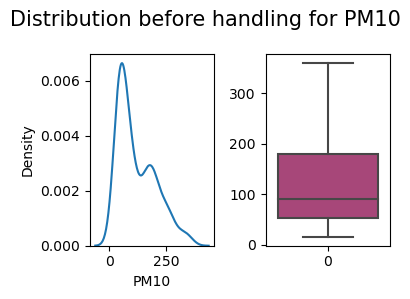

(348, 16)
348
348
(348, 16)
0      91.6572
1      87.0672
2      91.1982
3      82.4160
4      55.2636
        ...   
343    27.3000
344    36.5400
345    50.8200
346    61.2885
347    20.2440
Name: PM10, Length: 348, dtype: float64


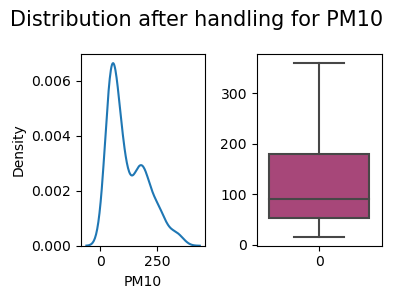

0      0.20400
1      0.13260
2      0.12240
3      0.21420
4      0.17340
        ...   
343    0.02100
344    0.01575
345    0.13650
346    0.32550
347    0.09450
Name: CO, Length: 348, dtype: float64


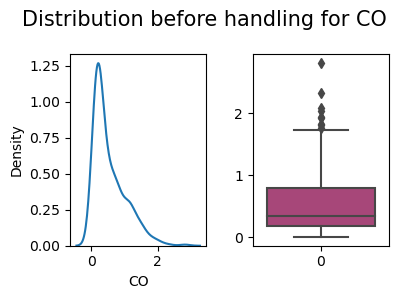

(348, 16)
348
348
(348, 16)
0      0.20400
1      0.13260
2      0.12240
3      0.21420
4      0.17340
        ...   
343    0.02100
344    0.01575
345    0.13650
346    0.32550
347    0.09450
Name: CO, Length: 348, dtype: float64


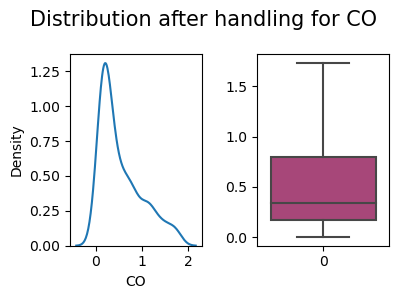

0      12.78060
1      12.54600
2      12.55620
3      12.68880
4      12.63780
         ...   
343    15.20400
344    15.25125
345    15.36150
346    15.46650
347    15.46650
Name: SO2, Length: 348, dtype: float64


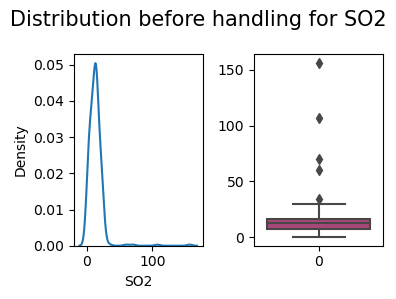

(348, 16)
348
348
(348, 16)
0      12.78060
1      12.54600
2      12.55620
3      12.68880
4      12.63780
         ...   
343    15.20400
344    15.25125
345    15.36150
346    15.46650
347    15.46650
Name: SO2, Length: 348, dtype: float64


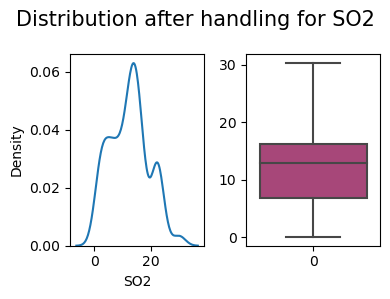

0      12.11760
1      16.08540
2      17.02380
3      11.92380
4      18.80880
         ...   
343    24.48600
344    20.28075
345    26.98500
346    31.95150
347    31.45800
Name: O3, Length: 348, dtype: float64


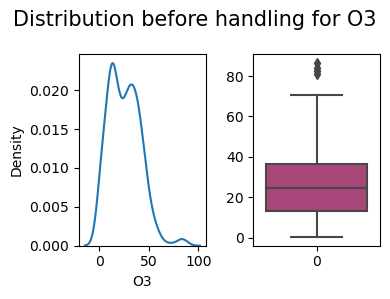

(348, 16)
348
348
(348, 16)
0      12.11760
1      16.08540
2      17.02380
3      11.92380
4      18.80880
         ...   
343    24.48600
344    20.28075
345    26.98500
346    31.95150
347    31.45800
Name: O3, Length: 348, dtype: float64


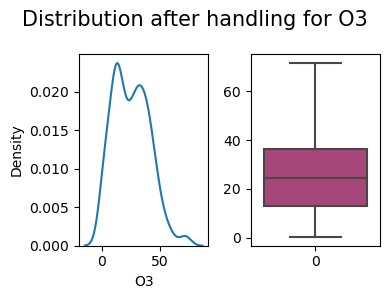

0      91.0
1      87.0
2      90.0
3      89.0
4      68.0
       ... 
343    37.0
344    32.5
345    44.0
346    59.0
347    59.0
Name: AQI, Length: 348, dtype: float64


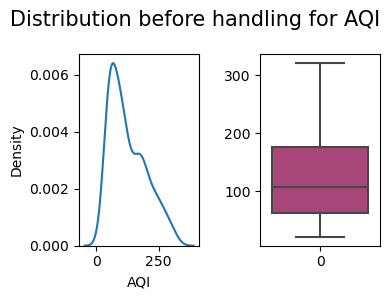

(348, 16)
348
348
(348, 16)
0      91.0
1      87.0
2      90.0
3      89.0
4      68.0
       ... 
343    37.0
344    32.5
345    44.0
346    59.0
347    59.0
Name: AQI, Length: 348, dtype: float64


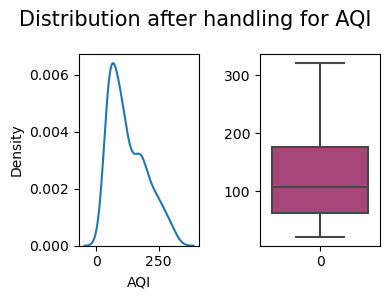

NEW LOCATION - 31
0      13.1784
1      11.6586
2       9.7716
3       9.4860
4      11.0262
        ...   
360     2.8245
361     3.0030
362    18.0705
363    18.9210
364     6.7620
Name: PM2.5, Length: 365, dtype: float64


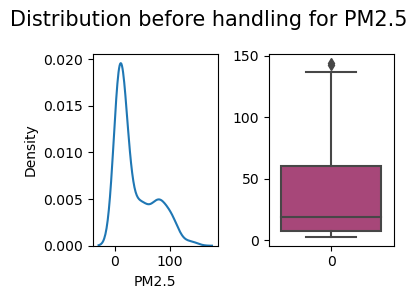

(365, 16)
365
365
(365, 16)
0      13.1784
1      11.6586
2       9.7716
3       9.4860
4      11.0262
        ...   
360     2.8245
361     3.0030
362    18.0705
363    18.9210
364     6.7620
Name: PM2.5, Length: 365, dtype: float64


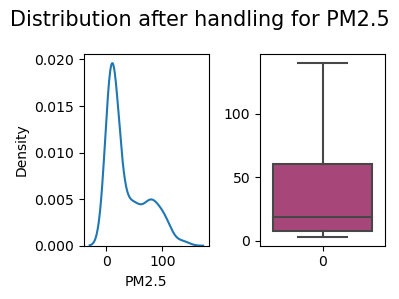

0      39.19860
1      43.70700
2      39.86160
3      40.31040
4      56.46720
         ...   
360    22.18650
361    38.97075
362    25.20000
363    49.52850
364    15.35100
Name: PM10, Length: 365, dtype: float64


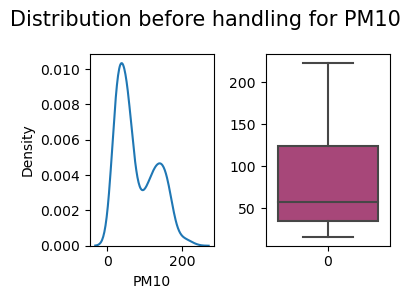

(365, 16)
365
365
(365, 16)
0      39.19860
1      43.70700
2      39.86160
3      40.31040
4      56.46720
         ...   
360    22.18650
361    38.97075
362    25.20000
363    49.52850
364    15.35100
Name: PM10, Length: 365, dtype: float64


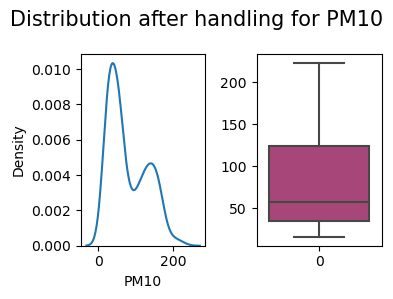

0      0.20400
1      0.22440
2      0.17340
3      0.26520
4      0.26520
        ...   
360    0.11550
361    0.12075
362    0.25200
363    0.46200
364    0.35700
Name: CO, Length: 365, dtype: float64


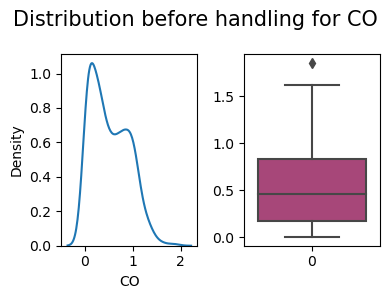

(365, 16)
365
365
(365, 16)
0      0.20400
1      0.22440
2      0.17340
3      0.26520
4      0.26520
        ...   
360    0.11550
361    0.12075
362    0.25200
363    0.46200
364    0.35700
Name: CO, Length: 365, dtype: float64


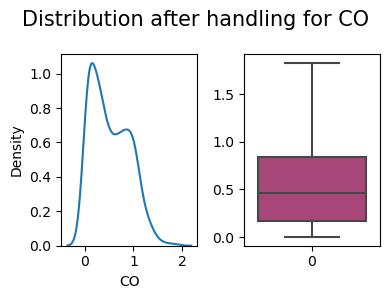

0      3.8862
1      4.1106
2      4.1106
3      4.4676
4      4.1514
        ...  
360    7.0245
361    7.0245
362    7.0245
363    7.0245
364    7.0245
Name: SO2, Length: 365, dtype: float64


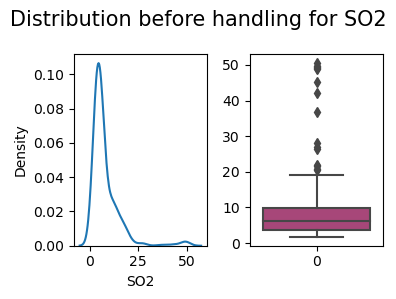

(365, 16)
365
365
(365, 16)
0      3.8862
1      4.1106
2      4.1106
3      4.4676
4      4.1514
        ...  
360    7.0245
361    7.0245
362    7.0245
363    7.0245
364    7.0245
Name: SO2, Length: 365, dtype: float64


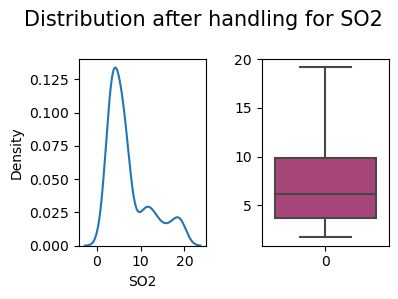

0      32.54820
1      29.89620
2      40.53480
3      42.72780
4      44.48220
         ...   
360     8.68350
361     8.59425
362     8.40000
363     8.67300
364     8.62050
Name: O3, Length: 365, dtype: float64


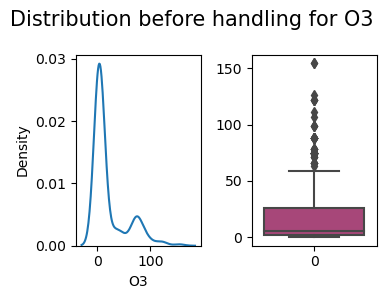

(365, 16)
365
365
(365, 16)
0      32.54820
1      29.89620
2      40.53480
3      42.72780
4      44.48220
         ...   
360     8.68350
361     8.59425
362     8.40000
363     8.67300
364     8.62050
Name: O3, Length: 365, dtype: float64


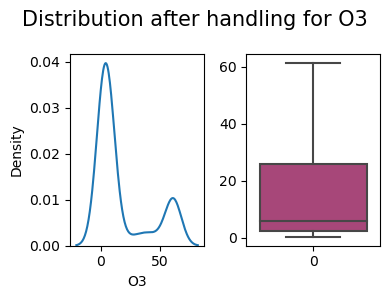

0      42.0
1      42.0
2      49.0
3      55.0
4      63.0
       ... 
360    67.0
361    69.5
362    76.0
363    92.0
364    99.0
Name: AQI, Length: 365, dtype: float64


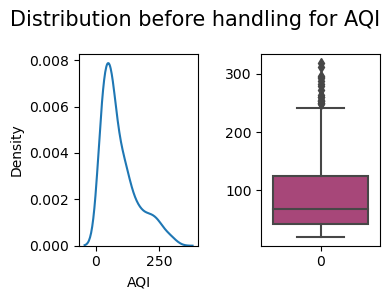

(365, 16)
365
365
(365, 16)
0      42.0
1      42.0
2      49.0
3      55.0
4      63.0
       ... 
360    67.0
361    69.5
362    76.0
363    92.0
364    99.0
Name: AQI, Length: 365, dtype: float64


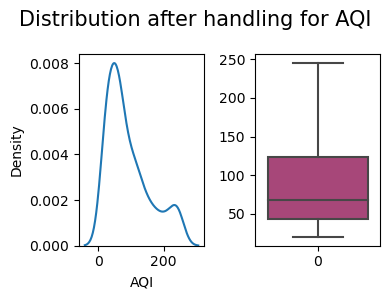

NEW LOCATION - 32
0      14.9124
1      12.1176
2      12.0156
3       9.3636
4      14.3208
        ...   
360     4.3470
361     6.0795
362    22.6590
363    21.7245
364     9.5130
Name: PM2.5, Length: 365, dtype: float64


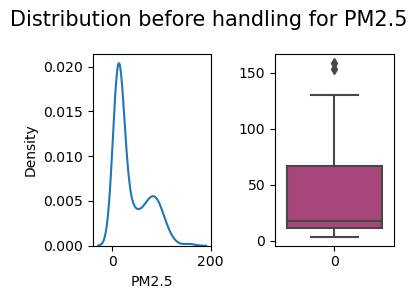

(365, 16)
365
365
(365, 16)
0      14.9124
1      12.1176
2      12.0156
3       9.3636
4      14.3208
        ...   
360     4.3470
361     6.0795
362    22.6590
363    21.7245
364     9.5130
Name: PM2.5, Length: 365, dtype: float64


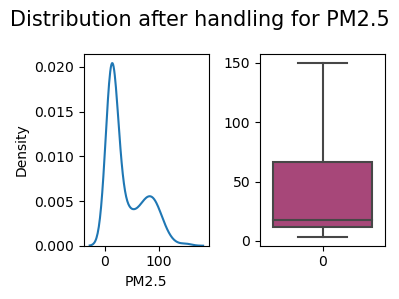

0      57.93600
1      52.17300
2      68.94180
3      56.06940
4      74.72520
         ...   
360    33.42150
361    42.29925
362    58.26450
363    47.49150
364    17.34600
Name: PM10, Length: 365, dtype: float64


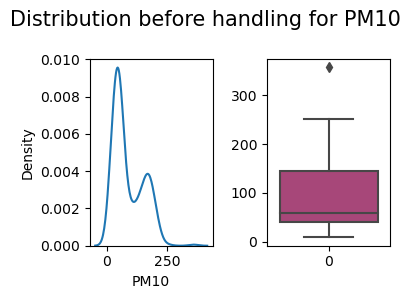

(365, 16)
365
365
(365, 16)
0      57.93600
1      52.17300
2      68.94180
3      56.06940
4      74.72520
         ...   
360    33.42150
361    42.29925
362    58.26450
363    47.49150
364    17.34600
Name: PM10, Length: 365, dtype: float64


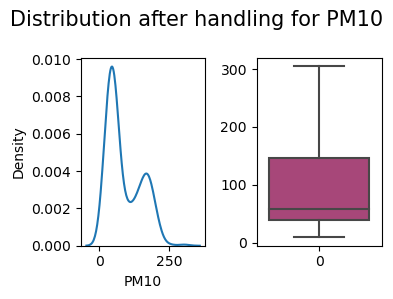

0      0.5610
1      0.4794
2      0.4386
3      0.4386
4      0.4590
        ...  
360    0.2520
361    0.2415
362    0.3780
363    0.4725
364    0.3255
Name: CO, Length: 365, dtype: float64


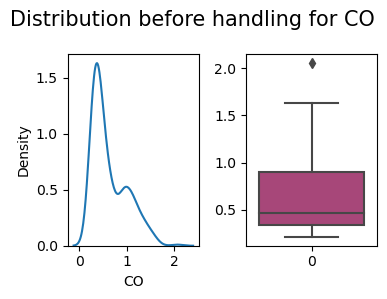

(365, 16)
365
365
(365, 16)
0      0.5610
1      0.4794
2      0.4386
3      0.4386
4      0.4590
        ...  
360    0.2520
361    0.2415
362    0.3780
363    0.4725
364    0.3255
Name: CO, Length: 365, dtype: float64


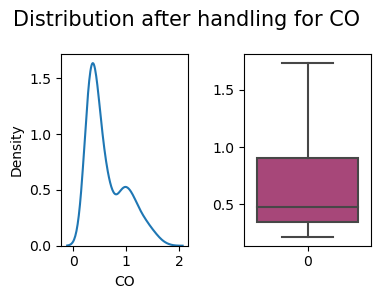

0       1.3872
1       1.2750
2       1.3260
3       1.3974
4       1.4994
        ...   
360    13.3140
361    12.3375
362    13.3980
363    11.9490
364    10.9830
Name: SO2, Length: 365, dtype: float64


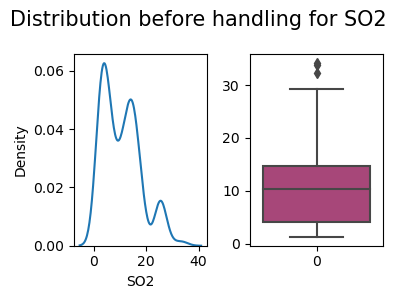

(365, 16)
365
365
(365, 16)
0       1.3872
1       1.2750
2       1.3260
3       1.3974
4       1.4994
        ...   
360    13.3140
361    12.3375
362    13.3980
363    11.9490
364    10.9830
Name: SO2, Length: 365, dtype: float64


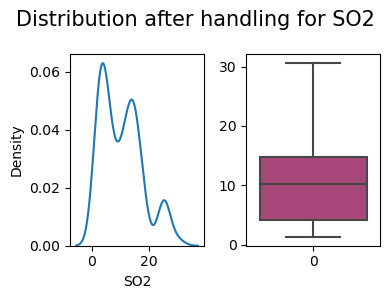

0       6.96660
1       7.12980
2       8.17020
3       9.37380
4       8.68020
         ...   
360    15.89700
361    12.46875
362    24.66450
363    23.01600
364    20.71650
Name: O3, Length: 365, dtype: float64


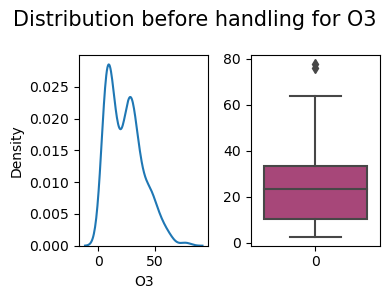

(365, 16)
365
365
(365, 16)
0       6.96660
1       7.12980
2       8.17020
3       9.37380
4       8.68020
         ...   
360    15.89700
361    12.46875
362    24.66450
363    23.01600
364    20.71650
Name: O3, Length: 365, dtype: float64


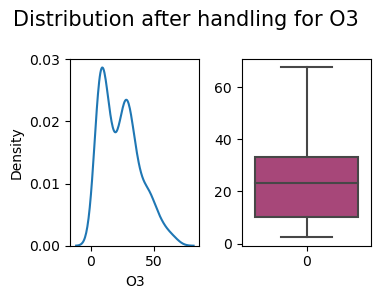

0      55.0
1      58.0
2      56.0
3      64.0
4      64.0
       ... 
360    40.0
361    39.5
362    48.0
363    56.0
364    39.0
Name: AQI, Length: 365, dtype: float64


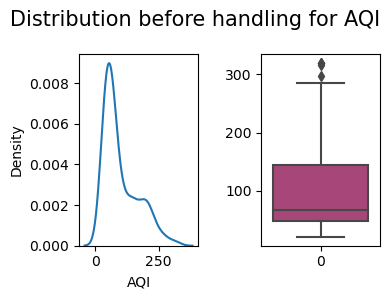

(365, 16)
365
365
(365, 16)
0      55.0
1      58.0
2      56.0
3      64.0
4      64.0
       ... 
360    40.0
361    39.5
362    48.0
363    56.0
364    39.0
Name: AQI, Length: 365, dtype: float64


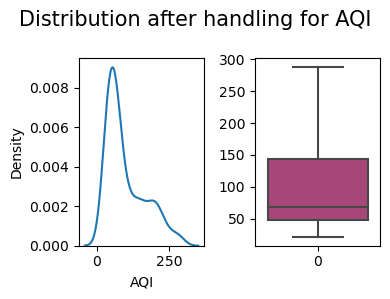

NEW LOCATION - 33
0      14.37180
1      12.60720
2      15.74880
3      13.38240
4      11.96460
         ...   
352     7.74900
353    10.14825
354    15.61350
355    23.64600
356     9.20850
Name: PM2.5, Length: 357, dtype: float64


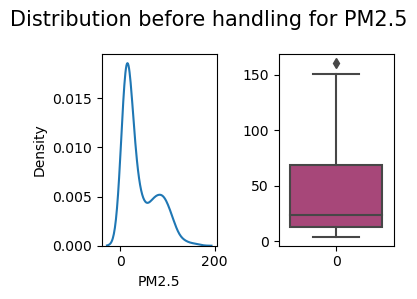

(357, 16)
357
357
(357, 16)
0      14.37180
1      12.60720
2      15.74880
3      13.38240
4      11.96460
         ...   
352     7.74900
353    10.14825
354    15.61350
355    23.64600
356     9.20850
Name: PM2.5, Length: 357, dtype: float64


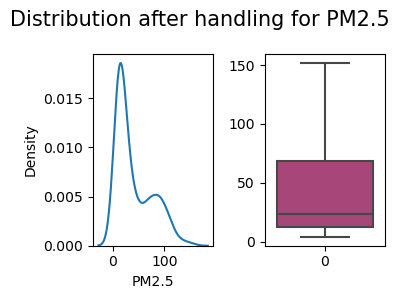

0      47.1138
1      56.7222
2      70.2678
3      62.0262
4      65.4330
        ...   
352    40.6245
353    41.4540
354    40.4880
355    48.9930
356    21.7455
Name: PM10, Length: 357, dtype: float64


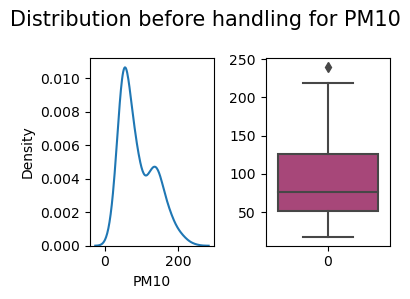

(357, 16)
357
357
(357, 16)
0      47.1138
1      56.7222
2      70.2678
3      62.0262
4      65.4330
        ...   
352    40.6245
353    41.4540
354    40.4880
355    48.9930
356    21.7455
Name: PM10, Length: 357, dtype: float64


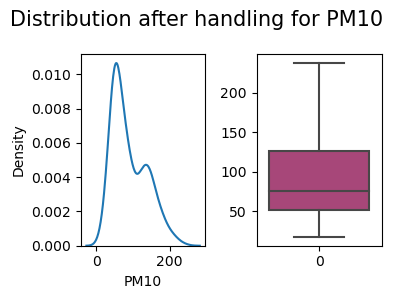

0      0.28560
1      0.29580
2      0.08160
3      0.04080
4      0.02040
        ...   
352    0.18900
353    0.19425
354    0.30450
355    0.57750
356    0.30450
Name: CO, Length: 357, dtype: float64


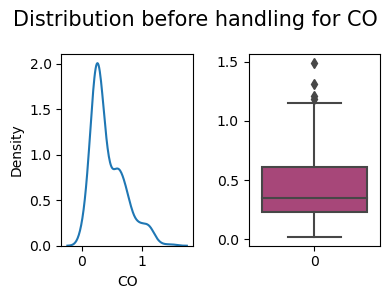

(357, 16)
357
357
(357, 16)
0      0.28560
1      0.29580
2      0.08160
3      0.04080
4      0.02040
        ...   
352    0.18900
353    0.19425
354    0.30450
355    0.57750
356    0.30450
Name: CO, Length: 357, dtype: float64


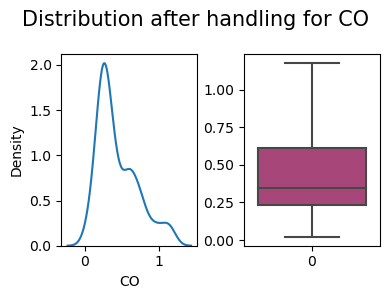

0      6.8340
1      2.0094
2      2.1828
3      3.6006
4      1.8972
        ...  
352    4.2630
353    4.2735
354    4.2735
355    4.7460
356    4.8090
Name: SO2, Length: 357, dtype: float64


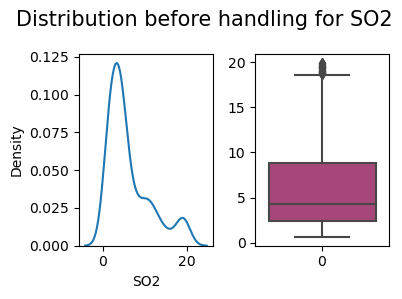

(357, 16)
357
357
(357, 16)
0      6.8340
1      2.0094
2      2.1828
3      3.6006
4      1.8972
        ...  
352    4.2630
353    4.2735
354    4.2735
355    4.7460
356    4.8090
Name: SO2, Length: 357, dtype: float64


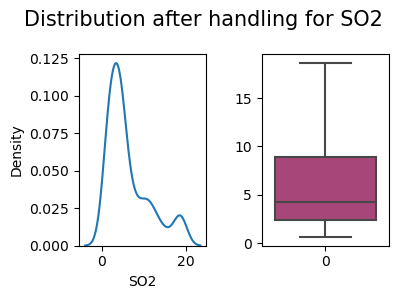

0      20.3898
1      20.8182
2      11.0568
3       9.9450
4       9.7920
        ...   
352    24.2655
353    21.1890
354    24.2340
355    42.1050
356    40.0470
Name: O3, Length: 357, dtype: float64


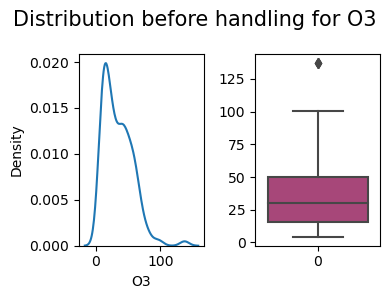

(357, 16)
357
357
(357, 16)
0      20.3898
1      20.8182
2      11.0568
3       9.9450
4       9.7920
        ...   
352    24.2655
353    21.1890
354    24.2340
355    42.1050
356    40.0470
Name: O3, Length: 357, dtype: float64


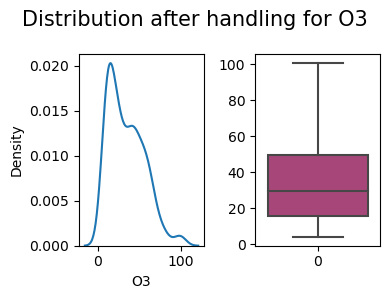

0      61.0
1      70.0
2      68.0
3      60.0
4      67.0
       ... 
352    49.0
353    40.0
354    42.0
355    49.0
356    47.0
Name: AQI, Length: 357, dtype: float64


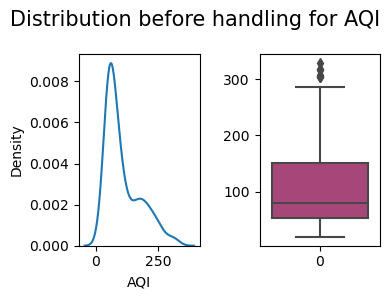

(357, 16)
357
357
(357, 16)
0      61.0
1      70.0
2      68.0
3      60.0
4      67.0
       ... 
352    49.0
353    40.0
354    42.0
355    49.0
356    47.0
Name: AQI, Length: 357, dtype: float64


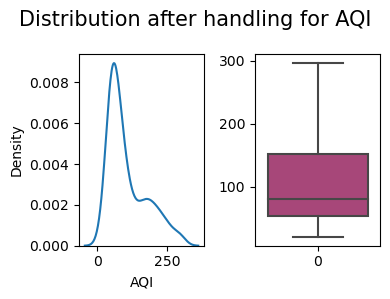

NEW LOCATION - 34
0      23.8578
1      16.7994
2      15.0654
3      15.7284
4      81.0288
        ...   
345    21.4830
346    18.2280
347    16.8735
348     8.9880
349     7.0455
Name: PM2.5, Length: 350, dtype: float64


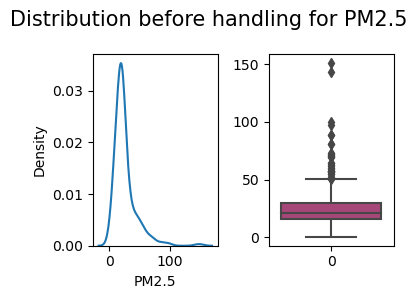

(350, 16)
350
350
(350, 16)
0      23.857800
1      16.799400
2      15.065400
3      15.728400
4      50.214337
         ...    
345    21.483000
346    18.228000
347    16.873500
348     8.988000
349     7.045500
Name: PM2.5, Length: 350, dtype: float64


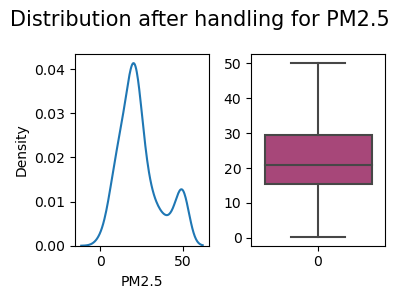

0       49.52100
1       56.87520
2       53.15220
3       39.09660
4       45.70620
         ...    
345    246.18300
346    190.19175
347    364.06650
348     26.79600
349     14.53200
Name: PM10, Length: 350, dtype: float64


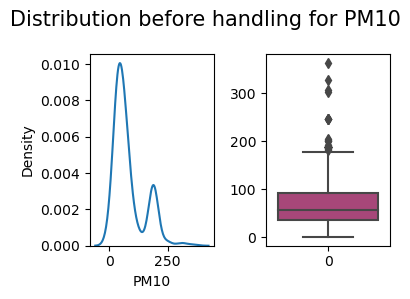

(350, 16)
350
350
(350, 16)
0       49.5210
1       56.8752
2       53.1522
3       39.0966
4       45.7062
         ...   
345    178.7295
346    178.7295
347    178.7295
348     26.7960
349     14.5320
Name: PM10, Length: 350, dtype: float64


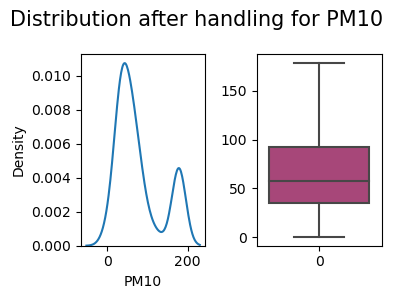

0      0.60180
1      0.62220
2      0.72420
3      0.51000
4      0.44880
        ...   
345    1.16550
346    0.55125
347    1.12350
348    1.06050
349    1.32300
Name: CO, Length: 350, dtype: float64


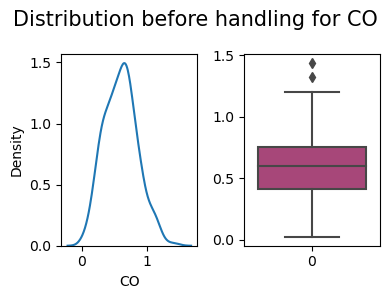

(350, 16)
350
350
(350, 16)
0      0.60180
1      0.62220
2      0.72420
3      0.51000
4      0.44880
        ...   
345    1.16550
346    0.55125
347    1.12350
348    1.06050
349    1.27800
Name: CO, Length: 350, dtype: float64


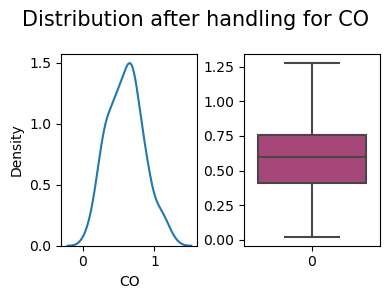

0      9.3534
1      9.4044
2      9.3942
3      8.8536
4      8.1090
        ...  
345    7.7595
346    7.5180
347    7.5915
348    8.2530
349    8.4945
Name: SO2, Length: 350, dtype: float64


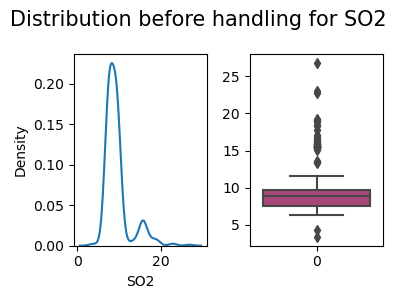

(350, 16)
350
350
(350, 16)
0      9.3534
1      9.4044
2      9.3942
3      8.8536
4      8.1090
        ...  
345    7.7595
346    7.5180
347    7.5915
348    8.2530
349    8.4945
Name: SO2, Length: 350, dtype: float64


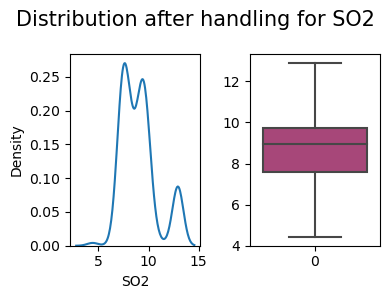

0       58.45620
1       56.91600
2       63.75000
3       25.48980
4       25.48980
         ...    
345     94.00650
346     92.26875
347     92.04300
348    102.14400
349    124.78200
Name: O3, Length: 350, dtype: float64


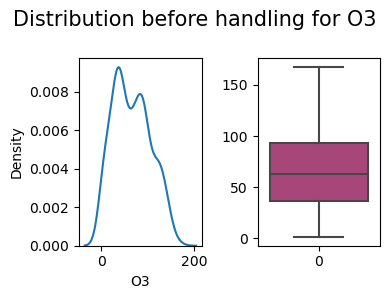

(350, 16)
350
350
(350, 16)
0       58.45620
1       56.91600
2       63.75000
3       25.48980
4       25.48980
         ...    
345     94.00650
346     92.26875
347     92.04300
348    102.14400
349    124.78200
Name: O3, Length: 350, dtype: float64


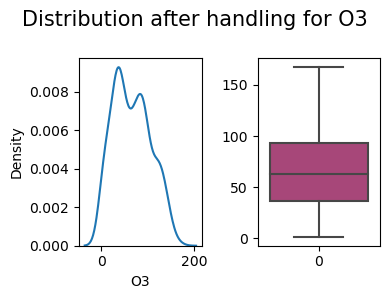

0       59.0
1       73.0
2       80.0
3       55.0
4       55.0
       ...  
345    126.0
346     99.0
347    120.0
348    138.0
349    138.0
Name: AQI, Length: 350, dtype: float64


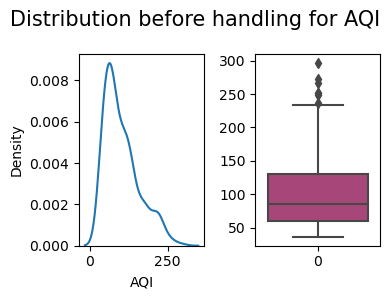

(350, 16)
350
350
(350, 16)
0       59.0
1       73.0
2       80.0
3       55.0
4       55.0
       ...  
345    126.0
346     99.0
347    120.0
348    138.0
349    138.0
Name: AQI, Length: 350, dtype: float64


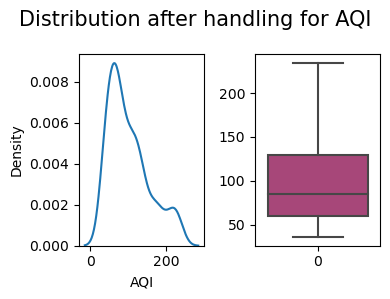

NEW LOCATION - 35
0      22.0014
1      25.7754
2      30.6408
3      25.0308
4      34.5780
        ...   
351    17.4510
352    19.2675
353    13.2090
354    13.2825
355    13.9230
Name: PM2.5, Length: 356, dtype: float64


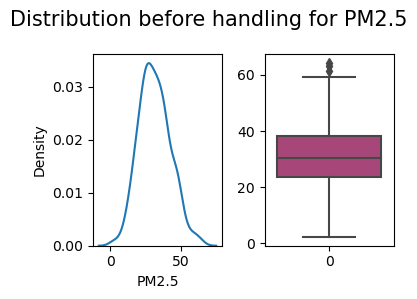

(356, 16)
356
356
(356, 16)
0      22.0014
1      25.7754
2      30.6408
3      25.0308
4      34.5780
        ...   
351    17.4510
352    19.2675
353    13.2090
354    13.2825
355    13.9230
Name: PM2.5, Length: 356, dtype: float64


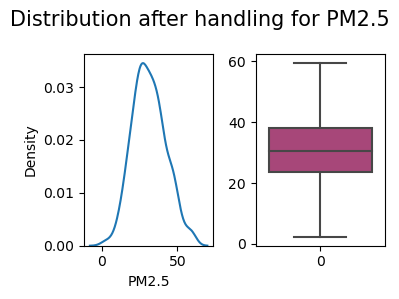

0      27.5910
1      32.7216
2      36.5670
3      32.0382
4      47.0934
        ...   
351    25.5255
352    22.6800
353    19.0155
354    28.2660
355    24.9795
Name: PM10, Length: 356, dtype: float64


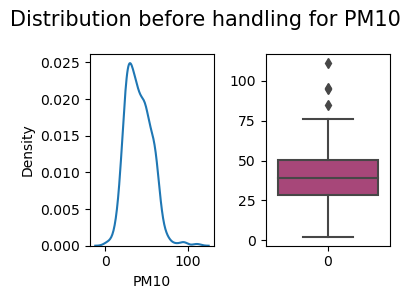

(356, 16)
356
356
(356, 16)
0      27.5910
1      32.7216
2      36.5670
3      32.0382
4      47.0934
        ...   
351    25.5255
352    22.6800
353    19.0155
354    28.2660
355    24.9795
Name: PM10, Length: 356, dtype: float64


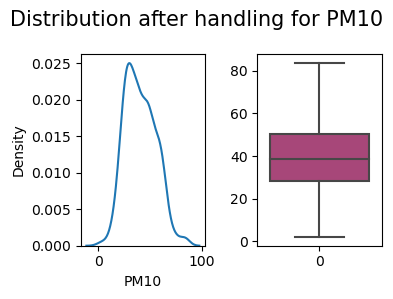

0      1.16280
1      1.20360
2      1.17300
3      1.13220
4      1.22400
        ...   
351    1.01850
352    1.05525
353    1.03950
354    1.03950
355    1.06050
Name: CO, Length: 356, dtype: float64


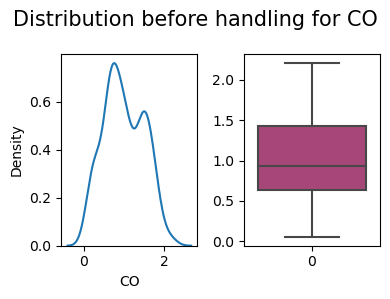

(356, 16)
356
356
(356, 16)
0      1.16280
1      1.20360
2      1.17300
3      1.13220
4      1.22400
        ...   
351    1.01850
352    1.05525
353    1.03950
354    1.03950
355    1.06050
Name: CO, Length: 356, dtype: float64


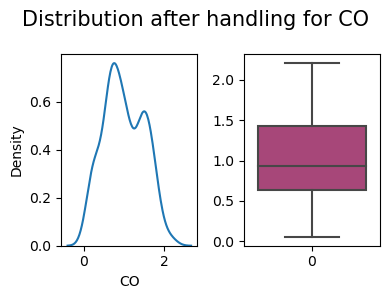

0       9.9450
1      11.1384
2      10.7202
3       9.1800
4      10.4958
        ...   
351     5.9220
352     5.7960
353     5.9010
354     5.6700
355     5.8170
Name: SO2, Length: 356, dtype: float64


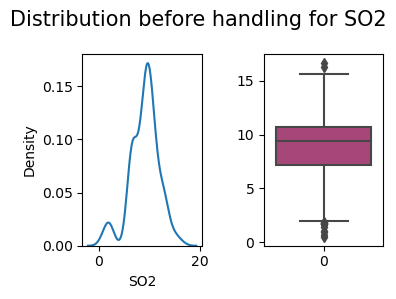

(356, 16)
356
356
(356, 16)
0       9.9450
1      11.1384
2      10.7202
3       9.1800
4      10.4958
        ...   
351     5.9220
352     5.7960
353     5.9010
354     5.6700
355     5.8170
Name: SO2, Length: 356, dtype: float64


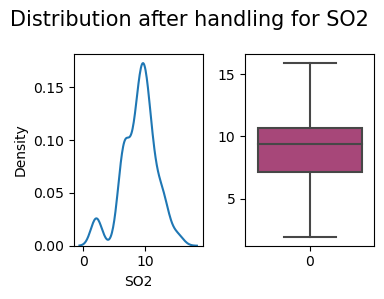

0      25.9692
1      23.9190
2      17.5848
3      23.4192
4      21.8688
        ...   
351    22.1025
352    17.9550
353    21.6090
354    18.4065
355    16.9470
Name: O3, Length: 356, dtype: float64


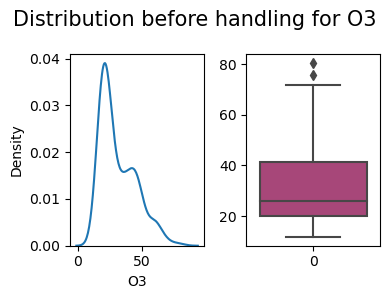

(356, 16)
356
356
(356, 16)
0      25.9692
1      23.9190
2      17.5848
3      23.4192
4      21.8688
        ...   
351    22.1025
352    17.9550
353    21.6090
354    18.4065
355    16.9470
Name: O3, Length: 356, dtype: float64


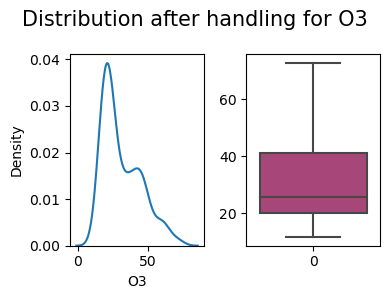

0      66.0
1      67.0
2      61.0
3      63.0
4      65.0
       ... 
351    52.0
352    65.0
353    56.0
354    54.0
355    55.0
Name: AQI, Length: 356, dtype: float64


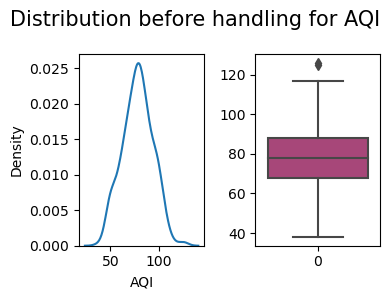

(356, 16)
356
356
(356, 16)
0      66.0
1      67.0
2      61.0
3      63.0
4      65.0
       ... 
351    52.0
352    65.0
353    56.0
354    54.0
355    55.0
Name: AQI, Length: 356, dtype: float64


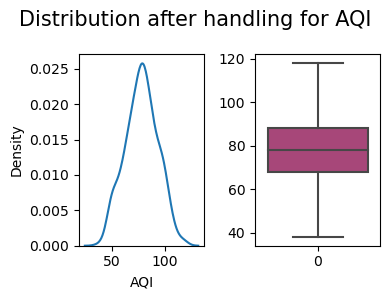

NEW LOCATION - 36
0      35.8938
1      25.0920
2      26.1630
3      26.7648
4      24.7554
        ...   
363    19.7505
364    16.9155
365    16.0335
366    14.3745
367    17.6610
Name: PM2.5, Length: 368, dtype: float64


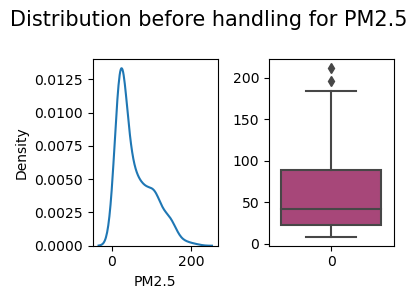

(368, 16)
368
368
(368, 16)
0      35.8938
1      25.0920
2      26.1630
3      26.7648
4      24.7554
        ...   
363    19.7505
364    16.9155
365    16.0335
366    14.3745
367    17.6610
Name: PM2.5, Length: 368, dtype: float64


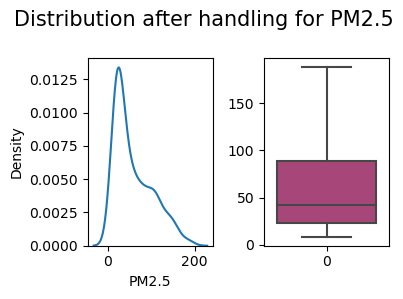

0      54.9270
1      47.4402
2      46.6446
3      47.2566
4      40.5654
        ...   
363    46.2420
364    39.8685
365    43.1970
366    42.5775
367    45.6750
Name: PM10, Length: 368, dtype: float64


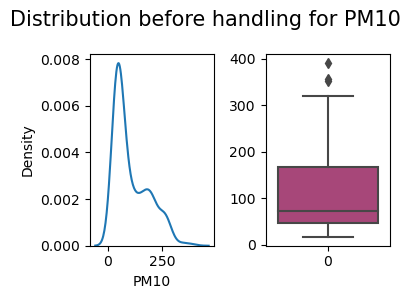

(368, 16)
368
368
(368, 16)
0      54.9270
1      47.4402
2      46.6446
3      47.2566
4      40.5654
        ...   
363    46.2420
364    39.8685
365    43.1970
366    42.5775
367    45.6750
Name: PM10, Length: 368, dtype: float64


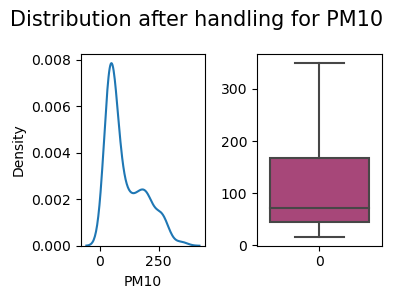

0      0.3162
1      0.2754
2      0.3876
3      0.3060
4      0.3060
        ...  
363    0.3570
364    0.3360
365    0.3045
366    0.3465
367    0.3360
Name: CO, Length: 368, dtype: float64


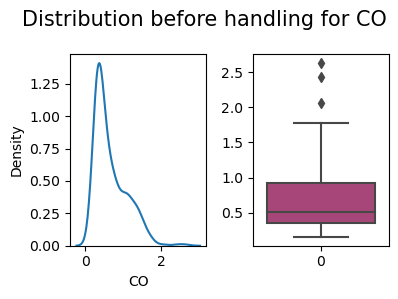

(368, 16)
368
368
(368, 16)
0      0.3162
1      0.2754
2      0.3876
3      0.3060
4      0.3060
        ...  
363    0.3570
364    0.3360
365    0.3045
366    0.3465
367    0.3360
Name: CO, Length: 368, dtype: float64


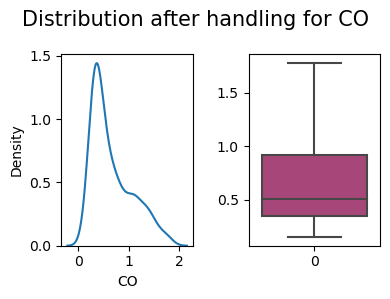

0      1.6320
1      2.7642
2      3.2640
3      3.3048
4      1.5402
        ...  
363    2.6145
364    2.6355
365    2.6565
366    2.7405
367    4.5885
Name: SO2, Length: 368, dtype: float64


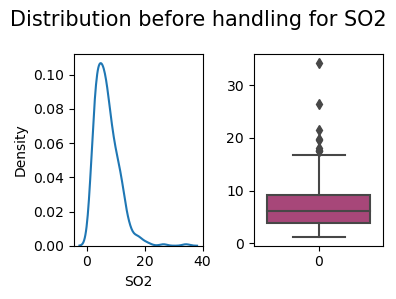

(368, 16)
368
368
(368, 16)
0      1.6320
1      2.7642
2      3.2640
3      3.3048
4      1.5402
        ...  
363    2.6145
364    2.6355
365    2.6565
366    2.7405
367    4.5885
Name: SO2, Length: 368, dtype: float64


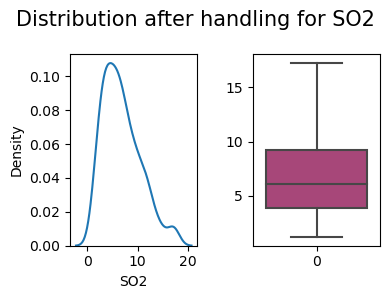

0      25.2042
1      27.0096
2      41.0040
3      26.2956
4      22.9806
        ...   
363     5.6175
364     6.2370
365     4.2735
366     4.7250
367    13.2510
Name: O3, Length: 368, dtype: float64


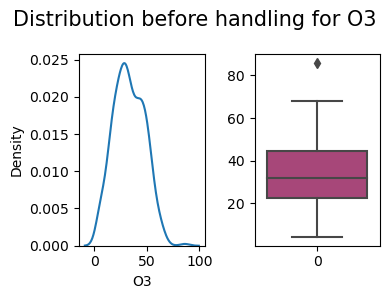

(368, 16)
368
368
(368, 16)
0      25.2042
1      27.0096
2      41.0040
3      26.2956
4      22.9806
        ...   
363     5.6175
364     6.2370
365     4.2735
366     4.7250
367    13.2510
Name: O3, Length: 368, dtype: float64


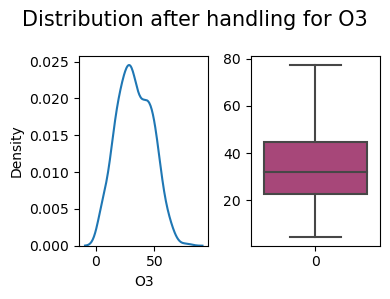

0      55.0
1      59.0
2      62.0
3      50.0
4      44.0
       ... 
363    42.0
364    42.0
365    41.0
366    44.0
367    46.0
Name: AQI, Length: 368, dtype: float64


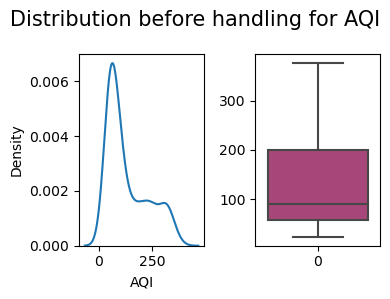

(368, 16)
368
368
(368, 16)
0      55.0
1      59.0
2      62.0
3      50.0
4      44.0
       ... 
363    42.0
364    42.0
365    41.0
366    44.0
367    46.0
Name: AQI, Length: 368, dtype: float64


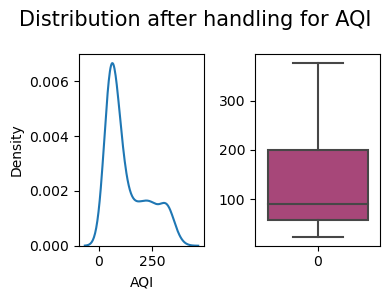

NEW LOCATION - 37
0      24.78600
1      27.44820
2      17.14620
3      17.73780
4      13.98420
         ...   
360    17.58750
361    14.60025
362     9.22950
363    12.15900
364    13.40850
Name: PM2.5, Length: 365, dtype: float64


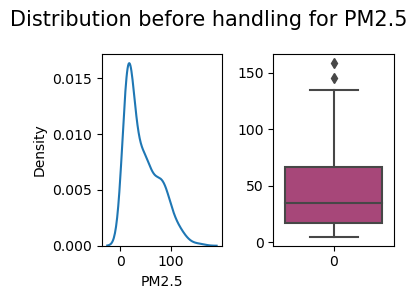

(365, 16)
365
365
(365, 16)
0      24.78600
1      27.44820
2      17.14620
3      17.73780
4      13.98420
         ...   
360    17.58750
361    14.60025
362     9.22950
363    12.15900
364    13.40850
Name: PM2.5, Length: 365, dtype: float64


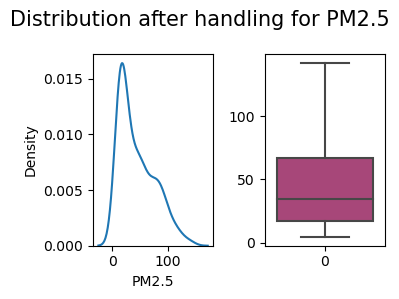

0      44.2374
1      35.1186
2      27.2136
3      28.9068
4      27.8664
        ...   
360    40.0050
361    34.4715
362    33.1800
363    29.2635
364    28.4025
Name: PM10, Length: 365, dtype: float64


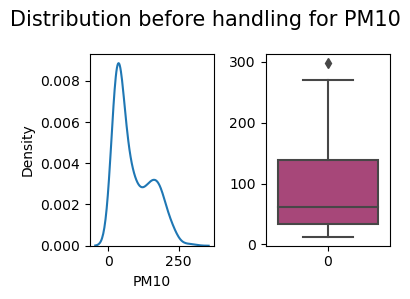

(365, 16)
365
365
(365, 16)
0      44.2374
1      35.1186
2      27.2136
3      28.9068
4      27.8664
        ...   
360    40.0050
361    34.4715
362    33.1800
363    29.2635
364    28.4025
Name: PM10, Length: 365, dtype: float64


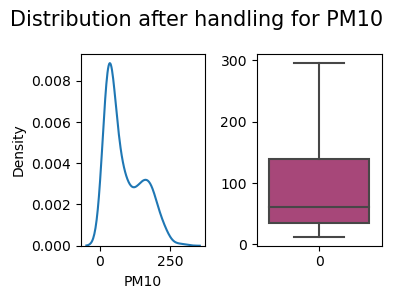

0      0.29580
1      0.33660
2      0.38760
3      0.38760
4      0.35700
        ...   
360    0.47250
361    0.42525
362    0.43050
363    0.49350
364    0.46200
Name: CO, Length: 365, dtype: float64


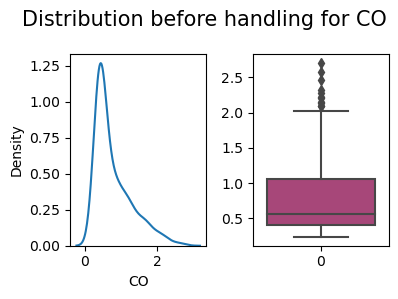

(365, 16)
365
365
(365, 16)
0      0.29580
1      0.33660
2      0.38760
3      0.38760
4      0.35700
        ...   
360    0.47250
361    0.42525
362    0.43050
363    0.49350
364    0.46200
Name: CO, Length: 365, dtype: float64


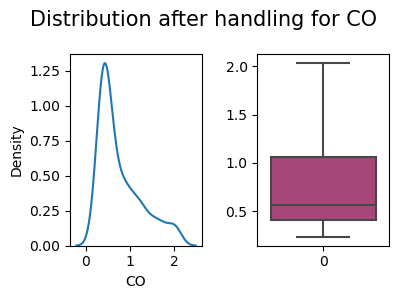

0      0.85680
1      0.99960
2      0.98940
3      1.18320
4      1.33620
        ...   
360    7.53900
361    5.53875
362    7.41300
363    7.93800
364    7.63350
Name: SO2, Length: 365, dtype: float64


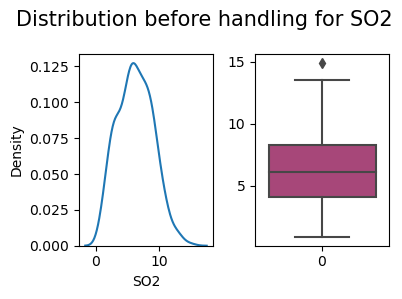

(365, 16)
365
365
(365, 16)
0      0.85680
1      0.99960
2      0.98940
3      1.18320
4      1.33620
        ...   
360    7.53900
361    5.53875
362    7.41300
363    7.93800
364    7.63350
Name: SO2, Length: 365, dtype: float64


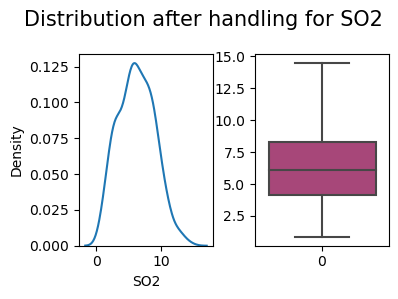

0      55.00860
1      37.53600
2      41.25900
3      52.59120
4      45.21660
         ...   
360    40.96050
361    43.14975
362    32.62350
363    38.04150
364    41.49600
Name: O3, Length: 365, dtype: float64


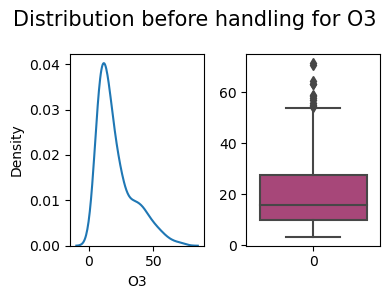

(365, 16)
365
365
(365, 16)
0      53.74380
1      37.53600
2      41.25900
3      52.59120
4      45.21660
         ...   
360    40.96050
361    43.14975
362    32.62350
363    38.04150
364    41.49600
Name: O3, Length: 365, dtype: float64


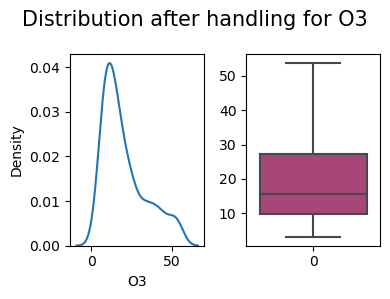

0      80.0
1      56.0
2      54.0
3      66.0
4      56.0
       ... 
360    61.0
361    63.0
362    45.0
363    51.0
364    55.0
Name: AQI, Length: 365, dtype: float64


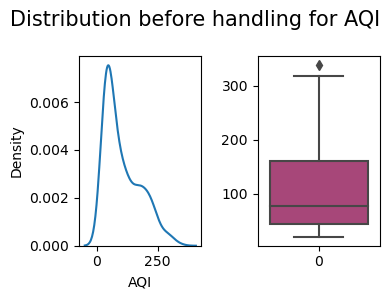

(365, 16)
365
365
(365, 16)
0      80.0
1      56.0
2      54.0
3      66.0
4      56.0
       ... 
360    61.0
361    63.0
362    45.0
363    51.0
364    55.0
Name: AQI, Length: 365, dtype: float64


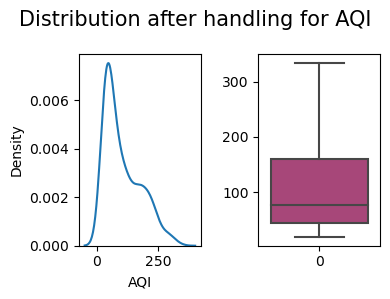

NEW LOCATION - 38
0      271.2100
1      238.1200
2      222.3100
3      197.6800
4      154.6400
         ...   
571     17.6820
572     17.6820
573     16.5795
574     15.3930
575     17.0310
Name: PM2.5, Length: 576, dtype: float64


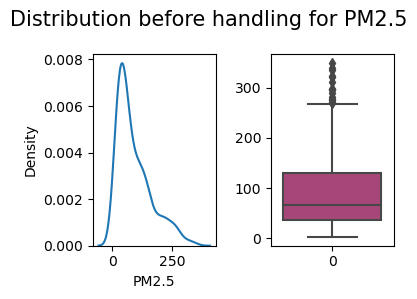

(576, 16)
576
576
(576, 16)
0      268.372913
1      238.120000
2      222.310000
3      197.680000
4      154.640000
          ...    
571     17.682000
572     17.682000
573     16.579500
574     15.393000
575     17.031000
Name: PM2.5, Length: 576, dtype: float64


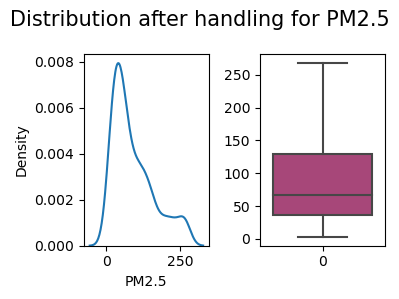

0      283.7200
1      303.2200
2      362.5500
3      327.5900
4      259.6800
         ...   
571     43.8900
572     43.8900
573     33.5895
574     36.7920
575     32.6550
Name: PM10, Length: 576, dtype: float64


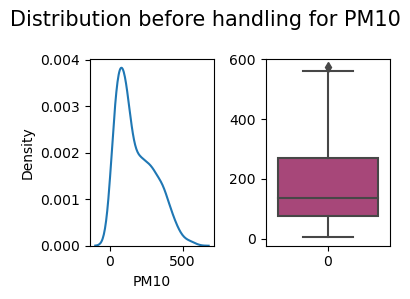

(576, 16)
576
576
(576, 16)
0      283.7200
1      303.2200
2      362.5500
3      327.5900
4      259.6800
         ...   
571     43.8900
572     43.8900
573     33.5895
574     36.7920
575     32.6550
Name: PM10, Length: 576, dtype: float64


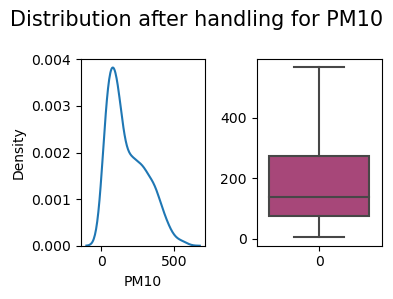

0      1.0800
1      1.3200
2      1.1700
3      1.0600
4      1.0000
        ...  
571    0.2310
572    0.2310
573    0.2415
574    0.2625
575    0.3150
Name: CO, Length: 576, dtype: float64


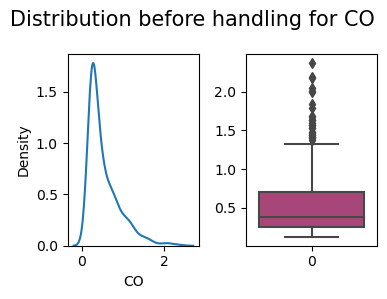

(576, 16)
576
576
(576, 16)
0      1.0800
1      1.3200
2      1.1700
3      1.0600
4      1.0000
        ...  
571    0.2310
572    0.2310
573    0.2415
574    0.2625
575    0.3150
Name: CO, Length: 576, dtype: float64


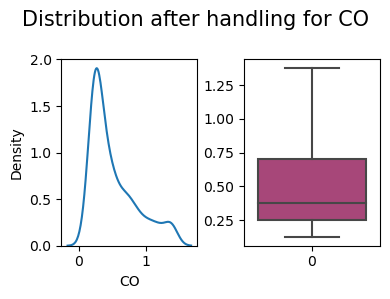

0      14.920
1      22.520
2      20.750
3      21.880
4      17.890
        ...  
571     9.912
572     9.912
573    12.285
574    12.159
575    11.970
Name: SO2, Length: 576, dtype: float64


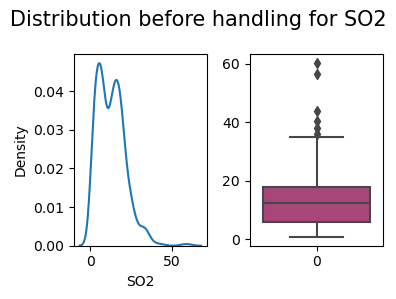

(576, 16)
576
576
(576, 16)
0      14.920
1      22.520
2      20.750
3      21.880
4      17.890
        ...  
571     9.912
572     9.912
573    12.285
574    12.159
575    11.970
Name: SO2, Length: 576, dtype: float64


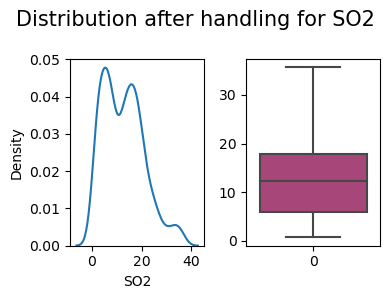

0      46.2300
1      63.9400
2      66.9200
3      40.5200
4      34.8200
        ...   
571    44.6670
572    44.6670
573    64.1235
574    73.7835
575    81.0075
Name: O3, Length: 576, dtype: float64


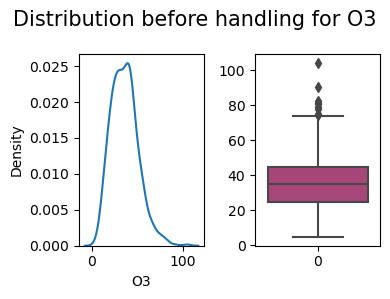

(576, 16)
576
576
(576, 16)
0      46.230000
1      63.940000
2      66.920000
3      40.520000
4      34.820000
         ...    
571    44.667000
572    44.667000
573    64.123500
574    73.783500
575    74.203162
Name: O3, Length: 576, dtype: float64


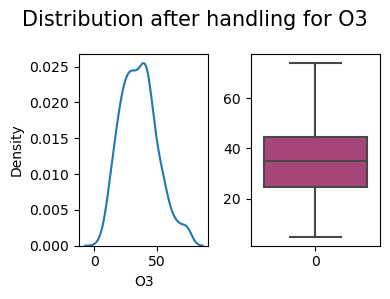

0      409.0
1      415.0
2      365.0
3      378.0
4      332.0
       ...  
571     48.0
572     48.0
573     98.0
574    107.0
575    142.0
Name: AQI, Length: 576, dtype: float64


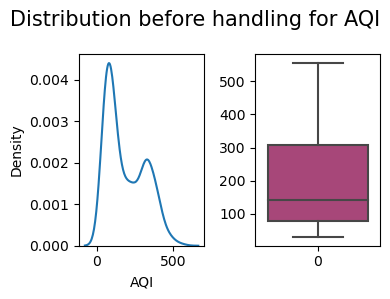

(576, 16)
576
576
(576, 16)
0      409.0
1      415.0
2      365.0
3      378.0
4      332.0
       ...  
571     48.0
572     48.0
573     98.0
574    107.0
575    142.0
Name: AQI, Length: 576, dtype: float64


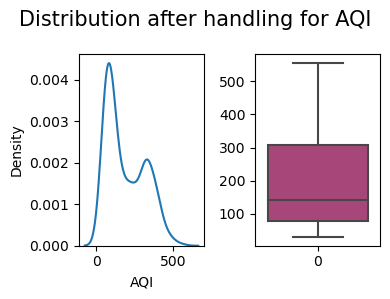

NEW LOCATION - 39
0      29.0000
1      21.7000
2      23.0900
3      21.5600
4      30.2800
        ...   
779    16.3275
780    15.2880
781    14.1015
782    17.8605
783    16.6215
Name: PM2.5, Length: 784, dtype: float64


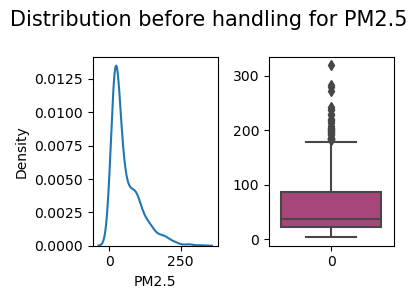

(784, 16)
784
784
(784, 16)
0      29.0000
1      21.7000
2      23.0900
3      21.5600
4      30.2800
        ...   
779    16.3275
780    15.2880
781    14.1015
782    17.8605
783    16.6215
Name: PM2.5, Length: 784, dtype: float64


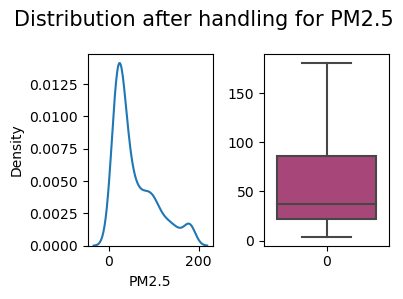

0      50.8700
1      43.0400
2      46.4900
3      42.1000
4      54.8900
        ...   
779    33.8940
780    29.9145
781    31.1325
782    30.5340
783    28.8750
Name: PM10, Length: 784, dtype: float64


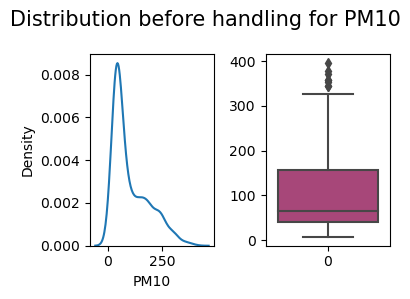

(784, 16)
784
784
(784, 16)
0      50.8700
1      43.0400
2      46.4900
3      42.1000
4      54.8900
        ...   
779    33.8940
780    29.9145
781    31.1325
782    30.5340
783    28.8750
Name: PM10, Length: 784, dtype: float64


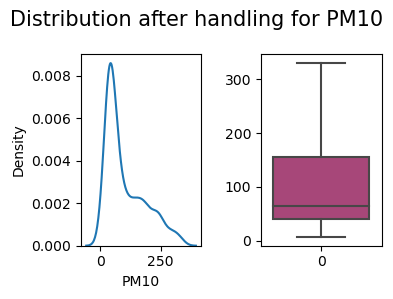

0      0.98000
1      0.73000
2      0.98000
3      1.00000
4      0.81000
        ...   
779    0.65100
780    0.63525
781    0.67200
782    0.59850
783    0.66150
Name: CO, Length: 784, dtype: float64


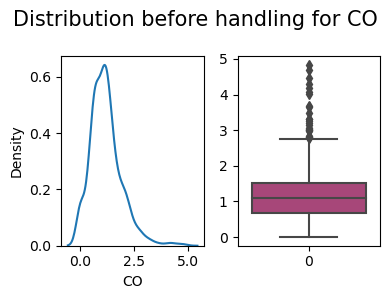

(784, 16)
784
784
(784, 16)
0      0.98000
1      0.73000
2      0.98000
3      1.00000
4      0.81000
        ...   
779    0.65100
780    0.63525
781    0.67200
782    0.59850
783    0.66150
Name: CO, Length: 784, dtype: float64


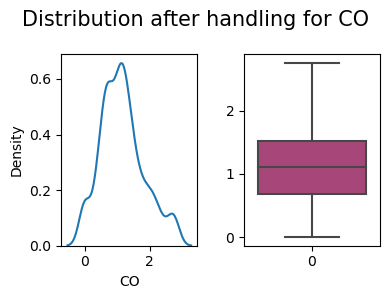

0      10.3200
1      10.3200
2      10.3200
3      10.3200
4      10.3200
        ...   
779     3.5490
780     2.9400
781     5.4285
782     7.4235
783    11.3190
Name: SO2, Length: 784, dtype: float64


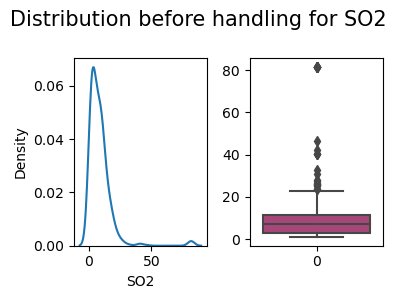

(784, 16)
784
784
(784, 16)
0      10.3200
1      10.3200
2      10.3200
3      10.3200
4      10.3200
        ...   
779     3.5490
780     2.9400
781     5.4285
782     7.4235
783    11.3190
Name: SO2, Length: 784, dtype: float64


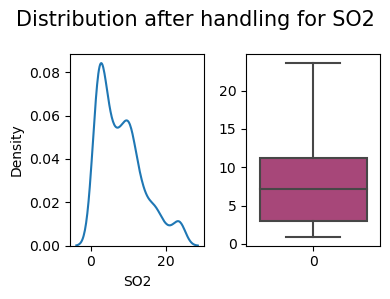

0      30.9900
1      43.7200
2      41.6500
3      44.0700
4      63.8800
        ...   
779    36.5190
780    37.2225
781    27.1845
782    30.0510
783    37.2120
Name: O3, Length: 784, dtype: float64


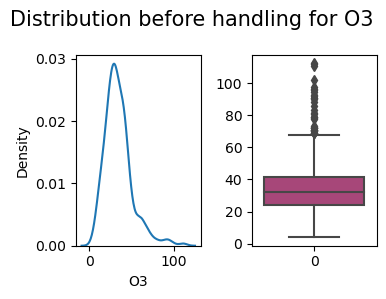

(784, 16)
784
784
(784, 16)
0      30.9900
1      43.7200
2      41.6500
3      44.0700
4      63.8800
        ...   
779    36.5190
780    37.2225
781    27.1845
782    30.0510
783    37.2120
Name: O3, Length: 784, dtype: float64


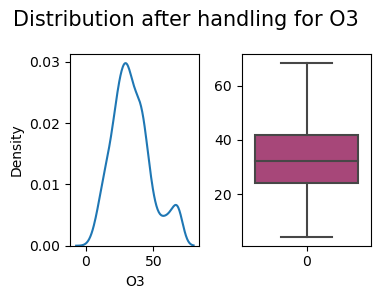

0      73.0
1      60.0
2      74.0
3      83.0
4      95.0
       ... 
779    47.0
780    52.0
781    41.0
782    40.0
783    48.0
Name: AQI, Length: 784, dtype: float64


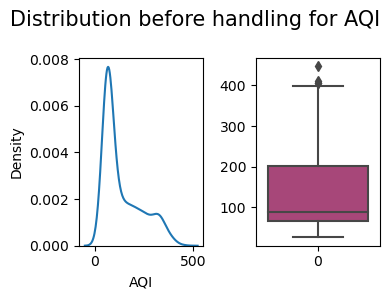

(784, 16)
784
784
(784, 16)
0      73.0
1      60.0
2      74.0
3      83.0
4      95.0
       ... 
779    47.0
780    52.0
781    41.0
782    40.0
783    48.0
Name: AQI, Length: 784, dtype: float64


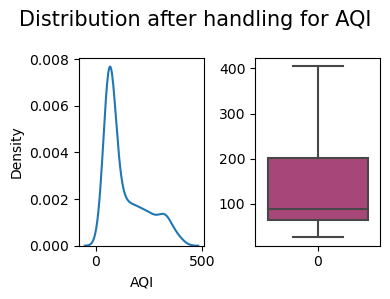

In [229]:
outlier_handled_df = pd.DataFrame(columns = df2.columns)  

for station in sorted(df2['ID'].unique().tolist()):
    
    print('NEW LOCATION -',station)
    location_train_df = df2[df2["ID"] == station]
    
    location_train_df = location_train_df.reset_index()
    
    #column 1 - PM2.5 outlier handling
    col = 'PM2.5'
    outlier_detection(location_train_df,col,'before')
    location_train_df = skewed_outlier_handling(location_train_df,col)
    outlier_detection(location_train_df,col,'after')
    
    #column 2 - PM10 outlier handling
    col = 'PM10'
    outlier_detection(location_train_df,col,'before')
    location_train_df = skewed_outlier_handling(location_train_df,col)
    outlier_detection(location_train_df,col,'after')
    
    #column 3 - CO outlier handling
    col = 'CO'
    outlier_detection(location_train_df,col,'before')
    location_train_df = skewed_outlier_handling(location_train_df,col)
    outlier_detection(location_train_df,col,'after')
    
    #column 4 - SO2 outlier handling
    col = 'SO2'
    outlier_detection(location_train_df,col,'before')
    location_train_df = skewed_outlier_handling(location_train_df,col)
    outlier_detection(location_train_df,col,'after')
    
    #column 5 - O3 outlier handling
    col = 'O3'
    outlier_detection(location_train_df,col,'before')
    location_train_df = skewed_outlier_handling(location_train_df,col)
    outlier_detection(location_train_df,col,'after')
    
    #column 6 - AQI outlier handling
    col = 'AQI'
    outlier_detection(location_train_df,col,'before')
    location_train_df = skewed_outlier_handling(location_train_df,col)
    outlier_detection(location_train_df,col,'after')
    
    outlier_handled_df = outlier_handled_df.append(location_train_df,ignore_index = True)

In [230]:
for i in ['DayOfWeek', 'DayOfMonth', 'WeekOfYear', 'Month', 'DayOfYear', 'ID']:
    outlier_handled_df[i] = outlier_handled_df[i].astype('int64')

In [231]:
outlier_handled_df.shape

(25823, 16)

In [232]:
outlier_handled_df = outlier_handled_df.drop(['ID_Date','index'],axis = 1)

In [233]:
outlier_handled_df

,StateCode,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID
0,AS,2021-08-17,51.8364,120.3702,18.0234,0.48960,14.310600,94.0,1,17,33,8,229,0
1,AS,2021-08-18,59.4762,87.0978,34.5270,0.47940,14.759400,124.0,2,18,33,8,230,0
2,AS,2021-08-19,61.0776,79.6008,42.0546,0.52020,16.748400,82.0,3,19,33,8,231,0
3,AS,2021-08-20,56.7222,94.2072,45.7878,0.49980,23.342738,107.0,4,20,33,8,232,0
4,AS,2021-08-21,85.3332,136.7820,44.5638,1.11180,23.342738,107.0,5,21,33,8,233,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25818,WB,2022-11-29,16.3275,33.8940,36.5190,0.65100,3.549000,47.0,1,29,48,11,333,39
25819,WB,2022-11-30,15.2880,29.9145,37.2225,0.63525,2.940000,52.0,2,30,48,11,334,39
25820,WB,2022-12-01,14.1015,31.1325,27.1845,0.67200,5.428500,41.0,3,1,48,12,335,39
25821,WB,2022-12-02,17.8605,30.5340,30.0510,0.59850,7.423500,40.0,4,2,48,12,336,39


In [234]:
outlier_handled_df.ID.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39])

In [235]:
outlier_handled_df[outlier_handled_df.ID == 2]

,StateCode,Date,PM2.5,PM10,O3,CO,SO2,AQI,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear,ID
1045,DL,2020-08-02,187.250,359.17000,35.316451,0.9700,11.00000,376.0,6,2,31,8,215,2
1046,DL,2020-08-03,146.500,299.54000,19.523508,0.8500,14.29000,329.0,0,3,32,8,216,2
1047,DL,2020-08-04,174.880,305.00000,3.380000,0.8800,13.66000,340.0,1,4,32,8,217,2
1048,DL,2020-08-05,209.420,369.75000,27.580000,1.0300,16.38000,357.0,2,5,32,8,218,2
1049,DL,2020-08-06,172.460,332.79000,25.520000,0.9400,14.22000,355.0,3,6,32,8,219,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1894,DL,2022-11-29,22.953,44.36250,43.102500,0.6405,14.10150,104.0,1,29,48,11,333,2
1895,DL,2022-11-30,29.694,34.02525,40.913250,0.6195,13.37175,61.5,2,30,48,11,334,2
1896,DL,2022-12-01,56.574,58.74750,39.406500,0.7770,18.93150,85.0,3,1,48,12,335,2
1897,DL,2022-12-02,45.801,89.98500,43.932000,0.7350,16.64250,90.0,4,2,48,12,336,2


In [255]:
outlier_handled_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25823 entries, 0 to 25822
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   StateCode   25823 non-null  object        
 1   Date        25823 non-null  datetime64[ns]
 2   PM2.5       25823 non-null  float64       
 3   PM10        25823 non-null  float64       
 4   O3          25823 non-null  float64       
 5   CO          25823 non-null  float64       
 6   SO2         25823 non-null  float64       
 7   AQI         25823 non-null  float64       
 8   DayOfWeek   25823 non-null  int64         
 9   DayOfMonth  25823 non-null  int64         
 10  WeekOfYear  25823 non-null  int64         
 11  Month       25823 non-null  int64         
 12  DayOfYear   25823 non-null  int64         
 13  ID          25823 non-null  int64         
dtypes: datetime64[ns](1), float64(6), int64(6), object(1)
memory usage: 2.8+ MB


<div class="alert alert-block alert-info" style="font-size:17px; font-family:nexa">

Based on above observations, following steps need to be taken for test set preparation - 
    
  - Conversion of categorical columns to numerical columns (ID)
  - Feature Engineering 

In [236]:
sample_df

,ID_Date,AQI,StateCode,StationId,Date
0,AS_4_2022-12-04,10.0,AS,4,2022-12-04
1,AS_4_2022-12-05,10.0,AS,4,2022-12-05
2,AS_4_2022-12-06,10.0,AS,4,2022-12-06
3,AS_4_2022-12-07,10.0,AS,4,2022-12-07
4,AS_4_2022-12-08,10.0,AS,4,2022-12-08
...,...,...,...,...,...
1115,WB_16_2022-12-27,10.0,WB,16,2022-12-27
1116,WB_16_2022-12-28,10.0,WB,16,2022-12-28
1117,WB_16_2022-12-29,10.0,WB,16,2022-12-29
1118,WB_16_2022-12-30,10.0,WB,16,2022-12-30


In [237]:
test_df = sample_df.copy()

In [238]:
test_df

,ID_Date,AQI,StateCode,StationId,Date
0,AS_4_2022-12-04,10.0,AS,4,2022-12-04
1,AS_4_2022-12-05,10.0,AS,4,2022-12-05
2,AS_4_2022-12-06,10.0,AS,4,2022-12-06
3,AS_4_2022-12-07,10.0,AS,4,2022-12-07
4,AS_4_2022-12-08,10.0,AS,4,2022-12-08
...,...,...,...,...,...
1115,WB_16_2022-12-27,10.0,WB,16,2022-12-27
1116,WB_16_2022-12-28,10.0,WB,16,2022-12-28
1117,WB_16_2022-12-29,10.0,WB,16,2022-12-29
1118,WB_16_2022-12-30,10.0,WB,16,2022-12-30


In [239]:
test_df["ID"] = test_df['StateCode'] + "-" + test_df["StationId"].astype(str)
test_df['ID'] = mle.transform(test_df['ID'])
test_df['ID'] = test_df['ID'].astype('int64')

In [240]:
test_df.drop(['StationId'],axis = 1,inplace=True)

In [241]:
test_df.head(10)

,ID_Date,AQI,StateCode,Date,ID
0,AS_4_2022-12-04,10.0,AS,2022-12-04,0
1,AS_4_2022-12-05,10.0,AS,2022-12-05,0
2,AS_4_2022-12-06,10.0,AS,2022-12-06,0
3,AS_4_2022-12-07,10.0,AS,2022-12-07,0
4,AS_4_2022-12-08,10.0,AS,2022-12-08,0
5,AS_4_2022-12-09,10.0,AS,2022-12-09,0
6,AS_4_2022-12-10,10.0,AS,2022-12-10,0
7,AS_4_2022-12-11,10.0,AS,2022-12-11,0
8,AS_4_2022-12-12,10.0,AS,2022-12-12,0
9,AS_4_2022-12-13,10.0,AS,2022-12-13,0


In [242]:
test_df['DateTime'] = pd.to_datetime(test_df['Date'], infer_datetime_format=True)

test_df['Date']       = test_df['DateTime'].dt.date.astype('datetime64')
test_df['DayOfWeek']  = test_df['DateTime'].dt.day_of_week
test_df['DayOfMonth'] = test_df['DateTime'].dt.day
test_df['WeekOfYear'] = test_df['DateTime'].dt.week
test_df['Month']      = test_df['DateTime'].dt.month
test_df['DayOfYear']  = test_df['DateTime'].dt.dayofyear

test_df.drop(columns='DateTime', inplace=True, axis=1)

test_df.head()

,ID_Date,AQI,StateCode,Date,ID,DayOfWeek,DayOfMonth,WeekOfYear,Month,DayOfYear
0,AS_4_2022-12-04,10.0,AS,2022-12-04,0,6,4,48,12,338
1,AS_4_2022-12-05,10.0,AS,2022-12-05,0,0,5,49,12,339
2,AS_4_2022-12-06,10.0,AS,2022-12-06,0,1,6,49,12,340
3,AS_4_2022-12-07,10.0,AS,2022-12-07,0,2,7,49,12,341
4,AS_4_2022-12-08,10.0,AS,2022-12-08,0,3,8,49,12,342


In [243]:
#create test data set with all pollutant variables for multivariate time series
import pmdarima as pm
results_df = pd.DataFrame(columns = outlier_handled_df.columns)  
for station in outlier_handled_df['ID'].unique():
    print('NEW LOCATION -',station)
    location_train_df = outlier_handled_df[outlier_handled_df["ID"] == station]
    location_test_df = test_df[test_df["ID"] == station]
    
    #column 1 - PM2.5 prediction 
    model = pm.auto_arima(location_train_df['PM2.5'],test='adf',error_action='ignore',  
                           suppress_warnings=True,
                      stepwise=True, trace=True)
    model.fit(location_train_df['PM2.5'])
    forecast=model.predict(n_periods=28, return_conf_int=True)
    location_test_df['PM2.5'] = np.array(forecast[0])
    
    
    #column 2 - PM10 prediction 
    model = pm.auto_arima(location_train_df['PM10'],test='adf',error_action='ignore',  
                           suppress_warnings=True,
                      stepwise=True, trace=True)
    model.fit(location_train_df['PM10'])
    forecast=model.predict(n_periods=28, return_conf_int=True)
    location_test_df['PM10'] = np.array(forecast[0])
    
    
    #column 3 - O3 prediction 
    model = pm.auto_arima(location_train_df['O3'],test='adf',error_action='ignore',  
                           suppress_warnings=True,
                      stepwise=True, trace=True)
    model.fit(location_train_df['O3'])
    forecast=model.predict(n_periods=28, return_conf_int=True)
    location_test_df['O3'] = np.array(forecast[0])
    
    
    #column 4 - CO prediction 
    model = pm.auto_arima(location_train_df['CO'],test='adf',error_action='ignore',  
                           suppress_warnings=True,
                      stepwise=True, trace=True)
    model.fit(location_train_df['CO'])
    forecast=model.predict(n_periods=28, return_conf_int=True)
    location_test_df['CO'] = np.array(forecast[0])
    
    #column 5 - SO2 prediction 
    model = pm.auto_arima(location_train_df['SO2'],test='adf',error_action='ignore',  
                           suppress_warnings=True,
                      stepwise=True, trace=True)
    model.fit(location_train_df['SO2'])
    forecast=model.predict(n_periods=28, return_conf_int=True)
    location_test_df['SO2'] = np.array(forecast[0])
        
    print(location_test_df)
    results_df = results_df.append(location_test_df,ignore_index = True)

NEW LOCATION - 0
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4388.900, Time=1.07 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4476.409, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4467.639, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4454.187, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4474.412, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4387.829, Time=0.35 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4393.824, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4392.997, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4388.757, Time=0.81 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=4386.803, Time=0.40 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=4388.767, Time=0.94 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=4390.750, Time=1.06 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=4385.039, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=4391.996, Time=0.21 sec
 ARIMA(1,1,3)(0,

In [244]:
final_train_df = outlier_handled_df.copy()
final_test_df = results_df.copy()

In [245]:
final_train_df.shape

(25823, 14)

In [246]:
final_test_df.head

<bound method NDFrame.head of      StateCode       Date      PM2.5       PM10         O3        CO  \
0           AS 2022-12-04  18.874280  32.257500  42.990609  0.439418   
1           AS 2022-12-05  19.847572  35.182928  40.845752  0.457979   
2           AS 2022-12-06  20.355641  35.182928  39.721339  0.465124   
3           AS 2022-12-07  20.355641  35.182928  39.131881  0.465124   
4           AS 2022-12-08  20.355641  35.182928  38.822865  0.465124   
...        ...        ...        ...        ...        ...       ...   
1115        WB 2022-12-27  16.413969  31.288756  34.186154  0.648434   
1116        WB 2022-12-28  16.413969  31.288764  34.186600  0.648434   
1117        WB 2022-12-29  16.413969  31.288766  34.187036  0.648434   
1118        WB 2022-12-30  16.413969  31.288765  34.187462  0.648434   
1119        WB 2022-12-31  16.413969  31.288763  34.187879  0.648434   

            SO2   AQI DayOfWeek DayOfMonth WeekOfYear Month DayOfYear  ID  \
0     16.214026  10.0       

In [247]:
final_test_df.drop(columns=['AQI'], axis=1, inplace=True)

In [248]:
for i in ['DayOfWeek', 'DayOfMonth', 'WeekOfYear', 'Month', 'DayOfYear', 'ID']:
    final_test_df[i] = final_test_df[i].astype('int64')

final_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1120 entries, 0 to 1119
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   StateCode   1120 non-null   object        
 1   Date        1120 non-null   datetime64[ns]
 2   PM2.5       1120 non-null   float64       
 3   PM10        1120 non-null   float64       
 4   O3          1120 non-null   float64       
 5   CO          1120 non-null   float64       
 6   SO2         1120 non-null   float64       
 7   DayOfWeek   1120 non-null   int64         
 8   DayOfMonth  1120 non-null   int64         
 9   WeekOfYear  1120 non-null   int64         
 10  Month       1120 non-null   int64         
 11  DayOfYear   1120 non-null   int64         
 12  ID          1120 non-null   int64         
 13  ID_Date     1120 non-null   object        
dtypes: datetime64[ns](1), float64(5), int64(6), object(2)
memory usage: 122.6+ KB


In [249]:
final_train_df.to_csv('new_train_after_outlier_removal.csv', index=False)
final_test_df.to_csv('new_test_after_outlier_removal.csv', index=False)

# Before inputting data in model , lets normalise data.

Shapiro Test
PM2.5 Statistics=0.839, p=0.000
PM2.5 does not appear to be normally distributed (reject H0)
Anderson Test
PM2.5 Statistic: 1285.711
PM2.5 does not appear to be normally distributed (reject H0) at the 15.0% level
PM2.5 does not appear to be normally distributed (reject H0) at the 10.0% level
PM2.5 does not appear to be normally distributed (reject H0) at the 5.0% level
PM2.5 does not appear to be normally distributed (reject H0) at the 2.5% level
PM2.5 does not appear to be normally distributed (reject H0) at the 1.0% level


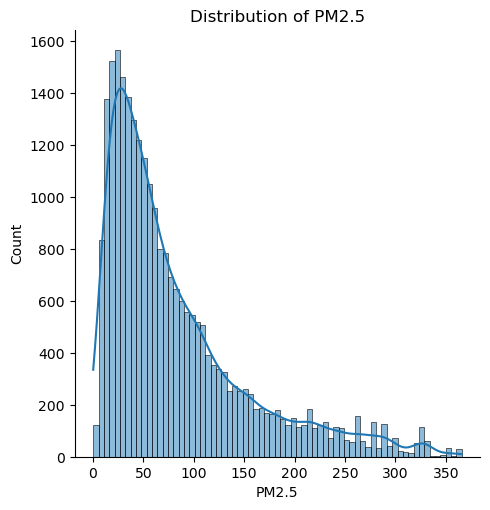

Shapiro Test
PM10 Statistics=0.903, p=0.000
PM10 does not appear to be normally distributed (reject H0)
Anderson Test
PM10 Statistic: 699.137
PM10 does not appear to be normally distributed (reject H0) at the 15.0% level
PM10 does not appear to be normally distributed (reject H0) at the 10.0% level
PM10 does not appear to be normally distributed (reject H0) at the 5.0% level
PM10 does not appear to be normally distributed (reject H0) at the 2.5% level
PM10 does not appear to be normally distributed (reject H0) at the 1.0% level


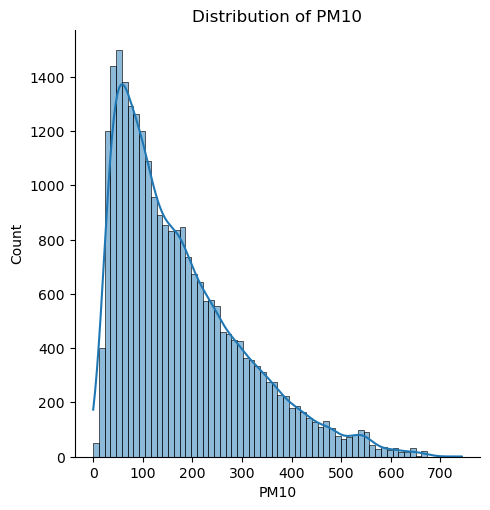

Shapiro Test
O3 Statistics=0.945, p=0.000
O3 does not appear to be normally distributed (reject H0)
Anderson Test
O3 Statistic: 324.759
O3 does not appear to be normally distributed (reject H0) at the 15.0% level
O3 does not appear to be normally distributed (reject H0) at the 10.0% level
O3 does not appear to be normally distributed (reject H0) at the 5.0% level
O3 does not appear to be normally distributed (reject H0) at the 2.5% level
O3 does not appear to be normally distributed (reject H0) at the 1.0% level


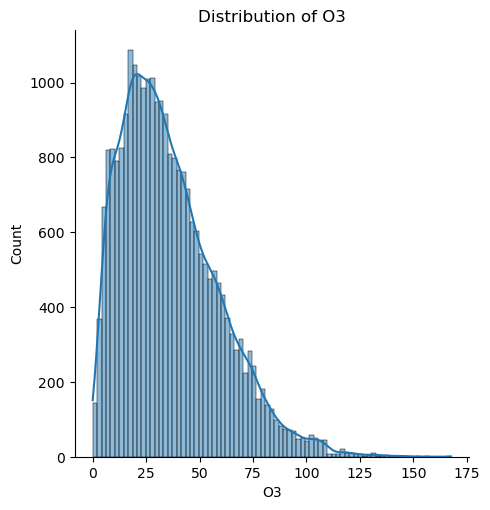

Shapiro Test
CO Statistics=0.929, p=0.000
CO does not appear to be normally distributed (reject H0)
Anderson Test
CO Statistic: 464.548
CO does not appear to be normally distributed (reject H0) at the 15.0% level
CO does not appear to be normally distributed (reject H0) at the 10.0% level
CO does not appear to be normally distributed (reject H0) at the 5.0% level
CO does not appear to be normally distributed (reject H0) at the 2.5% level
CO does not appear to be normally distributed (reject H0) at the 1.0% level


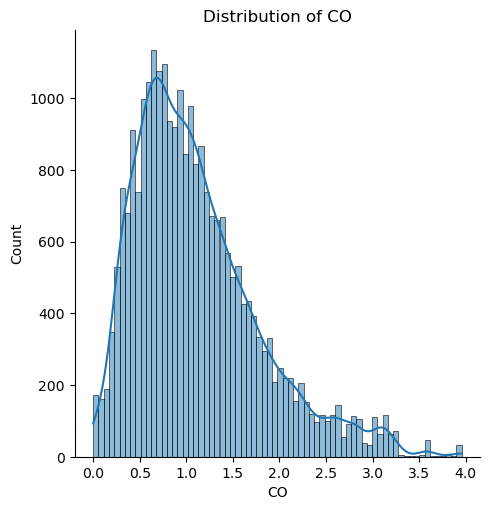

Shapiro Test
SO2 Statistics=0.929, p=0.000
SO2 does not appear to be normally distributed (reject H0)
Anderson Test
SO2 Statistic: 416.812
SO2 does not appear to be normally distributed (reject H0) at the 15.0% level
SO2 does not appear to be normally distributed (reject H0) at the 10.0% level
SO2 does not appear to be normally distributed (reject H0) at the 5.0% level
SO2 does not appear to be normally distributed (reject H0) at the 2.5% level
SO2 does not appear to be normally distributed (reject H0) at the 1.0% level


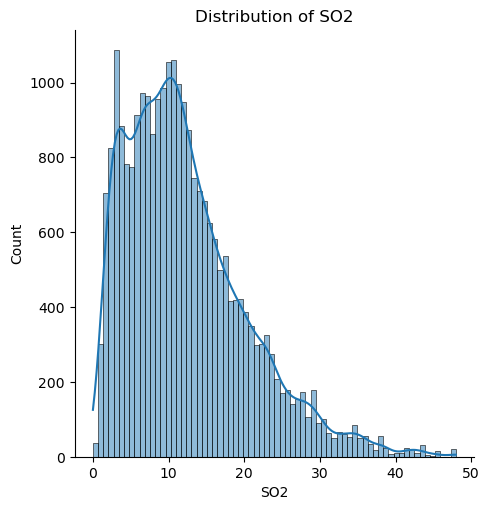

In [250]:
from scipy.stats import anderson, shapiro

# extract the numerical columns from your data
numerical_cols = ['PM2.5', 'PM10', 'O3', 'CO', 'SO2']

# perform the Anderson-Darling test and plot the distribution for each numerical column
for col in numerical_cols:
    print('Shapiro Test')
    stat, p = shapiro(final_train_df[col])
    print(col, 'Statistics=%.3f, p=%.3f' % (stat, p))
    
    # interpret the p-value
    alpha = 0.05
    if p > alpha:
        print(col, 'appears to be normally distributed (fail to reject H0)')
    else:
        print(col, 'does not appear to be normally distributed (reject H0)')
    
    print('Anderson Test')
    result = anderson(final_train_df[col])
    print(col, 'Statistic: %.3f' % result.statistic)
    for i in range(len(result.critical_values)):
        sl, cv = result.significance_level[i], result.critical_values[i]
        if result.statistic < cv:
            print(col, 'appears to be normally distributed (fail to reject H0) at the %.1f%% level' % (sl))
        else:
            print(col, 'does not appear to be normally distributed (reject H0) at the %.1f%% level' % (sl))

    # plot the distribution of each numerical column
    sns.displot(final_train_df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

In [251]:
final_train_df_scaled = final_train_df.copy()
final_test_df_scaled = final_test_df.copy()

final_train_df_standardized = final_train_df.copy()
final_test_df_standardized = final_test_df.copy()

In [252]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# define the numerical columns to be standardized/scaled
numerical_cols = ['PM2.5', 'PM10', 'O3', 'CO', 'SO2']

# define the ColumnTransformers with StandardScaler and MinMaxScaler
sct = ColumnTransformer(
    transformers=[('num', StandardScaler(), numerical_cols)]
)

mmct = ColumnTransformer(
    transformers=[('num', MinMaxScaler(), numerical_cols)]
)

# fit the scaler to final_train_df and transform it
sct.fit(final_train_df[numerical_cols])
mmct.fit(final_train_df[numerical_cols])

final_train_df_standardized[numerical_cols] = sct.transform(final_train_df[numerical_cols])
final_train_df_scaled[numerical_cols] = mmct.transform(final_train_df[numerical_cols])

# transform final_test_df using the fitted scaler
final_test_df_standardized[numerical_cols] = sct.transform(final_test_df[numerical_cols])
final_test_df_scaled[numerical_cols] = mmct.transform(final_test_df[numerical_cols])

In [253]:
final_train_df_scaled.to_csv('new_train_after_outlier_removal_scaled.csv',index=False)
final_test_df_scaled.to_csv('new_test_after_outlier_removal_scaled.csv',index=False)

final_train_df_standardized.to_csv('new_train_after_outlier_removal_standardized.csv',index=False)
final_test_df_standardized.to_csv('new_test_after_outlier_removal_standardized.csv',index=False)